In [ ]:
!mkdir -p /etc/OpenCL/vendors && echo "libnvidia-opencl.so.1" > /etc/OpenCL/vendors/nvidia.icd

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import gc
import re
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from lightgbm import LGBMClassifier
from lightgbm import Dataset
import lightgbm as lgb
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import KFold
import warnings
from tqdm.notebook import tqdm

warnings.filterwarnings('ignore')

# Анализ данных

In [ ]:
!cd drive & ls

drive  sample_data


In [ ]:
current_data = pd.read_csv(r'/content/drive/MyDrive/Colab Notebooks/BIT_Home_Work/input/home-credit-default-risk/application_train.csv')

In [ ]:
current_data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


## Функции

In [ ]:
def num_plot(data, num_cols, remove=[], hist_bins=10, figsize=(20, 4)):

    if len(remove) >= 0:
        num_cols2 = [x for x in num_cols if (x not in remove)]

    for i in num_cols2:
        fig, axes = plt.subplots(1, 3, figsize=figsize)
        data.hist(str(i), bins=hist_bins, ax=axes[0])
        data.boxplot(str(i), ax=axes[1], vert=False);
        try:
            sns.kdeplot(np.array(data[str(i)]))
        except:
            ValueError

        axes[1].set_yticklabels([])
        axes[1].set_yticks([])
        axes[0].set_title(i + " | Histogram")
        axes[1].set_title(i + " | Boxplot")
        axes[2].set_title(i + " | Density")
        plt.show()

def corr_plot(data, remove=[], corr_coef = "pearson", figsize=(20, 20)):
    if len(remove) > 0:
        num_cols2 = [x for x in data.columns if (x not in remove)]

    sns.set(font_scale=1.1)
    c = data[num_cols2].corr(method = corr_coef)
    mask = np.triu(c.corr(method = corr_coef))
    plt.figure(figsize=figsize)
    sns.heatmap(c,
                annot=True,
                fmt='.1f',
                cmap='coolwarm',
                square=True,
                mask=mask,
                linewidths=1,
                cbar=False)
    plt.show()


def distributionGraphs(x):
    print("\033[1m\033[1;3mКолонка "+str(x)+"\033[0m")

    target_group = round(current_data.groupby('TARGET')[x].value_counts(normalize=True,sort=False)*100)
    cnt = int((target_group.count()/2))

    plt.figure(figsize=(18,6))

    plt.subplot(121)
    plt.title(str(x)+' Сгруппировали по таргету')
    ax = target_group.plot(kind='bar')

    for bar in ax.patches:
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_y() + bar.get_height()/2, str(bar.get_height()))

    plt.subplot(122)
    plt.title(str(x)+' Распределение')
    (current_data[x].value_counts(normalize=True)*100).plot(kind='pie', autopct = "%1.0f%%")
    plt.ylabel(' ')

    plt.show()
    print(target_group)
    print("\n\n")


def numericDistributionGraph(col):
    print("\033[1m\033[1;3mКолонка "+str(col)+"\033[0m")


    plt.figure(figsize=(18,10))

    plt.subplot(221)
    sns.distplot(current_data[col], kde=True, vertical=False, rug=False, bins=15)
    plt.title('Распределение признака '+col)

    plt.subplot(222)
    sns.boxplot(x='TARGET', y=col ,data=current_data,)
    plt.title('Распределение признака '+col+' по таргету')

    plt.subplot(223)
    sns.heatmap(current_data[['TARGET',col]].corr(), cmap='Greens')
    plt.title('Корреляция '+col+' с таргетом')
    plt.show()


## Анализ

Таргет

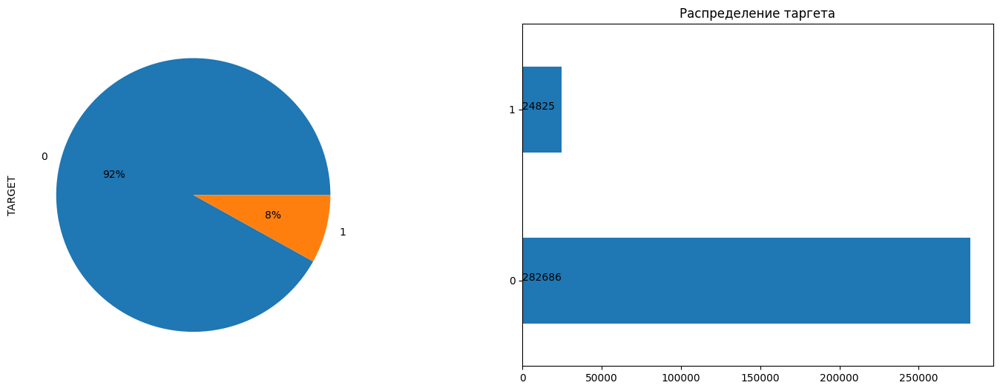

In [ ]:
plt.figure(figsize=(18,6))
plt.subplot(121)
current_data.TARGET.value_counts().plot(kind='pie', autopct = "%1.0f%%")
plt.subplot(122)
ax = current_data.TARGET.value_counts().plot(kind='barh')
for i,j in enumerate(current_data["TARGET"].value_counts().values):
    ax.text(10,i,j)
plt.title('Распределение таргета')
plt.show()

Отдельно рассмотрим числовые колонки и object

In [ ]:
object_cols = ['NAME_CONTRACT_TYPE',
'CODE_GENDER',
'FLAG_OWN_CAR',
'FLAG_OWN_REALTY',
'NAME_TYPE_SUITE',
'NAME_INCOME_TYPE',
'NAME_EDUCATION_TYPE',
'NAME_FAMILY_STATUS',
'NAME_HOUSING_TYPE',
'OCCUPATION_TYPE',
'WEEKDAY_APPR_PROCESS_START',
'ORGANIZATION_TYPE',
'FONDKAPREMONT_MODE',
'HOUSETYPE_MODE',
'WALLSMATERIAL_MODE',
'EMERGENCYSTATE_MODE']

data_obj_cols = object_cols
print('data_obj_cols : ',len(data_obj_cols))
data_numeric_cols = current_data.drop(columns=object_cols,axis=1).columns
print('data_numeric_cols : ',len(data_numeric_cols))

data_obj_cols :  16
data_numeric_cols :  106


**Первый взгляд на числовые колонки**

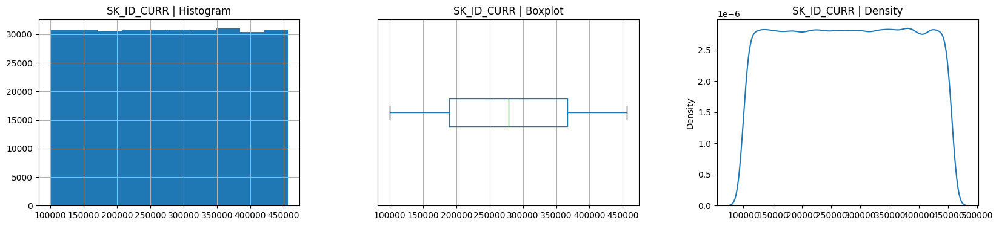

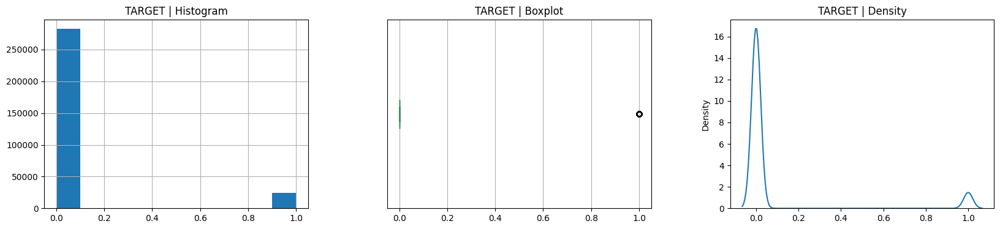

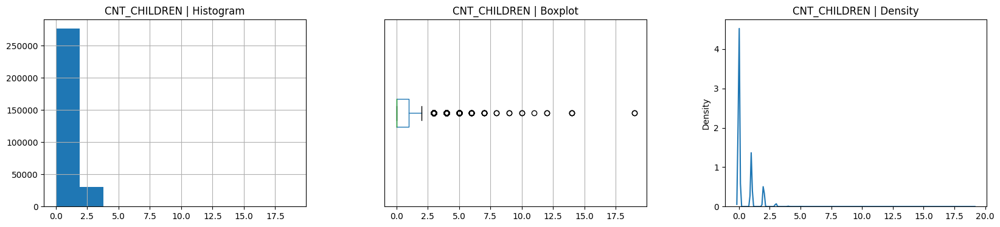

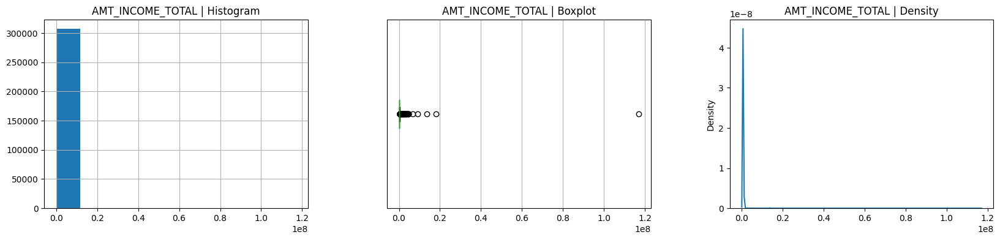

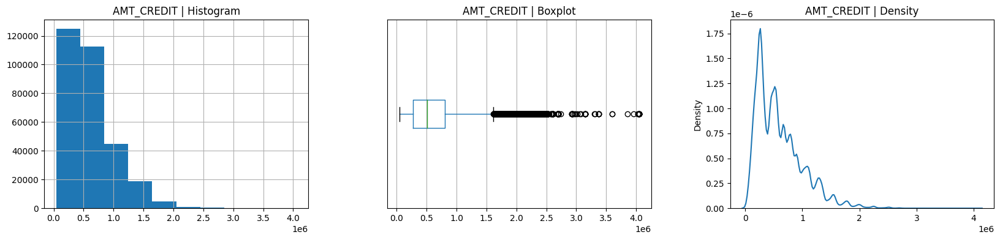

...

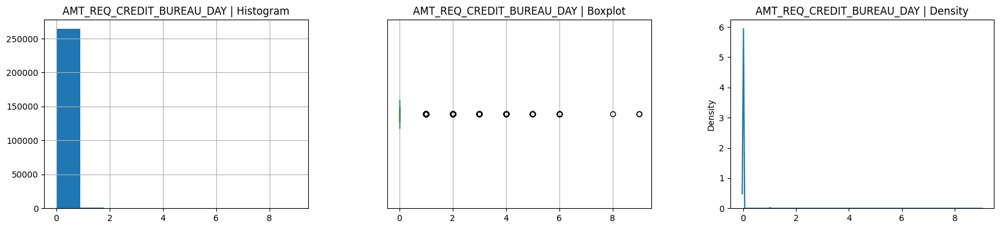

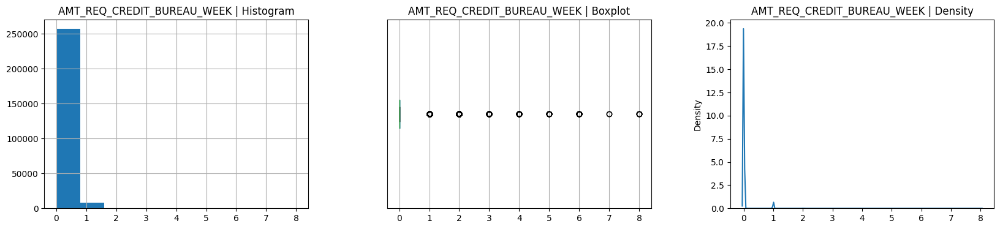

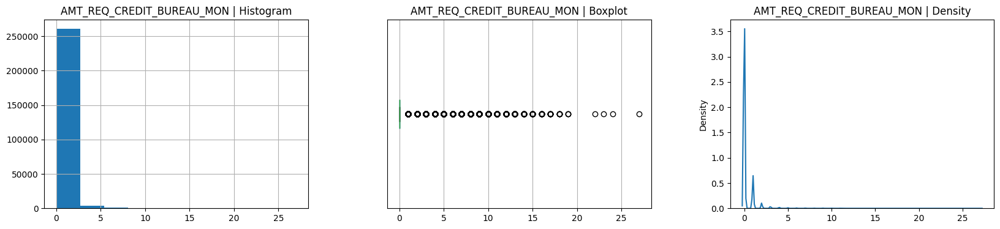

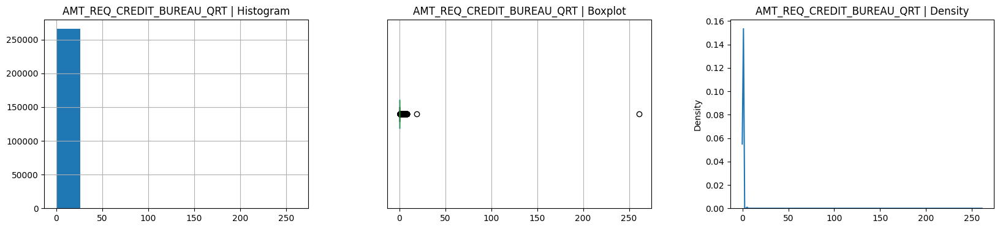

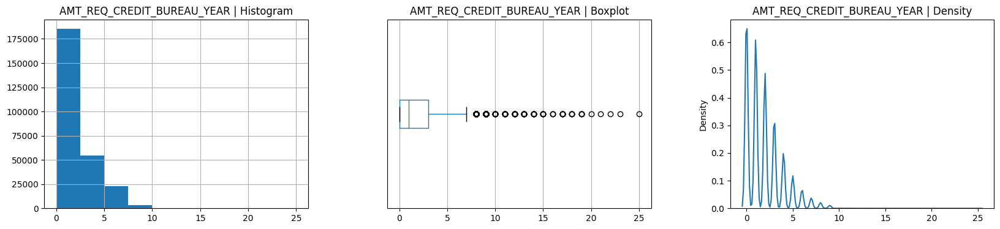

In [ ]:
num_plot(current_data, data_numeric_cols)

Сумма потери при случайно отданном кредите ненадежному человеку:

In [ ]:
df_loses = pd.read_csv('bureau.csv')
df_loses['AMT_CREDIT_SUM_DEBT'].mean()

140762.16783399798

### Анализ object

Колонка NAME_CONTRACT_TYPE


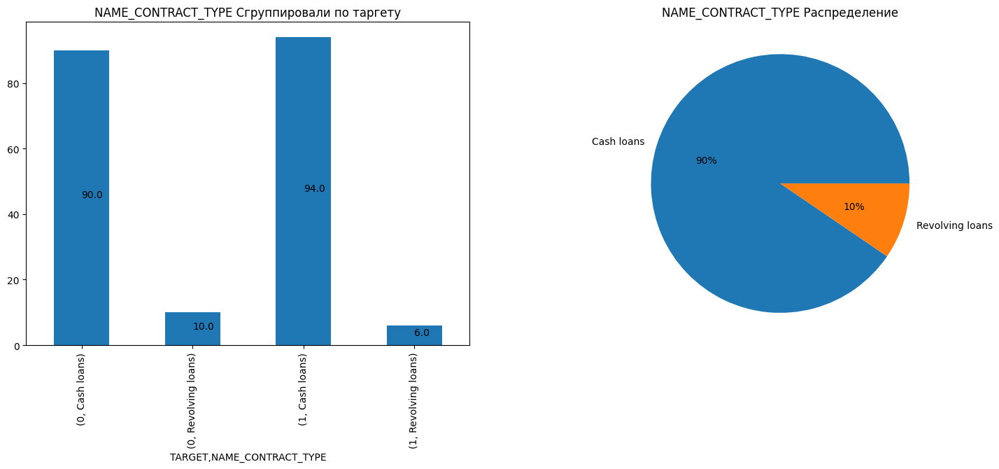

TARGET  NAME_CONTRACT_TYPE
0       Cash loans            90.0
        Revolving loans       10.0
1       Cash loans            94.0
        Revolving loans        6.0
Name: NAME_CONTRACT_TYPE, dtype: float64



Колонка CODE_GENDER


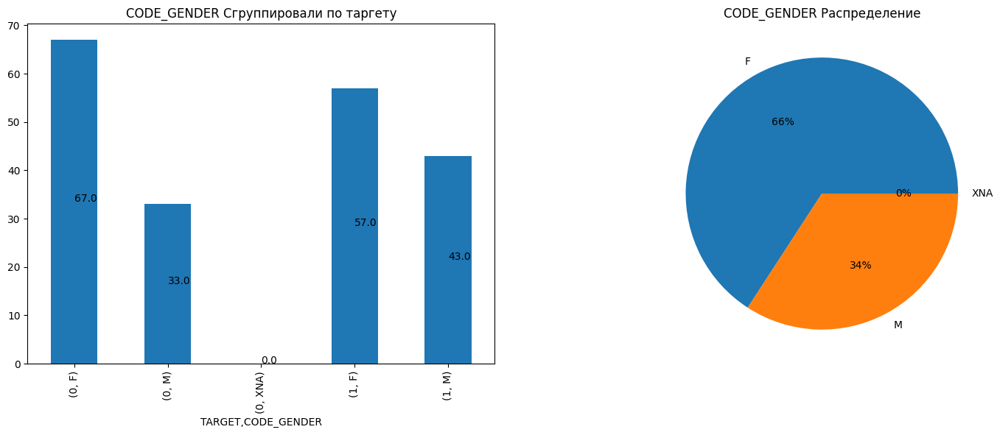

TARGET  CODE_GENDER
0       F              67.0
        M              33.0
        XNA             0.0
1       F              57.0
        M              43.0
Name: CODE_GENDER, dtype: float64



Колонка FLAG_OWN_CAR


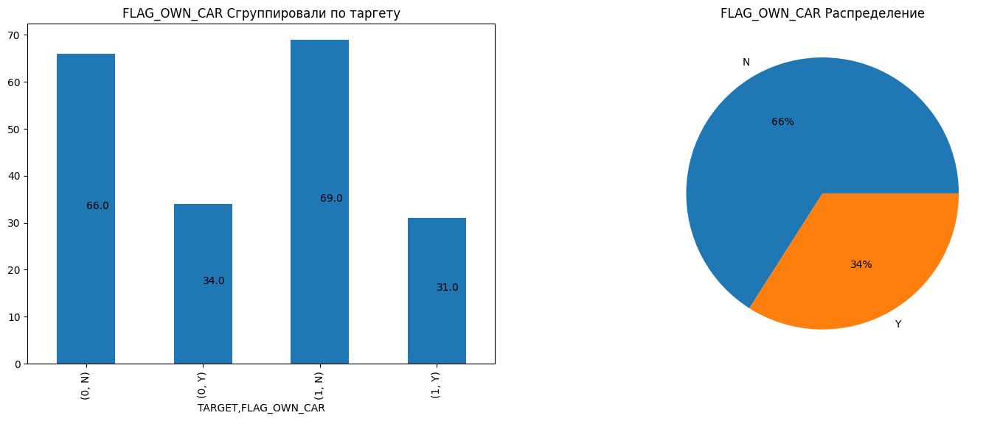

TARGET  FLAG_OWN_CAR
0       N               66.0
        Y               34.0
1       N               69.0
        Y               31.0
Name: FLAG_OWN_CAR, dtype: float64



Колонка FLAG_OWN_REALTY


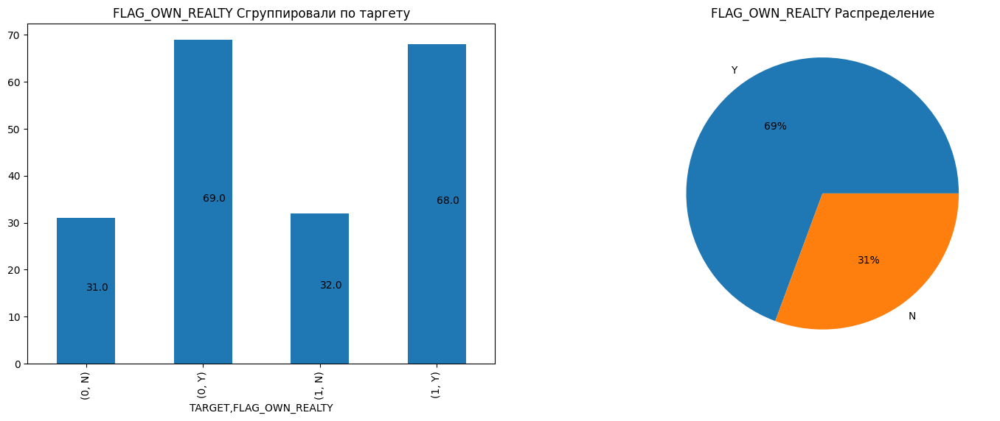

TARGET  FLAG_OWN_REALTY
0       N                  31.0
        Y                  69.0
1       N                  32.0
        Y                  68.0
Name: FLAG_OWN_REALTY, dtype: float64



Колонка NAME_TYPE_SUITE


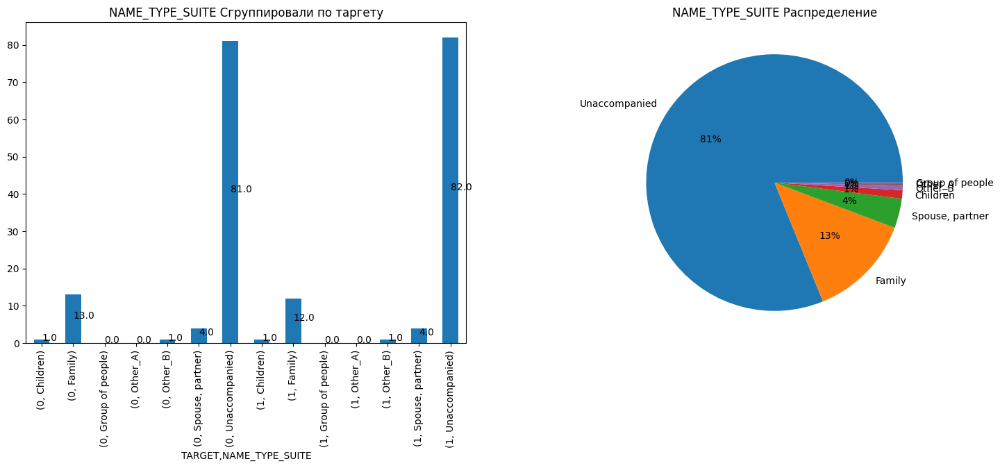

TARGET  NAME_TYPE_SUITE
0       Children            1.0
        Family             13.0
        Group of people     0.0
        Other_A             0.0
        Other_B             1.0
        Spouse, partner     4.0
        Unaccompanied      81.0
1       Children            1.0
        Family             12.0
        Group of people     0.0
        Other_A             0.0
        Other_B             1.0
        Spouse, partner     4.0
        Unaccompanied      82.0
Name: NAME_TYPE_SUITE, dtype: float64



Колонка NAME_INCOME_TYPE


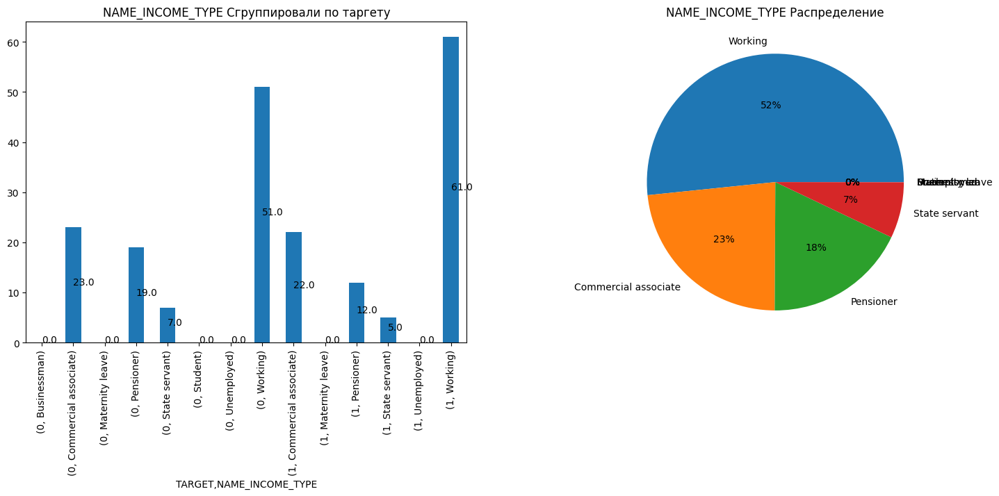

TARGET  NAME_INCOME_TYPE    
0       Businessman              0.0
        Commercial associate    23.0
        Maternity leave          0.0
        Pensioner               19.0
        State servant            7.0
        Student                  0.0
        Unemployed               0.0
        Working                 51.0
1       Commercial associate    22.0
        Maternity leave          0.0
        Pensioner               12.0
        State servant            5.0
        Unemployed               0.0
        Working                 61.0
Name: NAME_INCOME_TYPE, dtype: float64



Колонка NAME_EDUCATION_TYPE


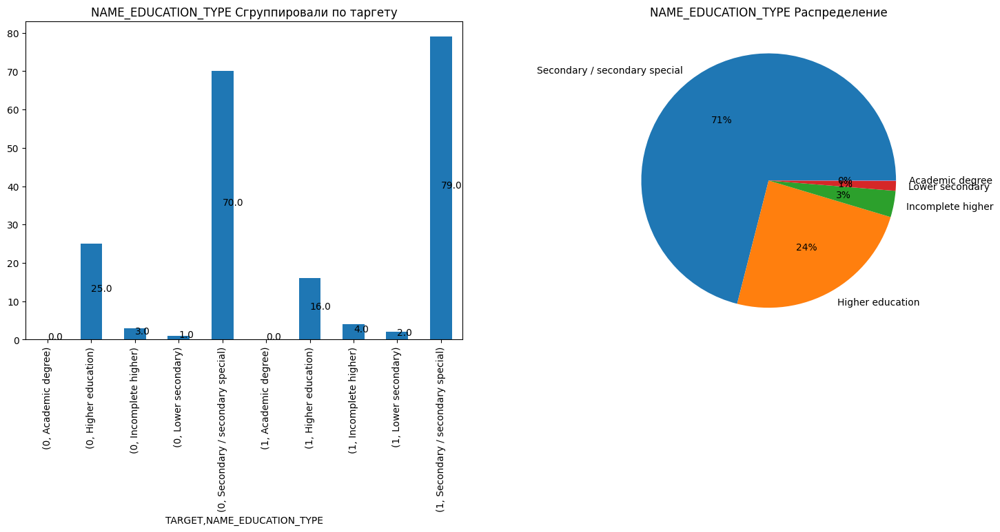

TARGET  NAME_EDUCATION_TYPE          
0       Academic degree                   0.0
        Higher education                 25.0
        Incomplete higher                 3.0
        Lower secondary                   1.0
        Secondary / secondary special    70.0
1       Academic degree                   0.0
        Higher education                 16.0
        Incomplete higher                 4.0
        Lower secondary                   2.0
        Secondary / secondary special    79.0
Name: NAME_EDUCATION_TYPE, dtype: float64



Колонка NAME_FAMILY_STATUS


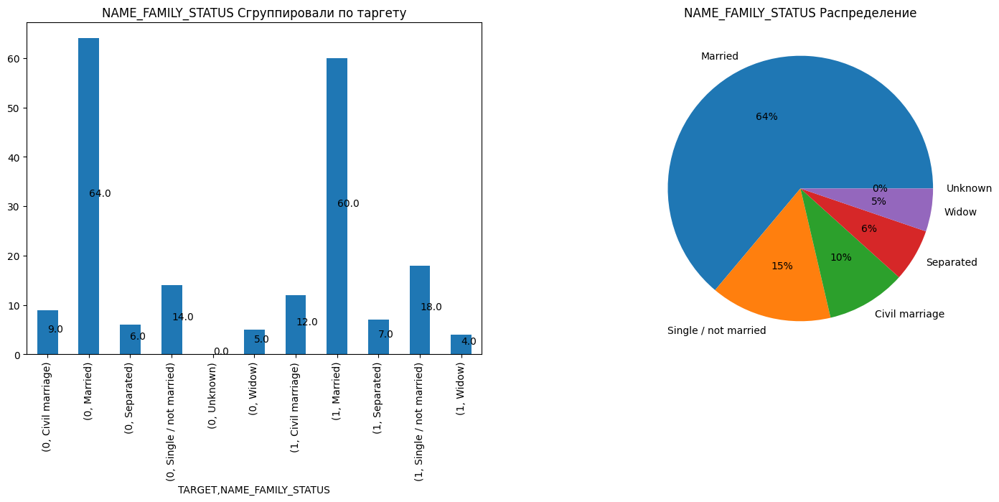

TARGET  NAME_FAMILY_STATUS  
0       Civil marriage           9.0
        Married                 64.0
        Separated                6.0
        Single / not married    14.0
        Unknown                  0.0
        Widow                    5.0
1       Civil marriage          12.0
        Married                 60.0
        Separated                7.0
        Single / not married    18.0
        Widow                    4.0
Name: NAME_FAMILY_STATUS, dtype: float64



Колонка NAME_HOUSING_TYPE


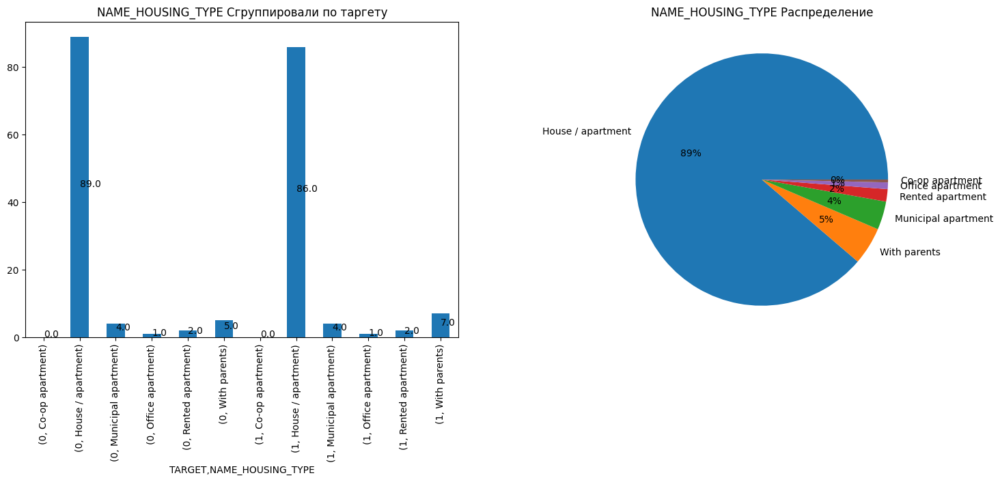

TARGET  NAME_HOUSING_TYPE  
0       Co-op apartment         0.0
        House / apartment      89.0
        Municipal apartment     4.0
        Office apartment        1.0
        Rented apartment        2.0
        With parents            5.0
1       Co-op apartment         0.0
        House / apartment      86.0
        Municipal apartment     4.0
        Office apartment        1.0
        Rented apartment        2.0
        With parents            7.0
Name: NAME_HOUSING_TYPE, dtype: float64



Колонка OCCUPATION_TYPE


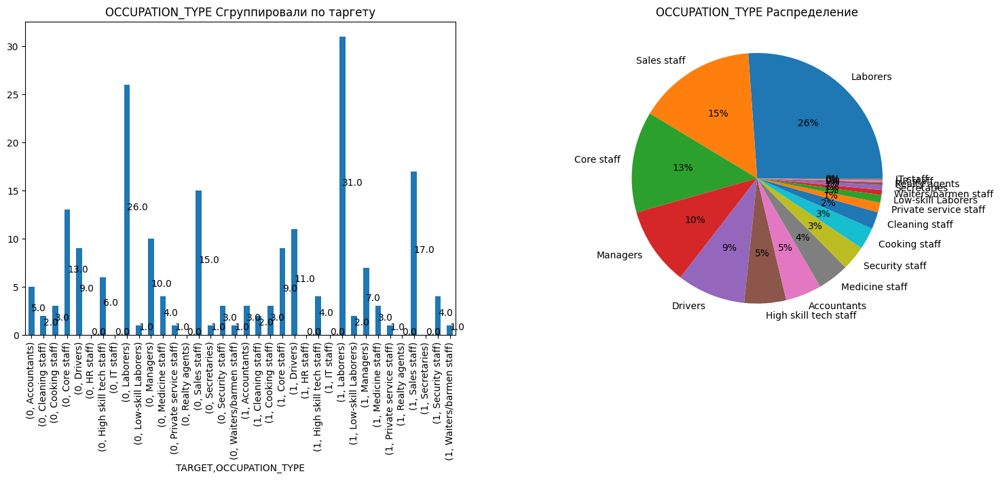

TARGET  OCCUPATION_TYPE      
0       Accountants               5.0
        Cleaning staff            2.0
        Cooking staff             3.0
        Core staff               13.0
        Drivers                   9.0
        HR staff                  0.0
        High skill tech staff     6.0
        IT staff                  0.0
        Laborers                 26.0
        Low-skill Laborers        1.0
        Managers                 10.0
        Medicine staff            4.0
        Private service staff     1.0
        Realty agents             0.0
        Sales staff              15.0
        Secretaries               1.0
        Security staff            3.0
        Waiters/barmen staff      1.0
1       Accountants               3.0
        Cleaning staff            2.0
        Cooking staff             3.0
        Core staff                9.0
        Drivers                  11.0
        HR staff                  0.0
        High skill tech staff     4.0
        IT staff    

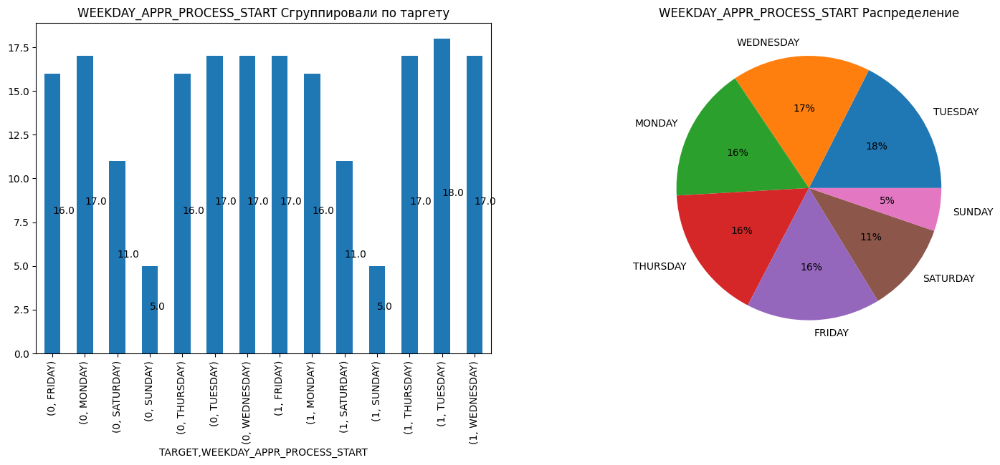

TARGET  WEEKDAY_APPR_PROCESS_START
0       FRIDAY                        16.0
        MONDAY                        17.0
        SATURDAY                      11.0
        SUNDAY                         5.0
        THURSDAY                      16.0
        TUESDAY                       17.0
        WEDNESDAY                     17.0
1       FRIDAY                        17.0
        MONDAY                        16.0
        SATURDAY                      11.0
        SUNDAY                         5.0
        THURSDAY                      17.0
        TUESDAY                       18.0
        WEDNESDAY                     17.0
Name: WEEKDAY_APPR_PROCESS_START, dtype: float64



Колонка ORGANIZATION_TYPE


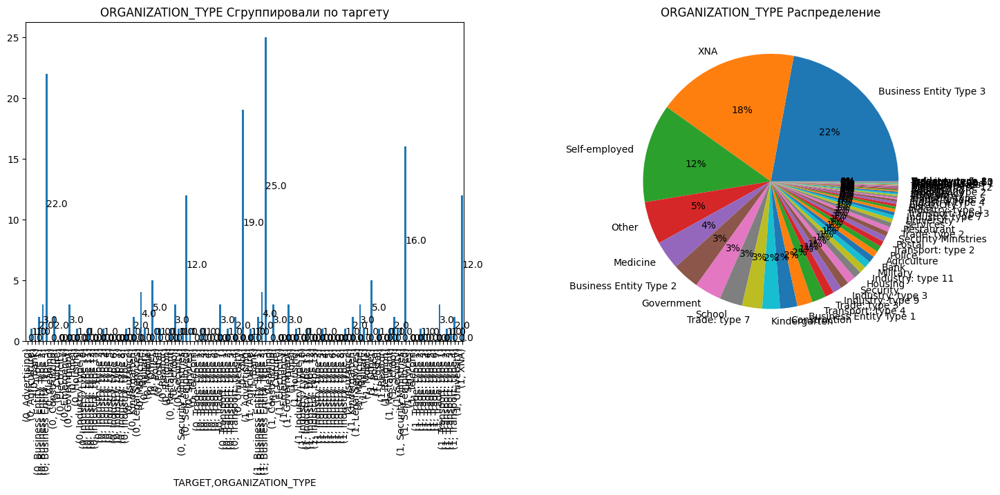

TARGET  ORGANIZATION_TYPE     
0       Advertising                0.0
        Agriculture                1.0
        Bank                       1.0
        Business Entity Type 1     2.0
        Business Entity Type 2     3.0
                                  ... 
1       Transport: type 2          1.0
        Transport: type 3          1.0
        Transport: type 4          2.0
        University                 0.0
        XNA                       12.0
Name: ORGANIZATION_TYPE, Length: 116, dtype: float64



Колонка FONDKAPREMONT_MODE


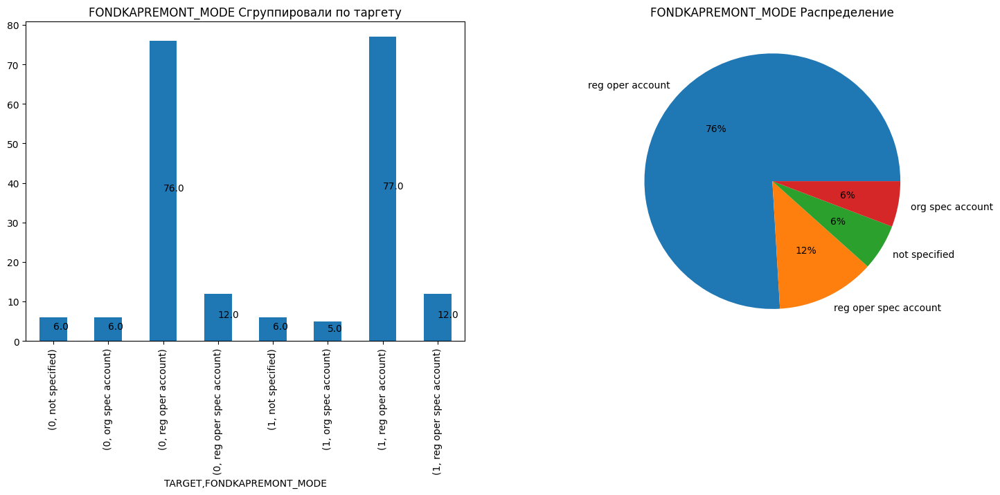

TARGET  FONDKAPREMONT_MODE   
0       not specified             6.0
        org spec account          6.0
        reg oper account         76.0
        reg oper spec account    12.0
1       not specified             6.0
        org spec account          5.0
        reg oper account         77.0
        reg oper spec account    12.0
Name: FONDKAPREMONT_MODE, dtype: float64



Колонка HOUSETYPE_MODE


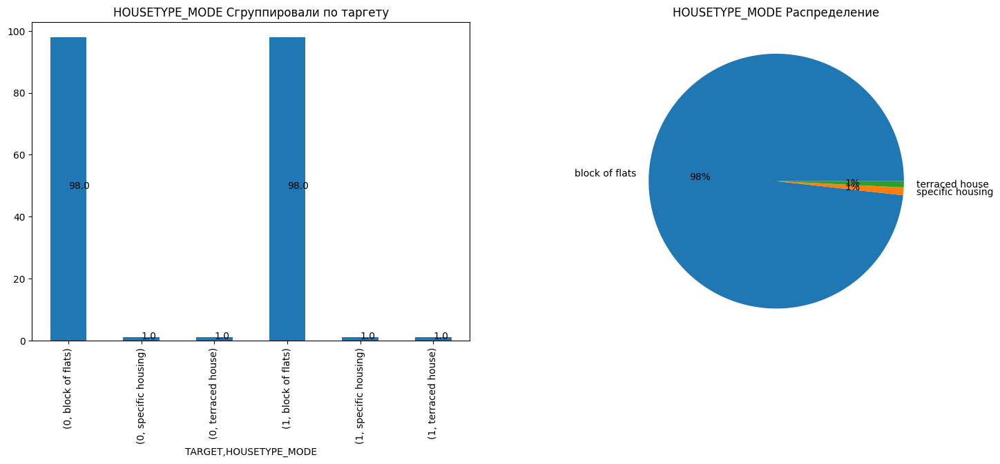

TARGET  HOUSETYPE_MODE  
0       block of flats      98.0
        specific housing     1.0
        terraced house       1.0
1       block of flats      98.0
        specific housing     1.0
        terraced house       1.0
Name: HOUSETYPE_MODE, dtype: float64



Колонка WALLSMATERIAL_MODE


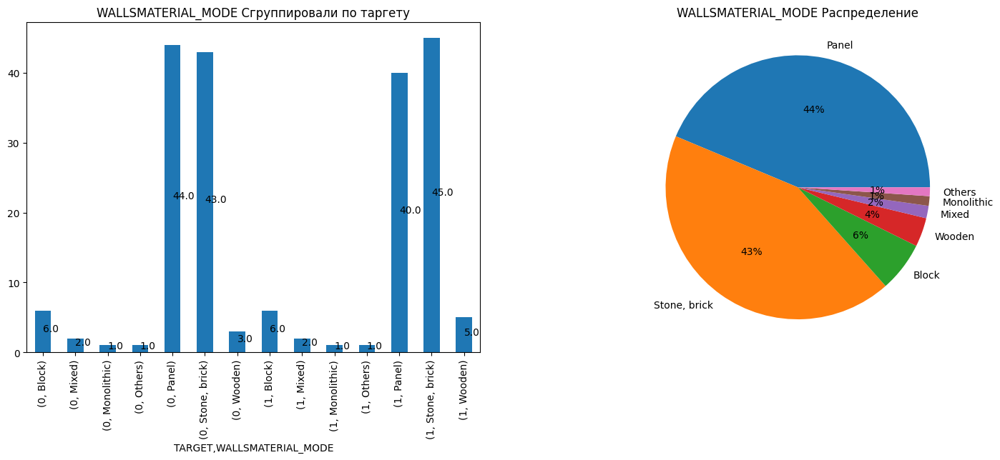

TARGET  WALLSMATERIAL_MODE
0       Block                  6.0
        Mixed                  2.0
        Monolithic             1.0
        Others                 1.0
        Panel                 44.0
        Stone, brick          43.0
        Wooden                 3.0
1       Block                  6.0
        Mixed                  2.0
        Monolithic             1.0
        Others                 1.0
        Panel                 40.0
        Stone, brick          45.0
        Wooden                 5.0
Name: WALLSMATERIAL_MODE, dtype: float64



Колонка EMERGENCYSTATE_MODE


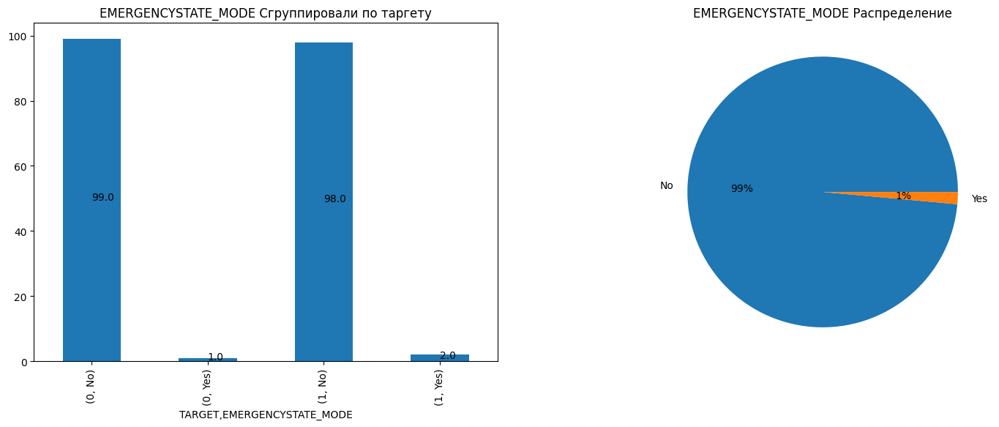

TARGET  EMERGENCYSTATE_MODE
0       No                     99.0
        Yes                     1.0
1       No                     98.0
        Yes                     2.0
Name: EMERGENCYSTATE_MODE, dtype: float64





In [ ]:
for feature in data_obj_cols:
    distributionGraphs(feature)

### Анализ числовых колонок
Заметим, что в числовых колонках есть 3 типа данных:
- Обычные числовые данные
- Признаки, содержащие FLAG
- Признаки, содержащие REGION или CITY

In [ ]:
data_numeric_cols = list(data_numeric_cols)
data_flag_cols = [val for val in data_numeric_cols if 'FLAG_' in val]
data_area_cols = [val for val in data_numeric_cols if ('REGION_' in val or 'CITY_' in val )]
data_days_cols = [val for val in data_numeric_cols if ('DAYS_' in val or 'HOUR_' in val )]
data_amt_cols = [val for val in data_numeric_cols if 'AMT_' in val]

for val in data_flag_cols:
    data_numeric_cols.remove(val)

for val in data_area_cols:
    data_numeric_cols.remove(val)

for val in data_days_cols:
    data_numeric_cols.remove(val)

for val in data_amt_cols:
    data_numeric_cols.remove(val)

In [ ]:
print('Numeric cols',len(data_numeric_cols))
print('Area cols',len(data_area_cols))
print('Flag cols',len(data_flag_cols))
print('Days cols',len(data_days_cols))
print('Amount cols',len(data_amt_cols))

Numeric cols 55
Area cols 9
Flag cols 26
Days cols 6
Amount cols 10


In [ ]:
data_numeric_cols.remove('TARGET')

Колонка SK_ID_CURR


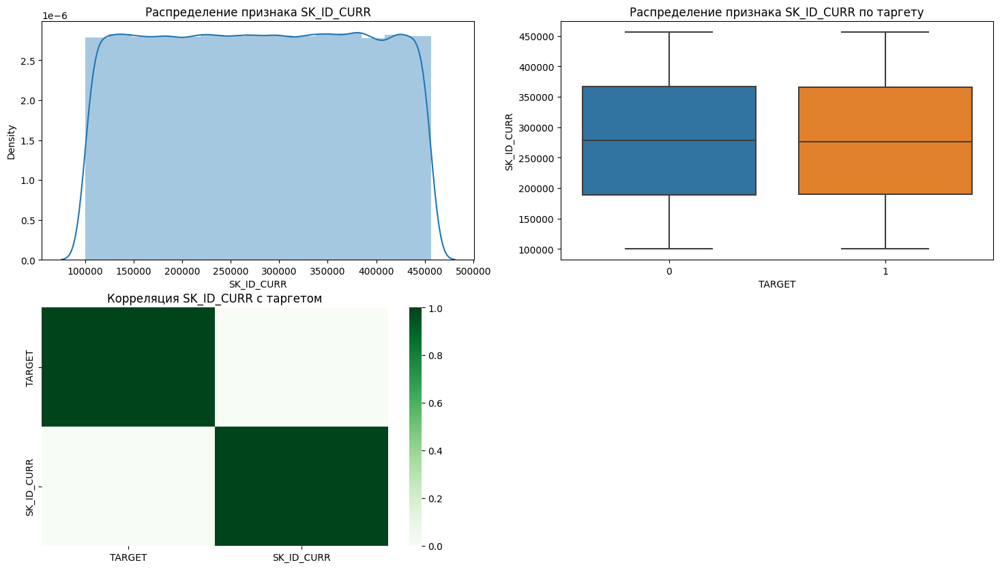

Колонка CNT_CHILDREN


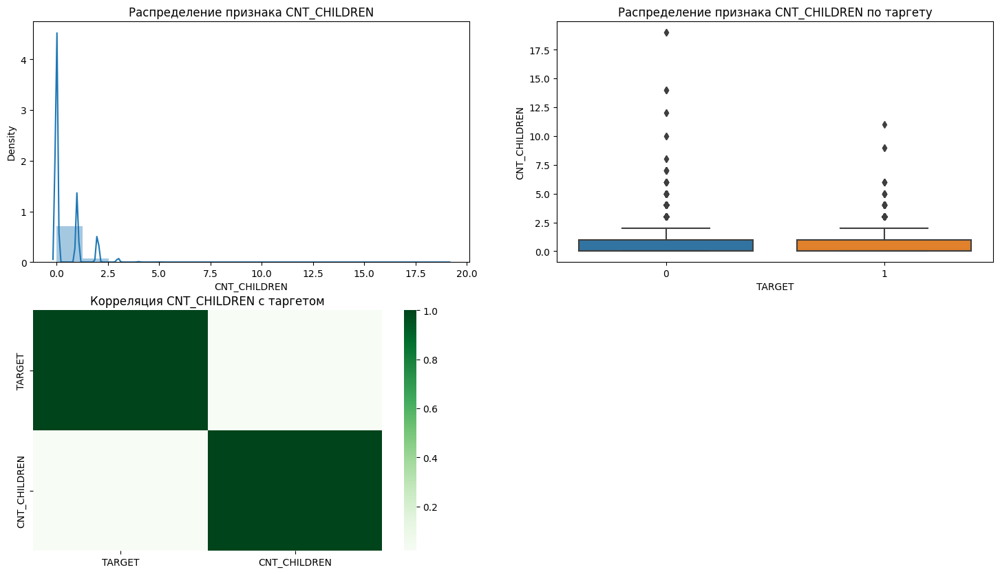

Колонка OWN_CAR_AGE


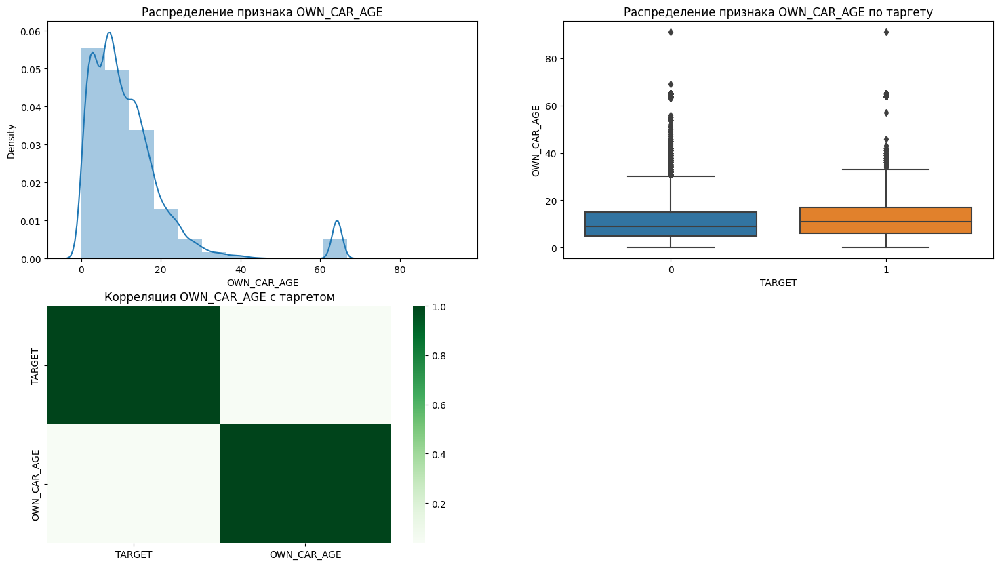

Колонка CNT_FAM_MEMBERS


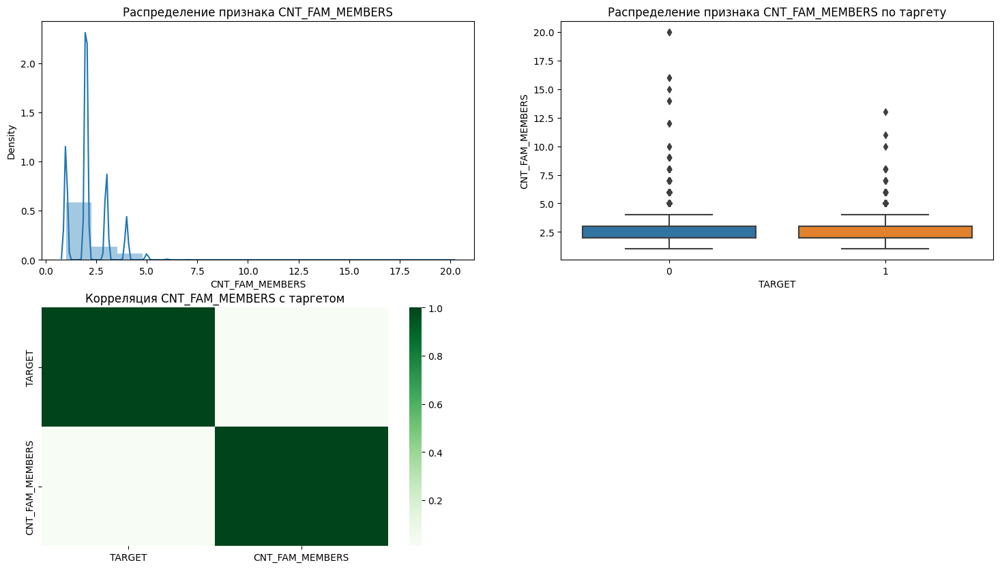

Колонка EXT_SOURCE_1


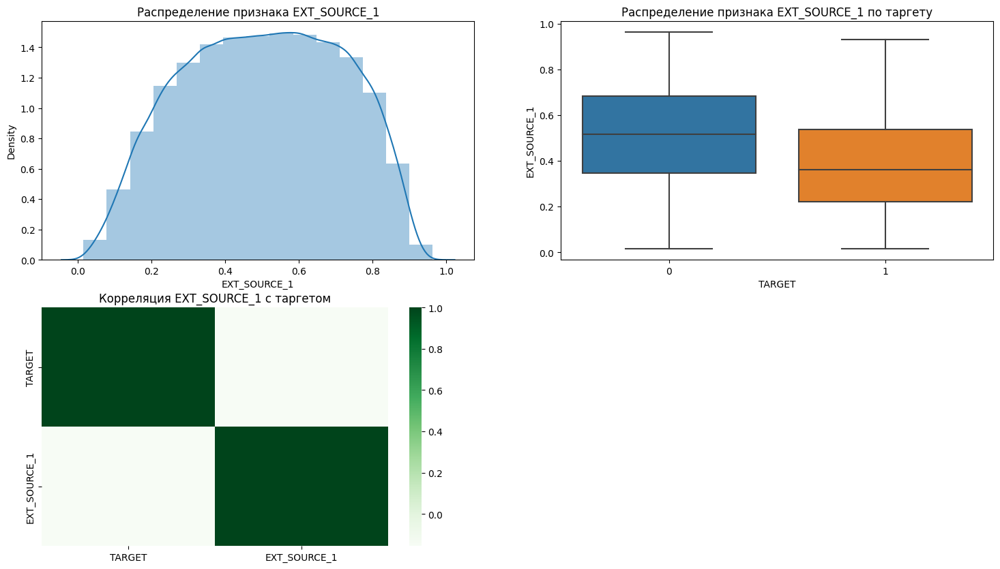

Колонка EXT_SOURCE_2


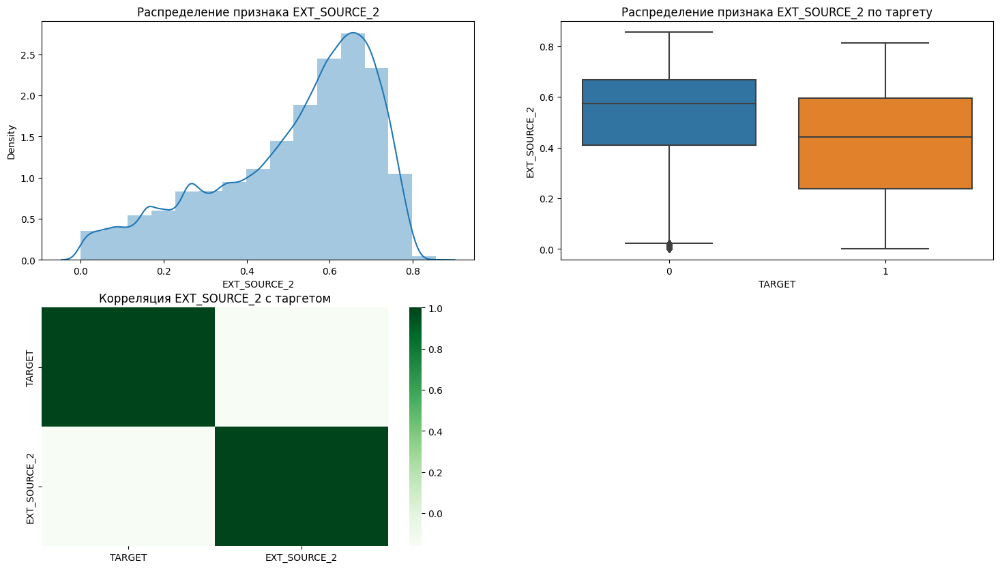

Колонка EXT_SOURCE_3


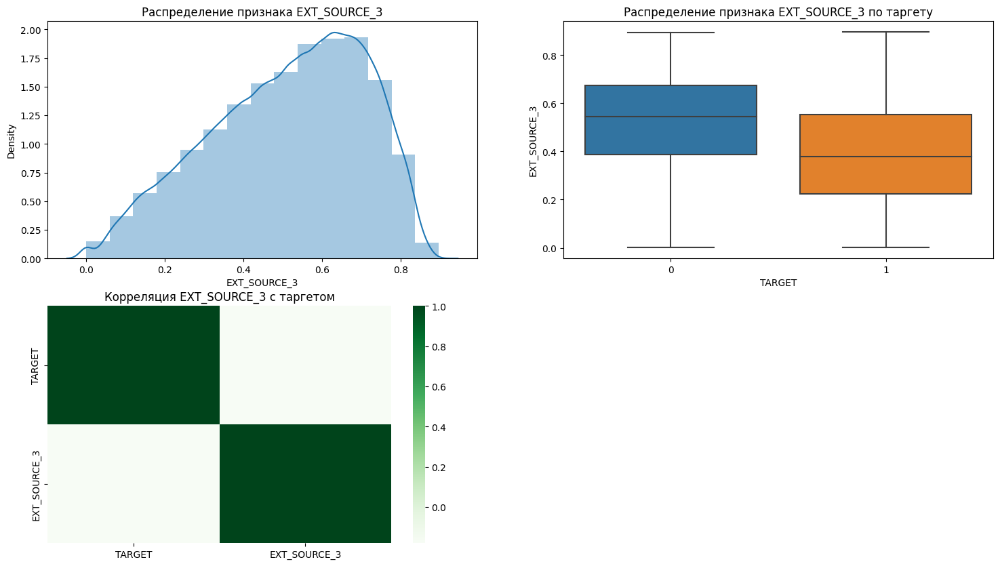

Колонка APARTMENTS_AVG


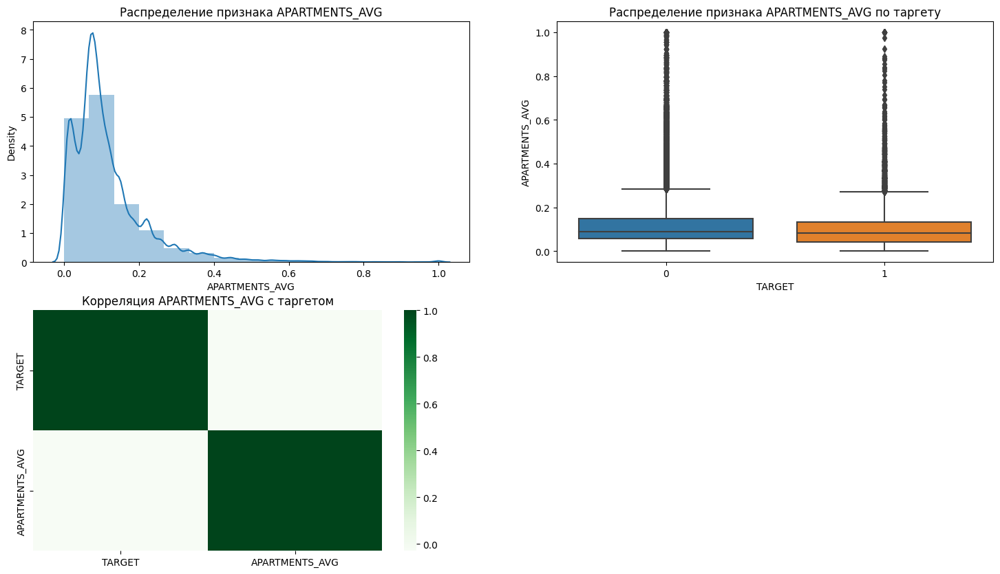

Колонка BASEMENTAREA_AVG


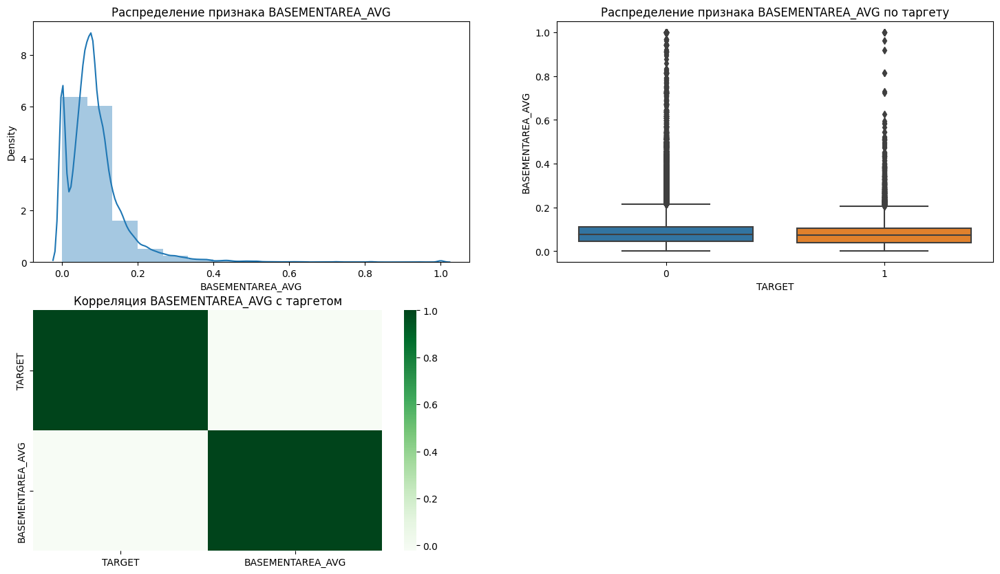

Колонка YEARS_BEGINEXPLUATATION_AVG


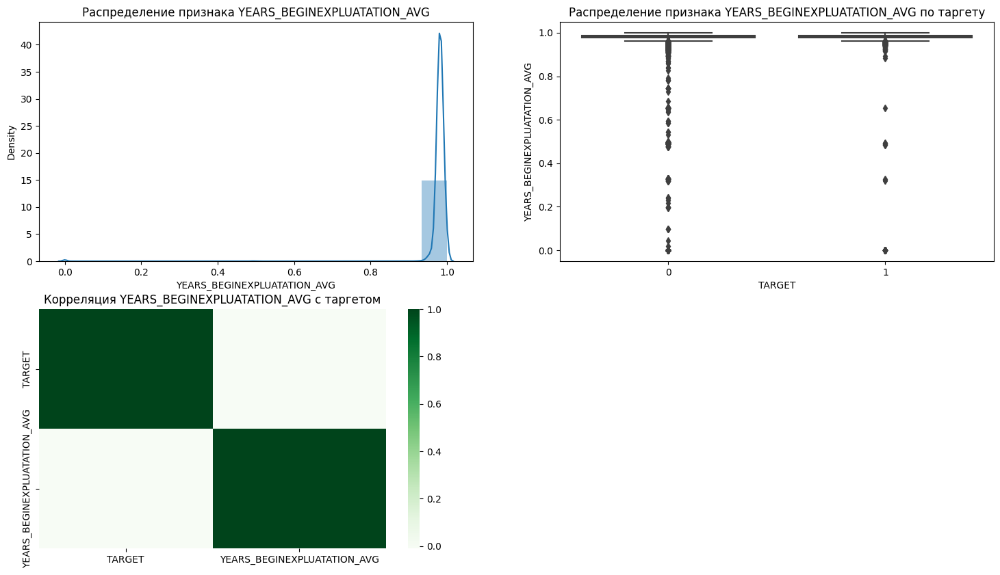

Колонка YEARS_BUILD_AVG


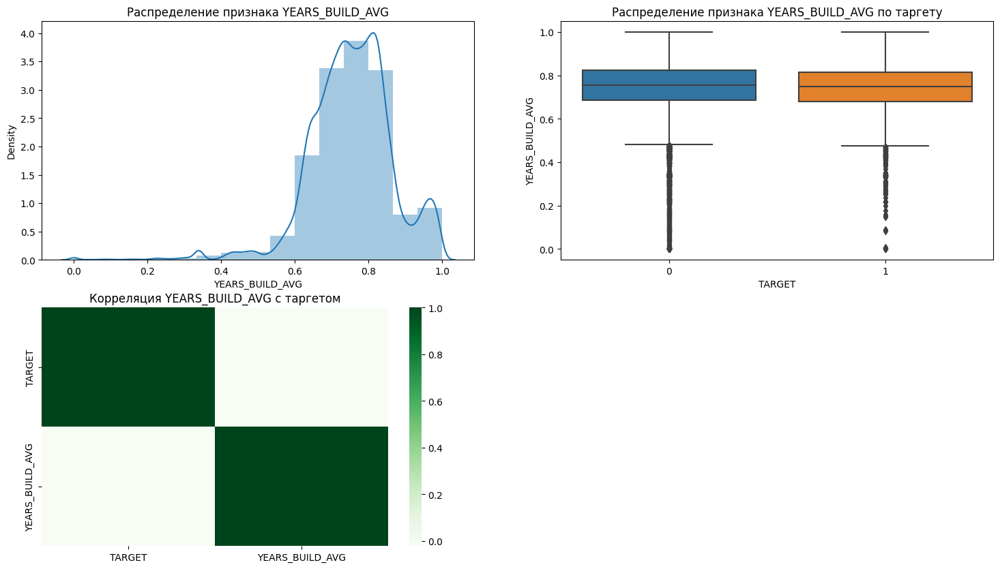

Колонка COMMONAREA_AVG


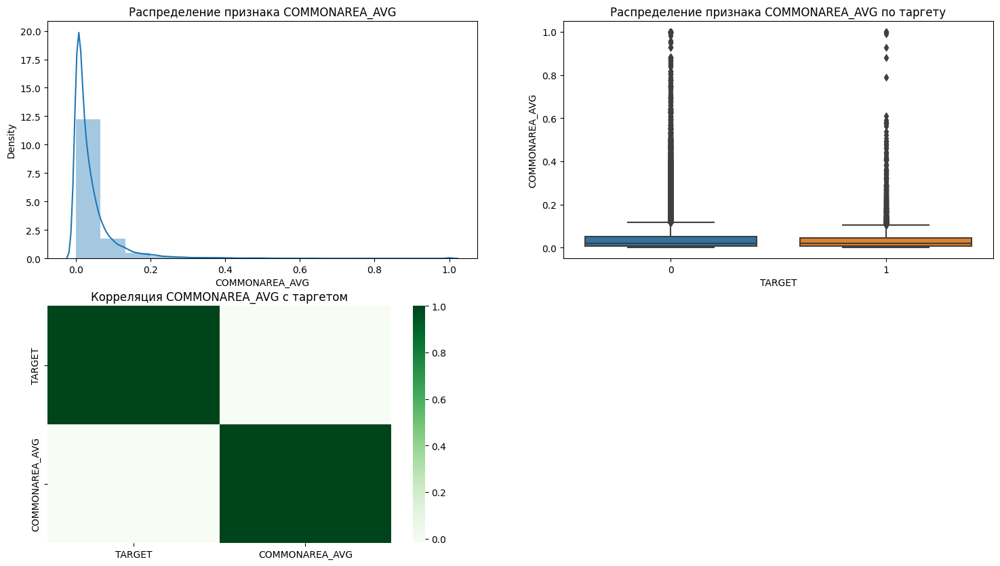

Колонка ELEVATORS_AVG


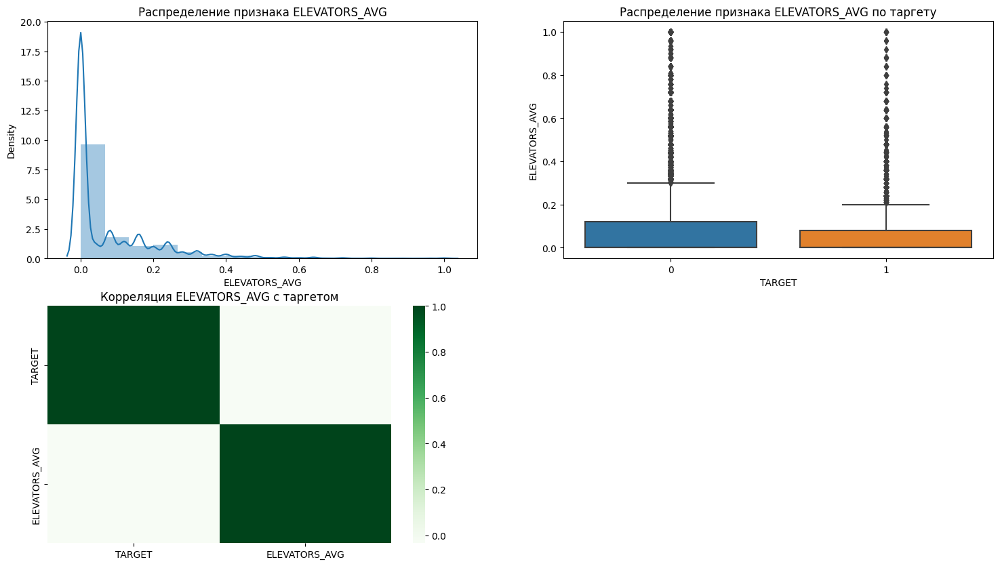

Колонка ENTRANCES_AVG


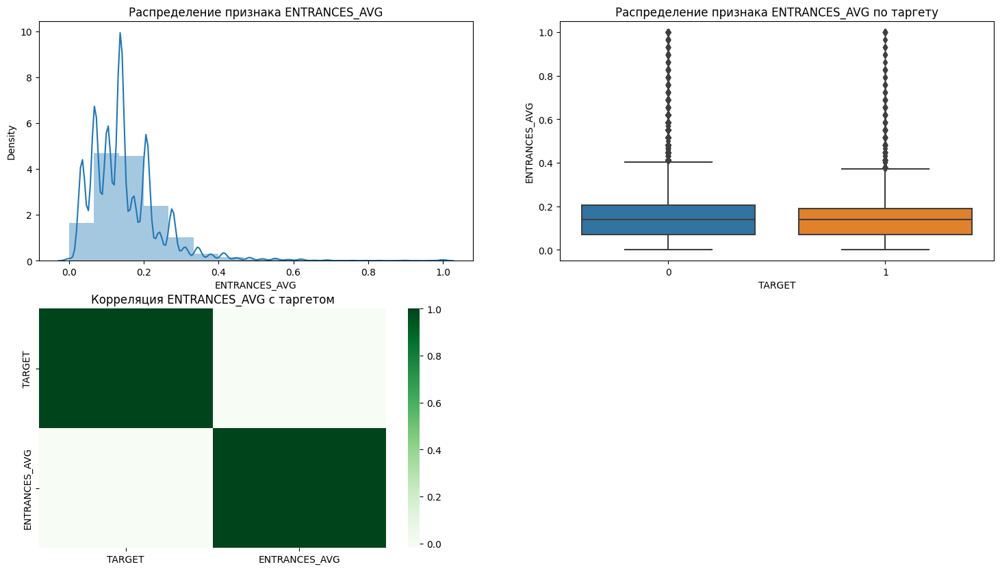

Колонка FLOORSMAX_AVG


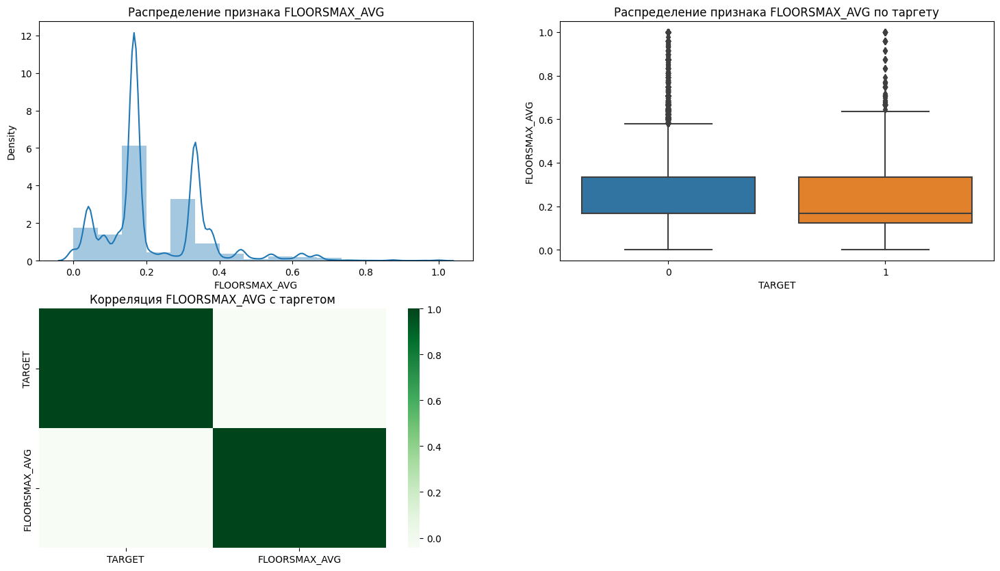

Колонка FLOORSMIN_AVG


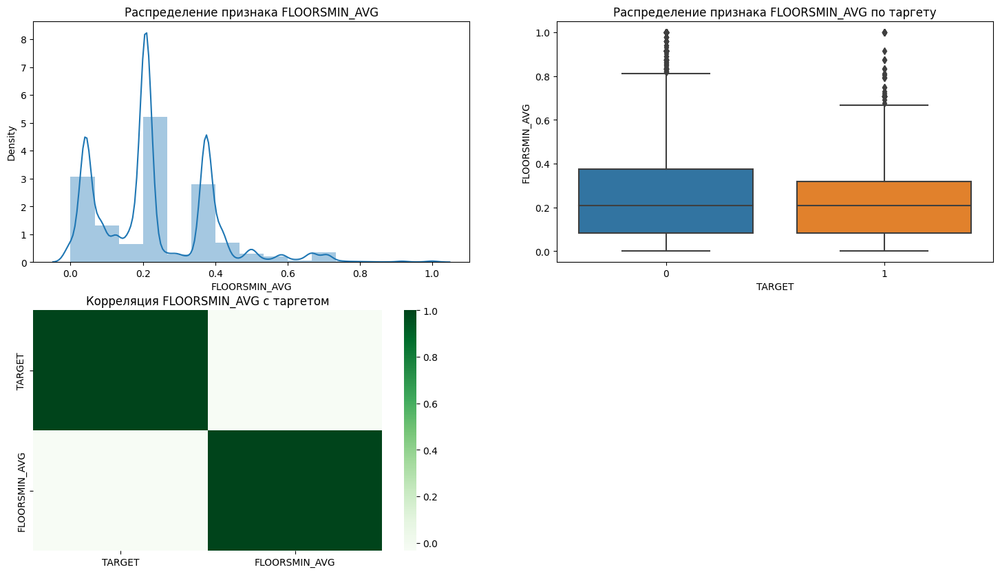

Колонка LANDAREA_AVG


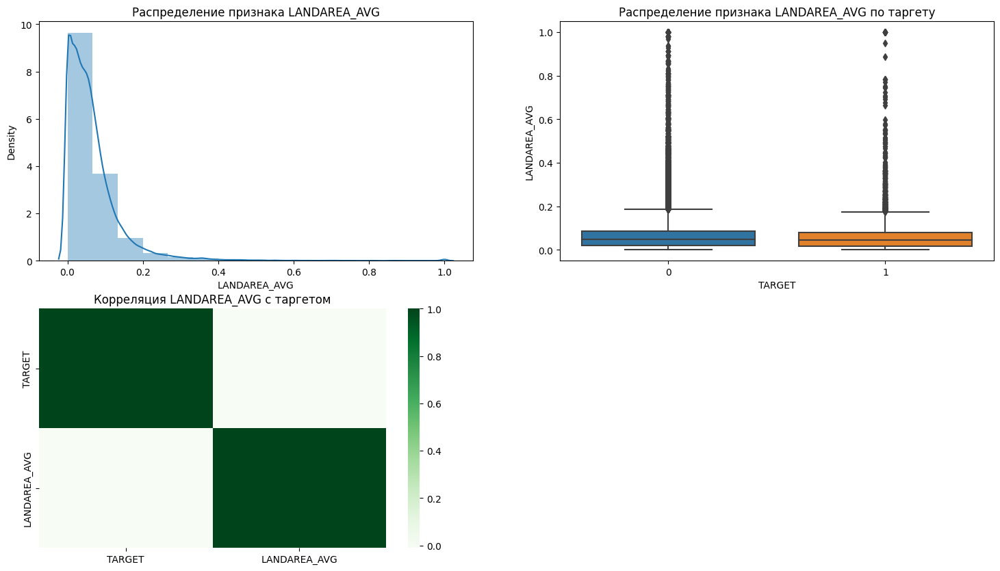

Колонка LIVINGAPARTMENTS_AVG


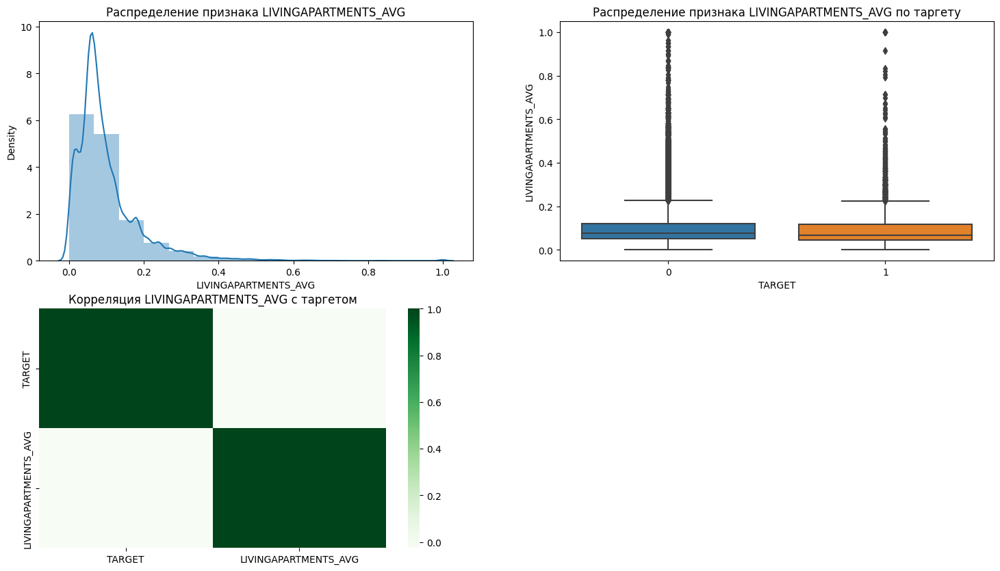

Колонка LIVINGAREA_AVG


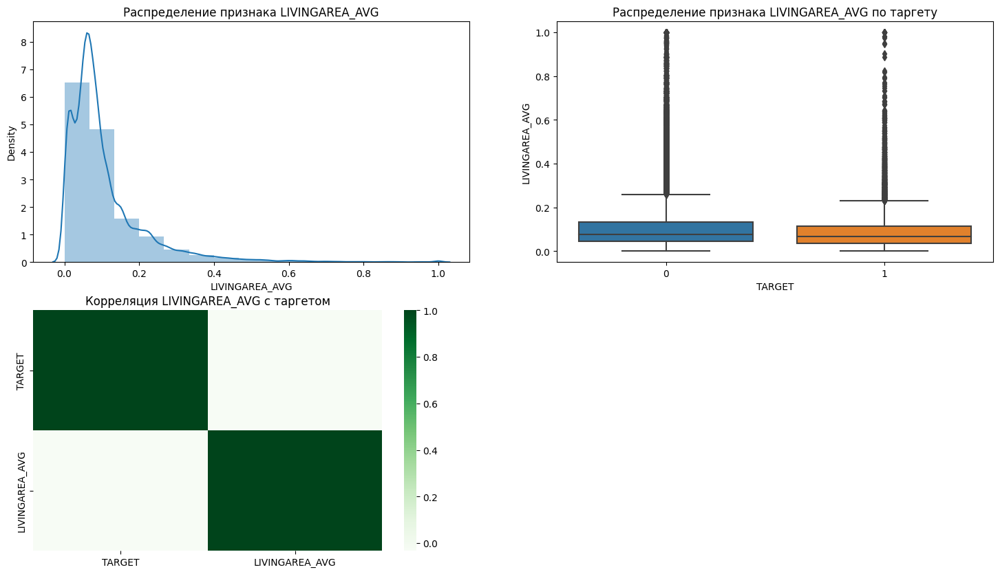

Колонка NONLIVINGAPARTMENTS_AVG


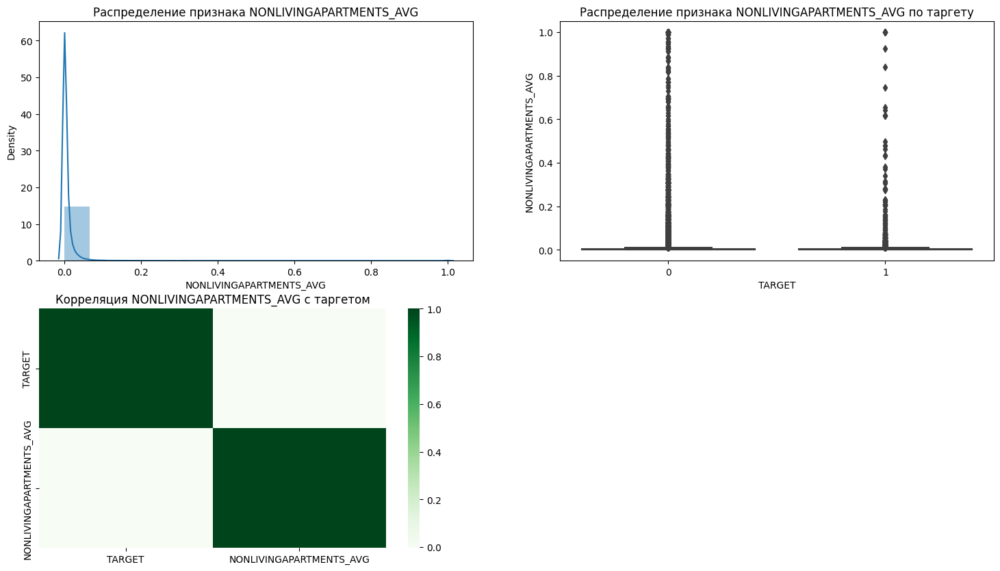

Колонка NONLIVINGAREA_AVG


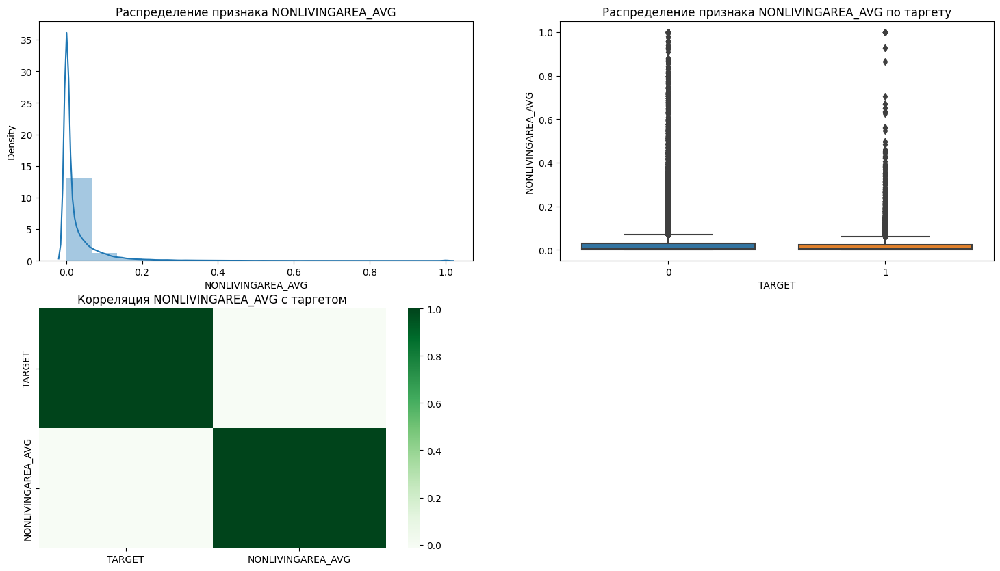

Колонка APARTMENTS_MODE


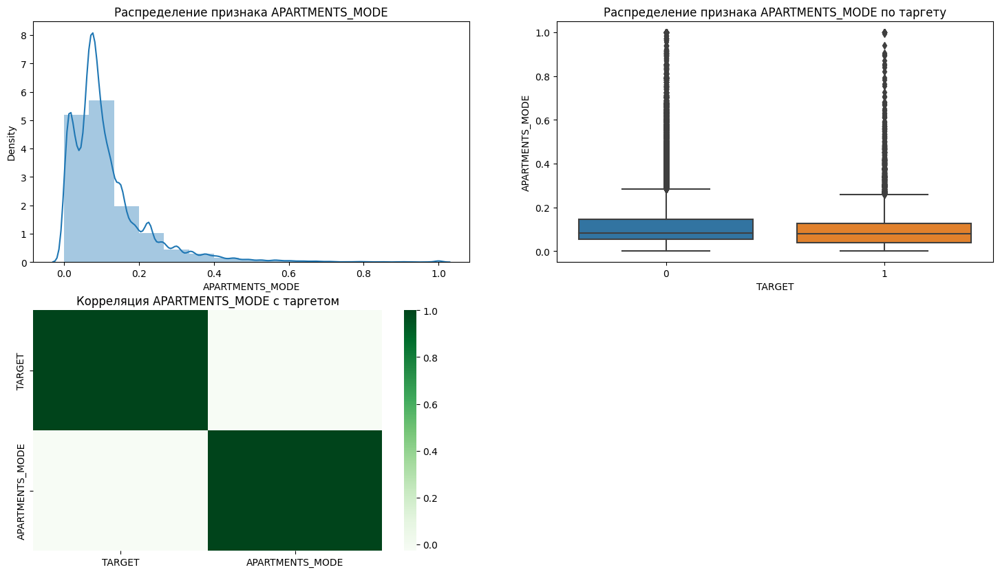

Колонка BASEMENTAREA_MODE


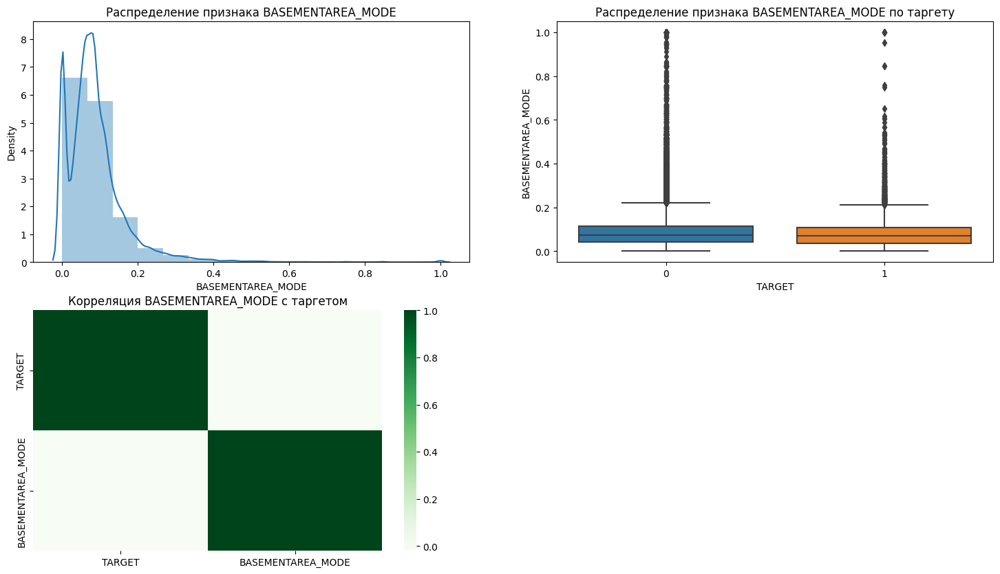

Колонка YEARS_BEGINEXPLUATATION_MODE


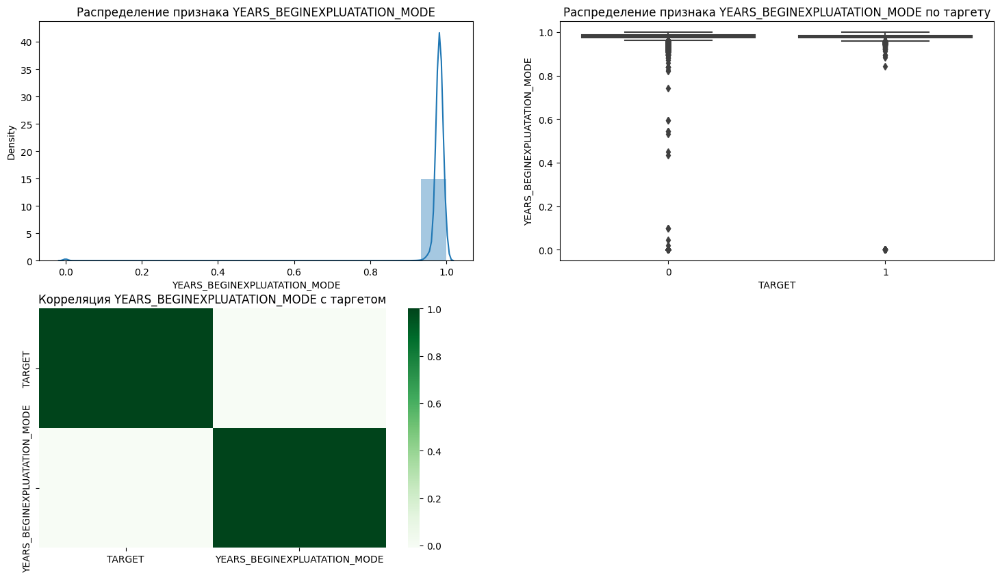

Колонка YEARS_BUILD_MODE


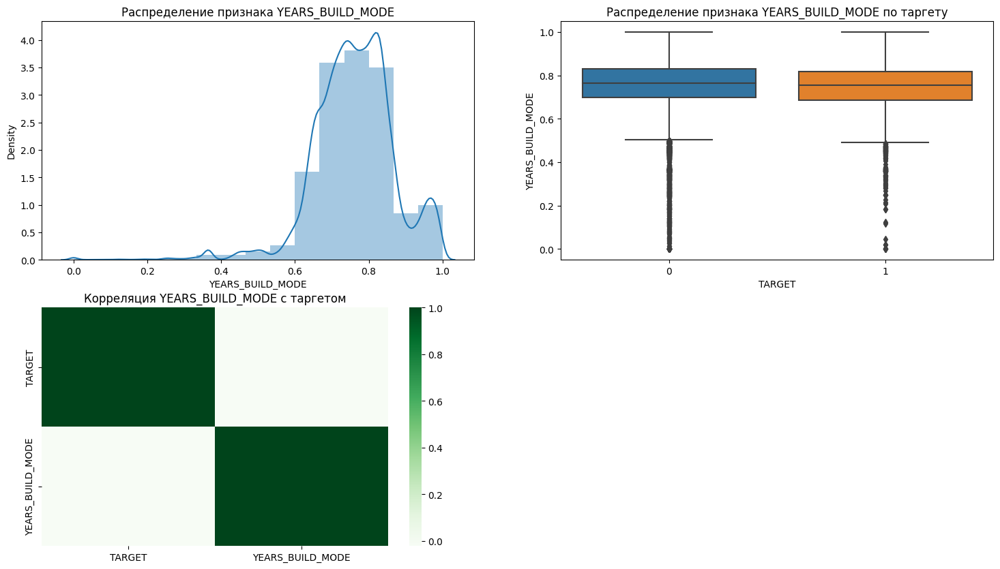

Колонка COMMONAREA_MODE


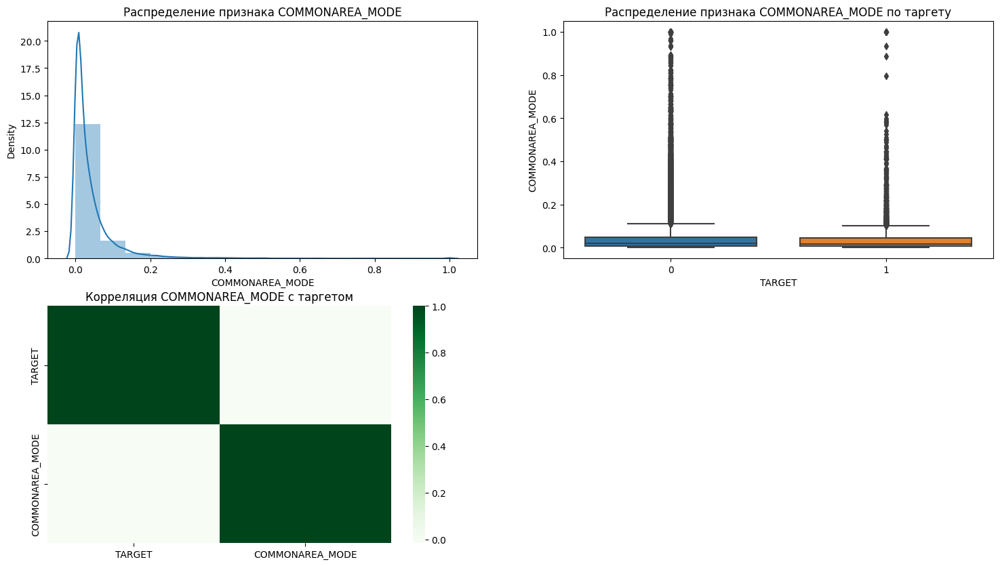

Колонка ELEVATORS_MODE


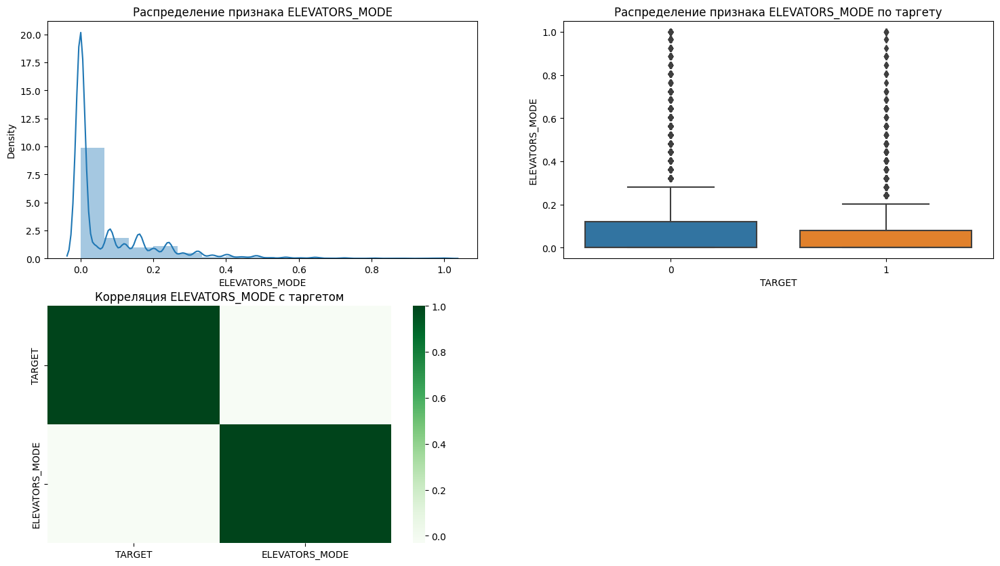

Колонка ENTRANCES_MODE


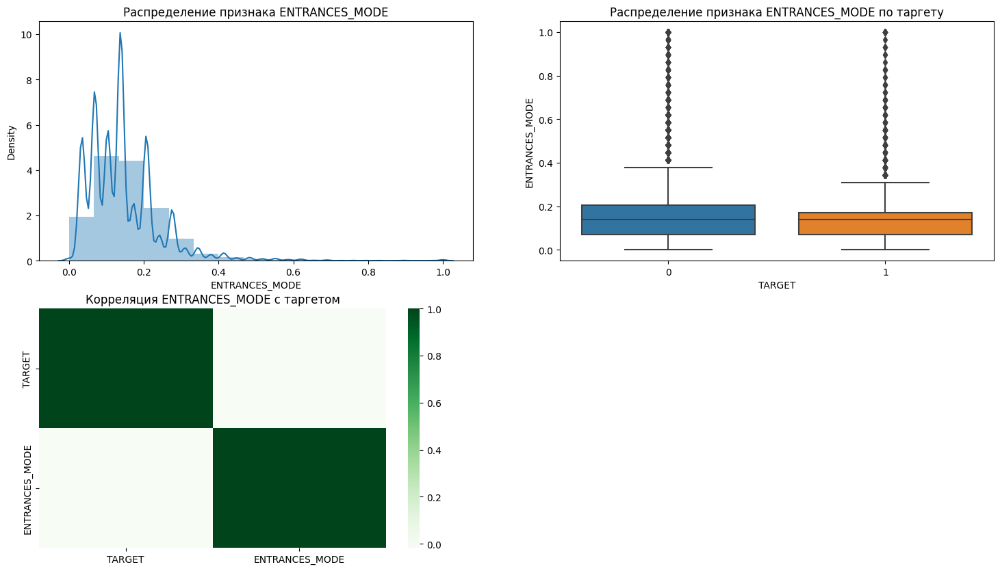

Колонка FLOORSMAX_MODE


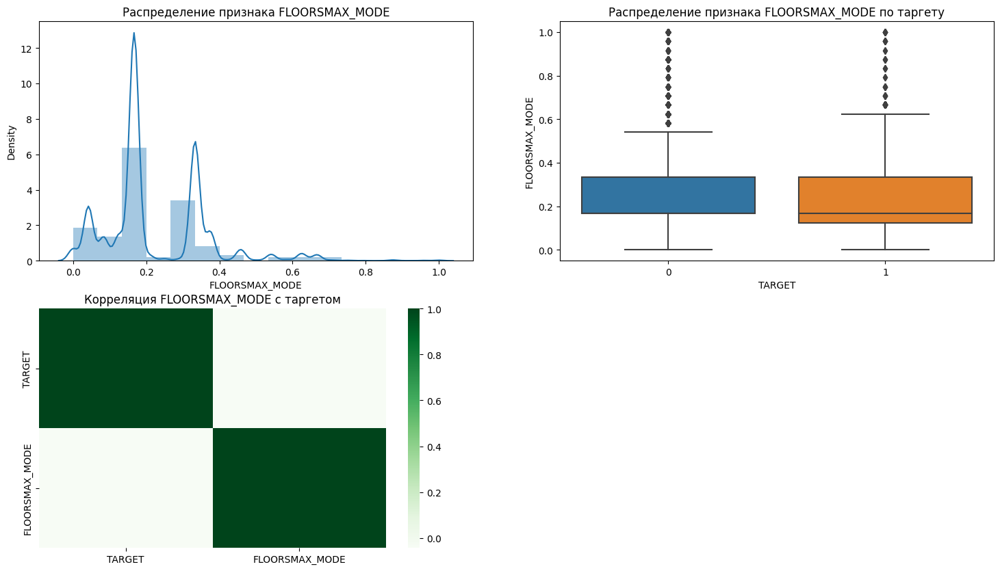

Колонка FLOORSMIN_MODE


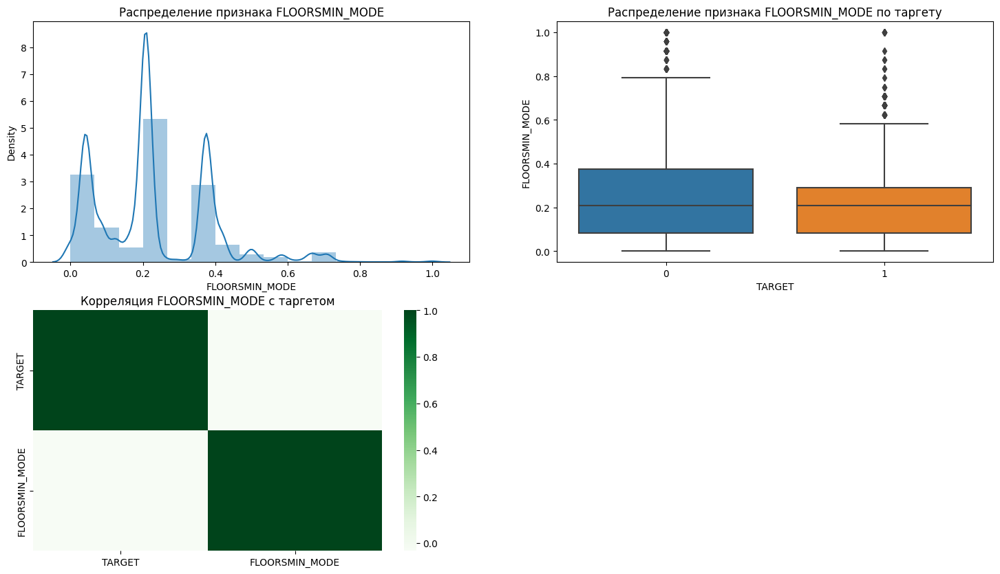

Колонка LANDAREA_MODE


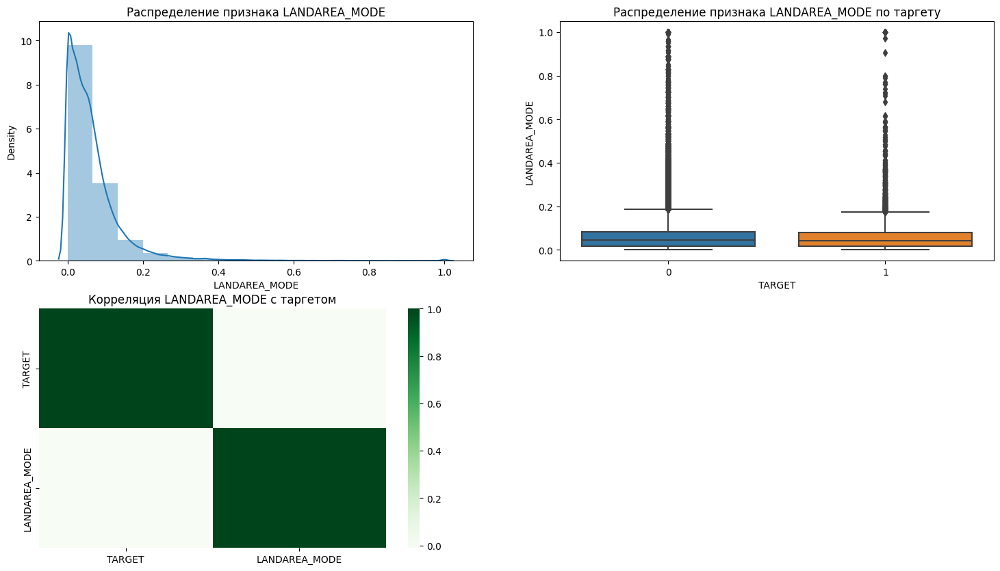

Колонка LIVINGAPARTMENTS_MODE


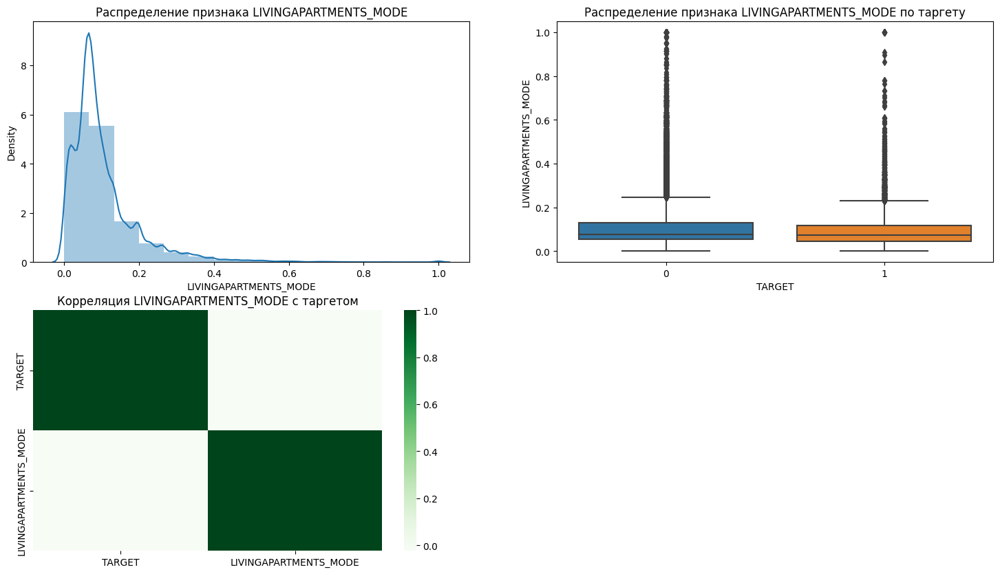

Колонка LIVINGAREA_MODE


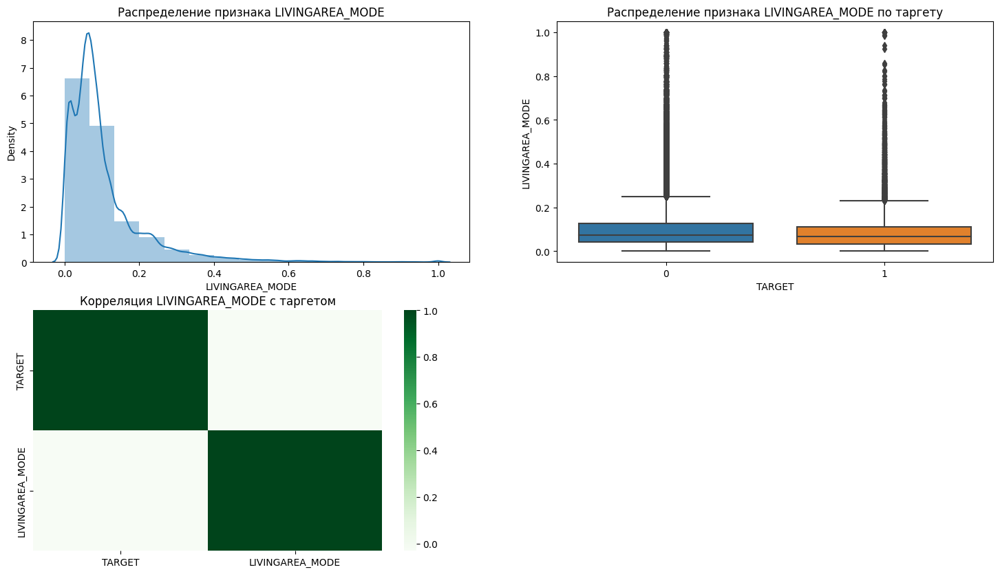

Колонка NONLIVINGAPARTMENTS_MODE


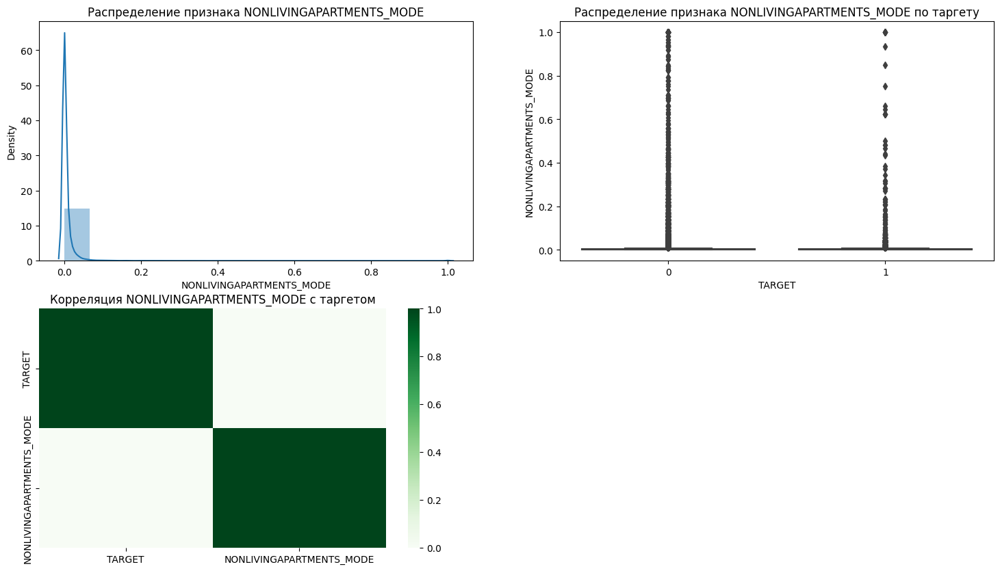

Колонка NONLIVINGAREA_MODE


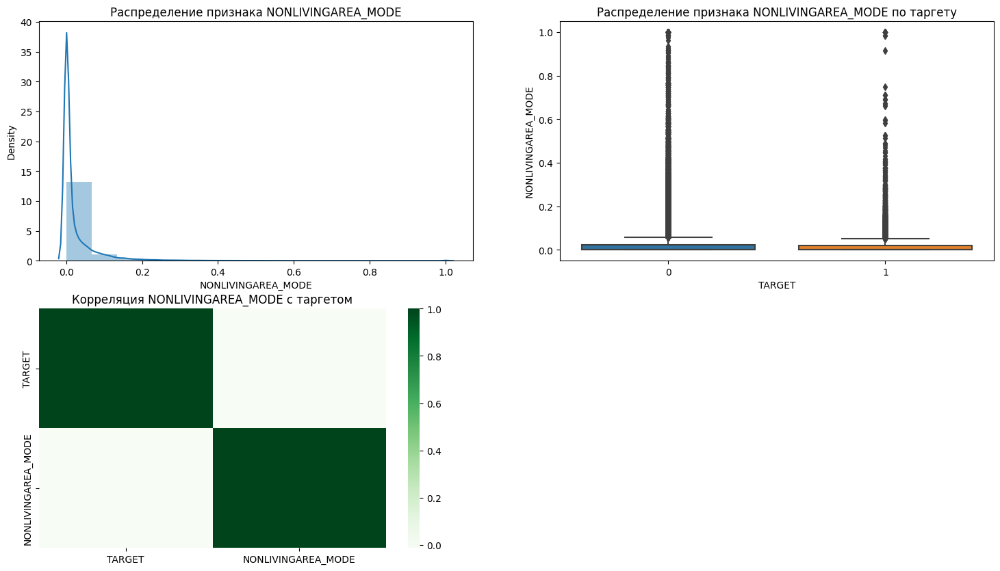

Колонка APARTMENTS_MEDI


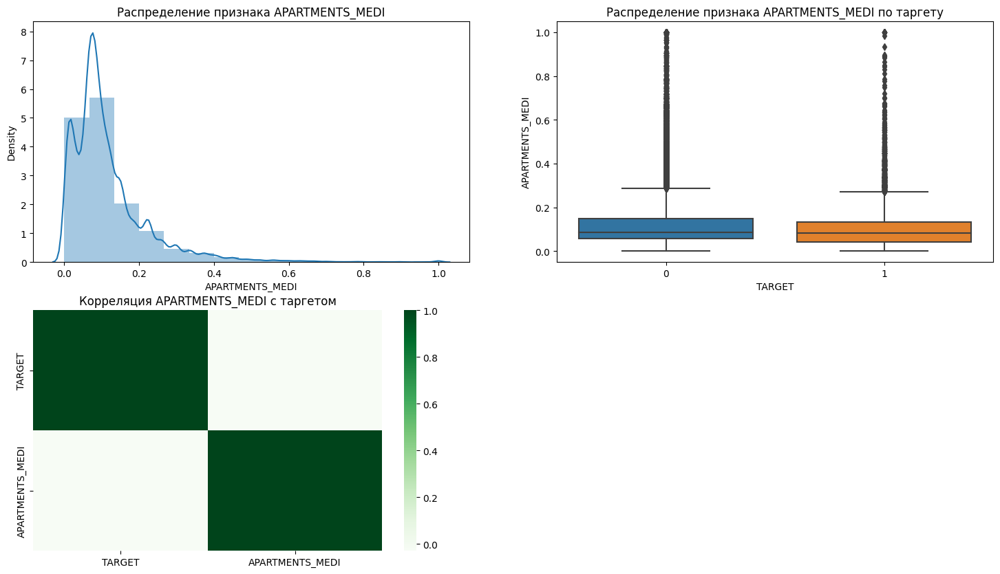

Колонка BASEMENTAREA_MEDI


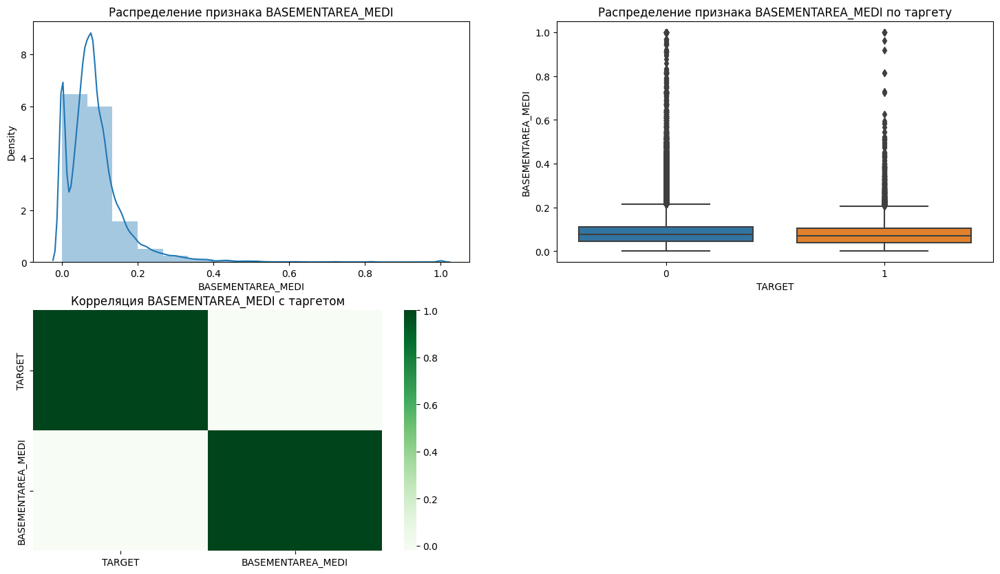

Колонка YEARS_BEGINEXPLUATATION_MEDI


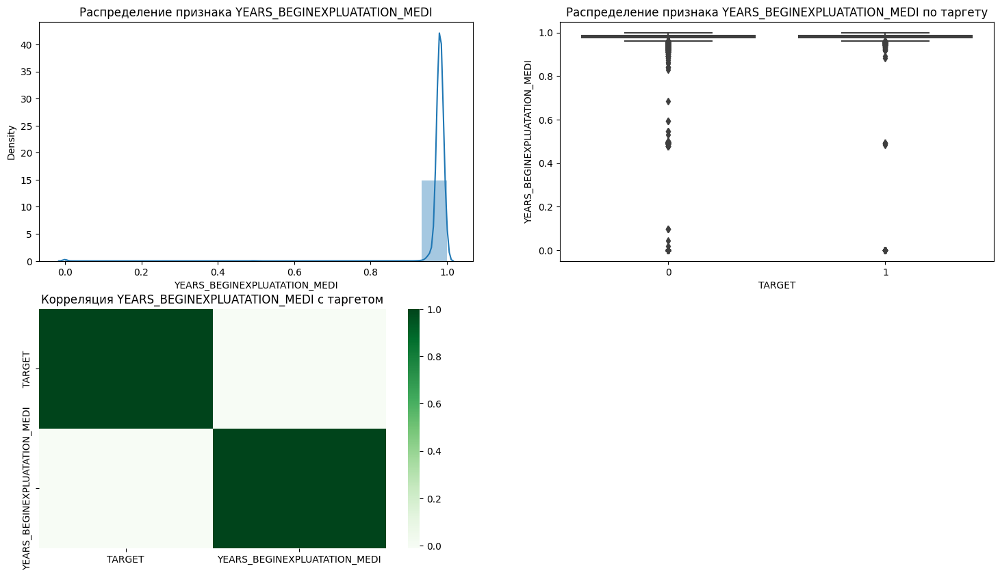

Колонка YEARS_BUILD_MEDI


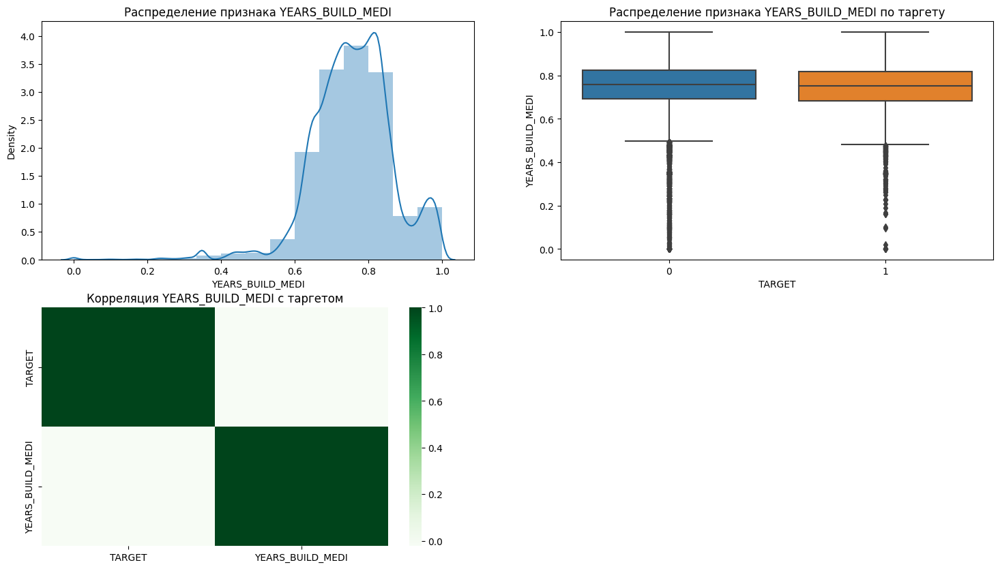

Колонка COMMONAREA_MEDI


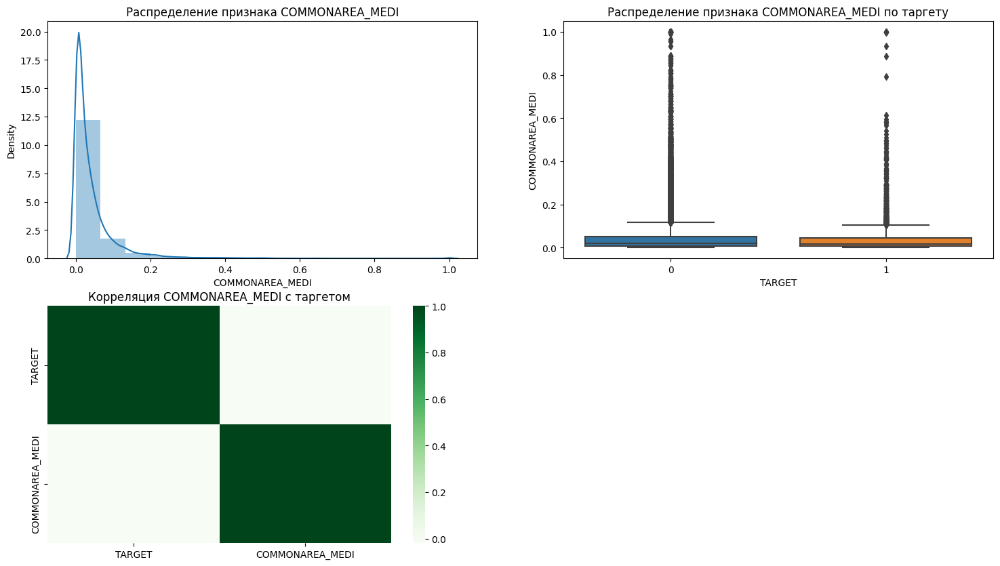

Колонка ELEVATORS_MEDI


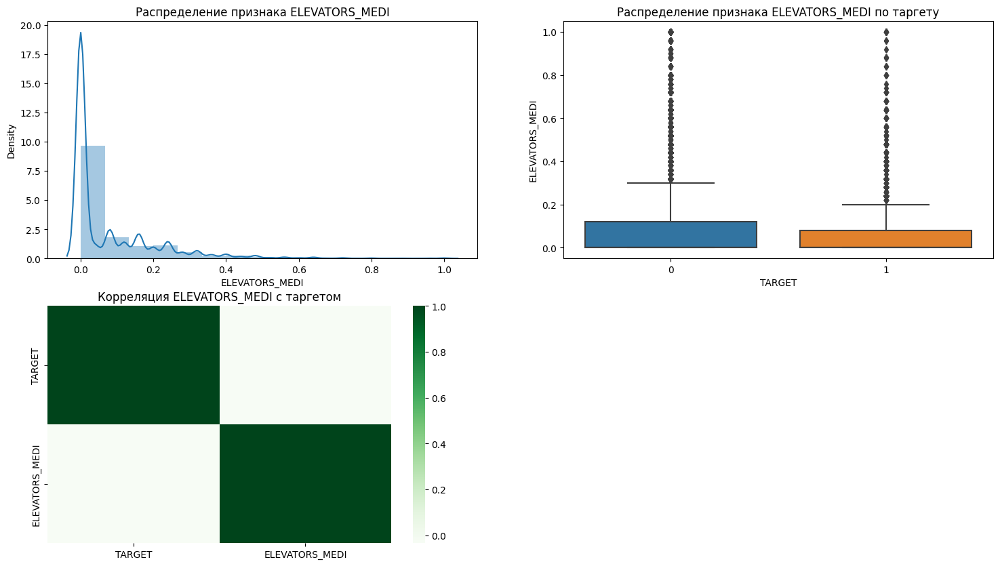

Колонка ENTRANCES_MEDI


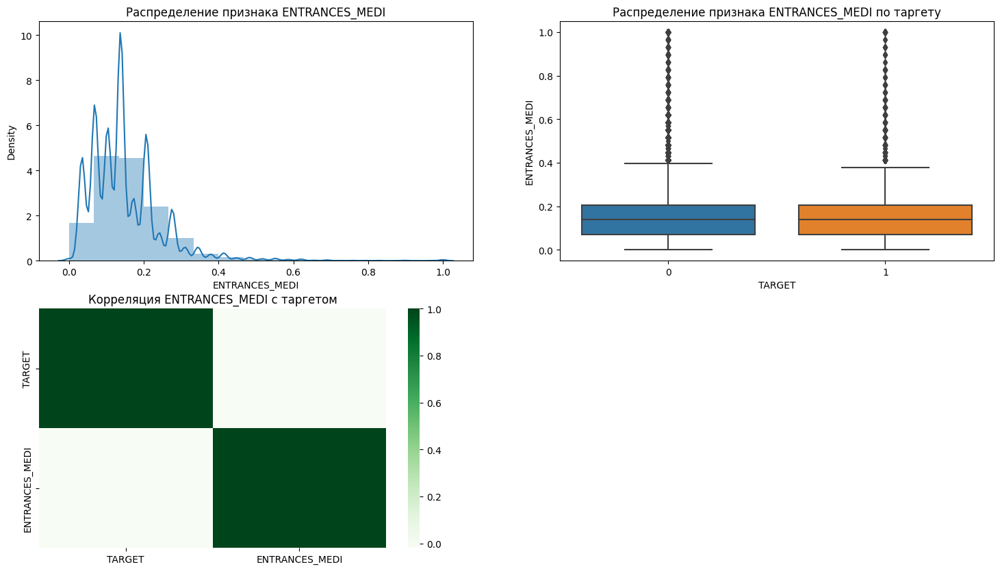

Колонка FLOORSMAX_MEDI


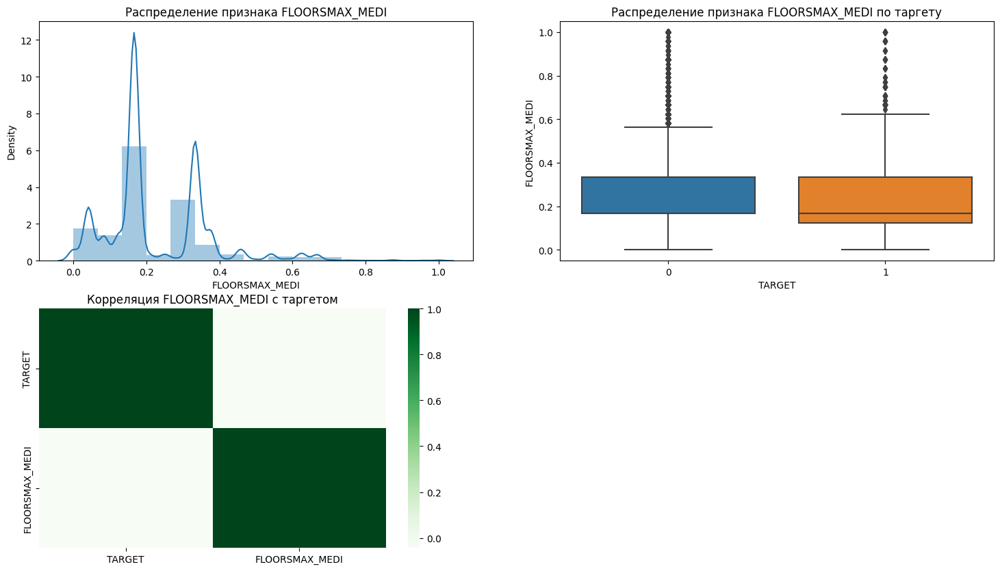

Колонка FLOORSMIN_MEDI


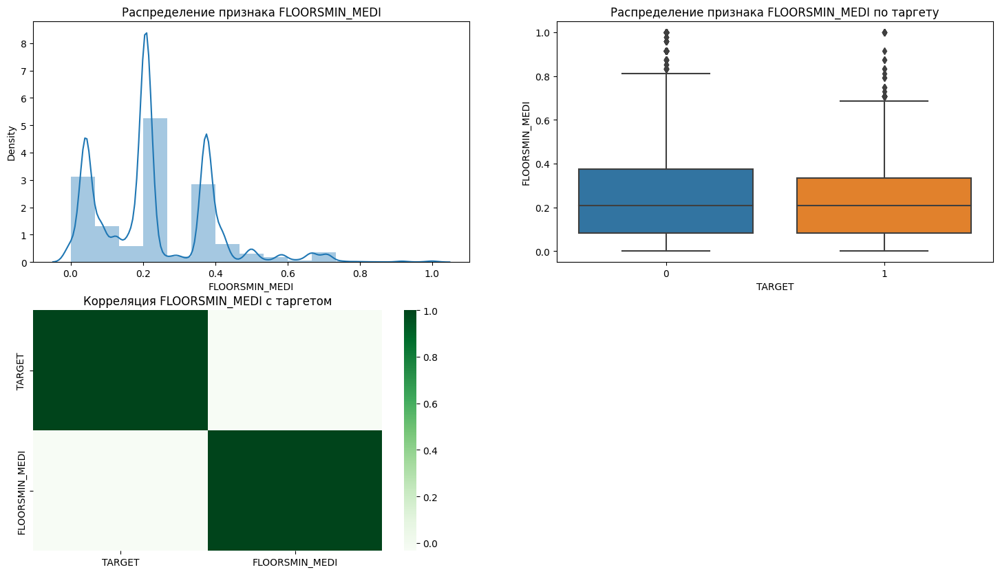

Колонка LANDAREA_MEDI


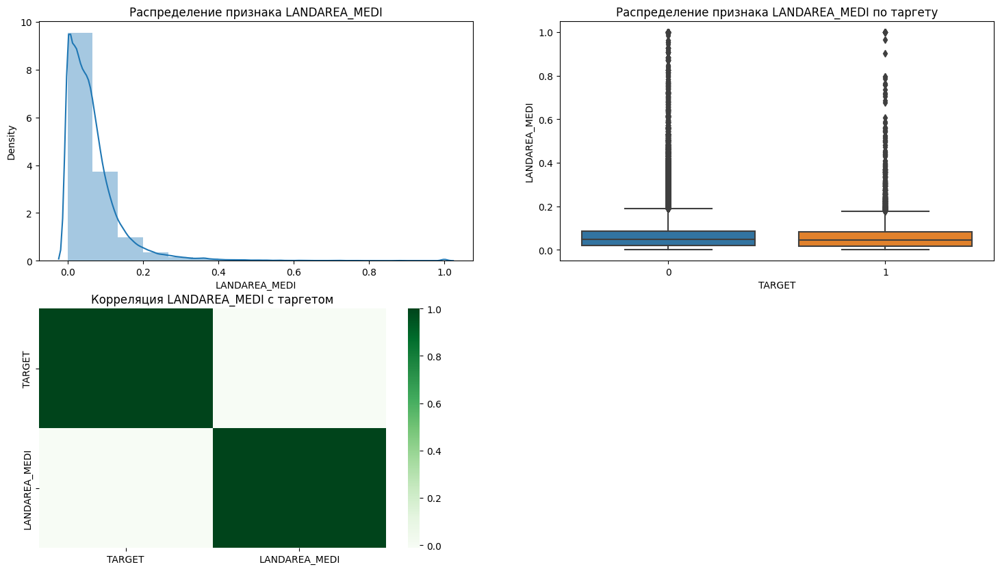

Колонка LIVINGAPARTMENTS_MEDI


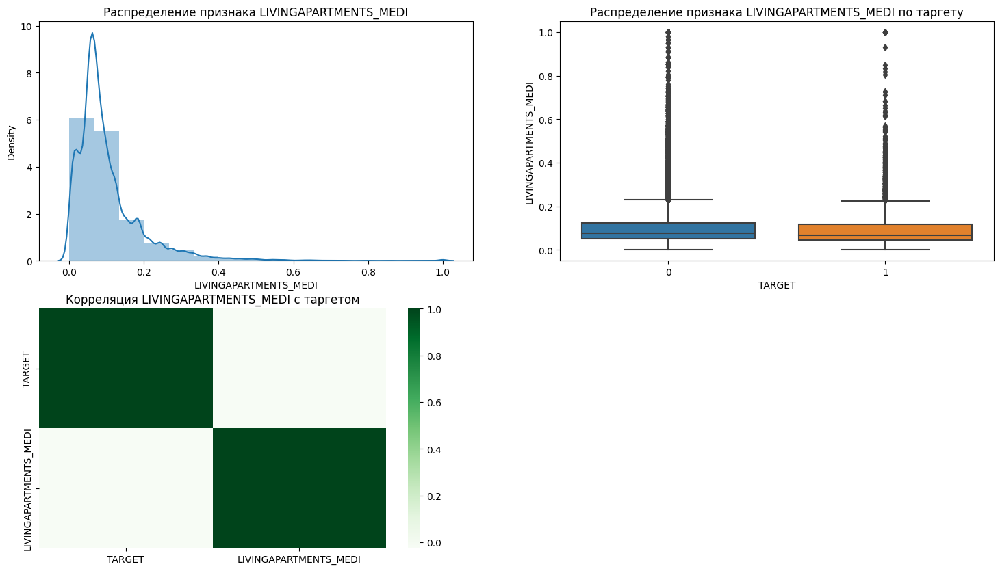

Колонка LIVINGAREA_MEDI


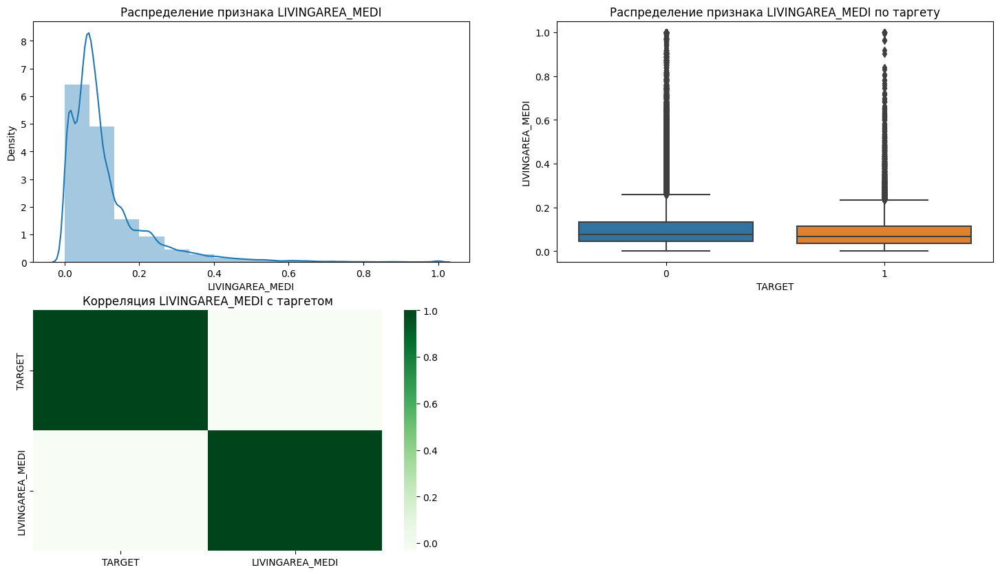

Колонка NONLIVINGAPARTMENTS_MEDI


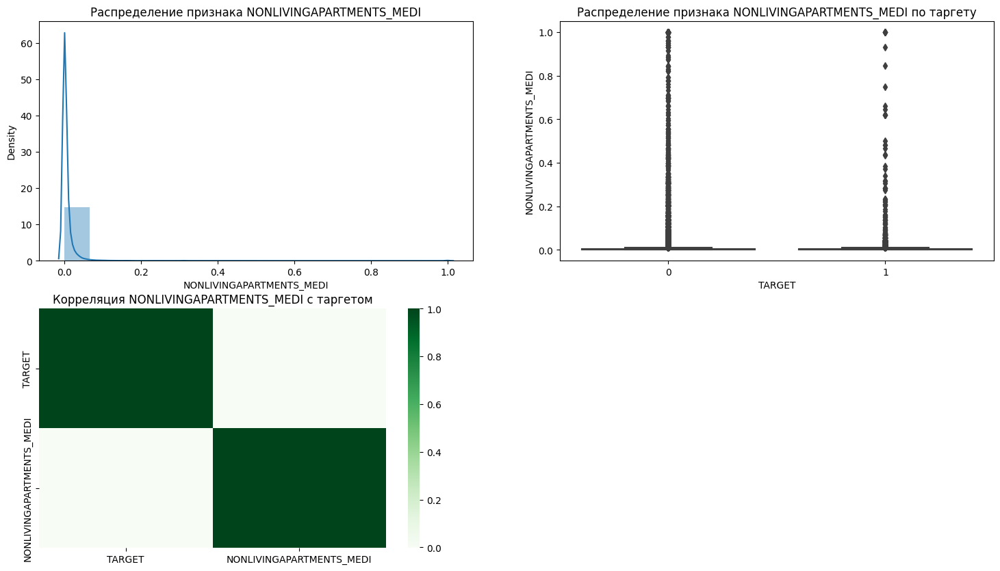

Колонка NONLIVINGAREA_MEDI


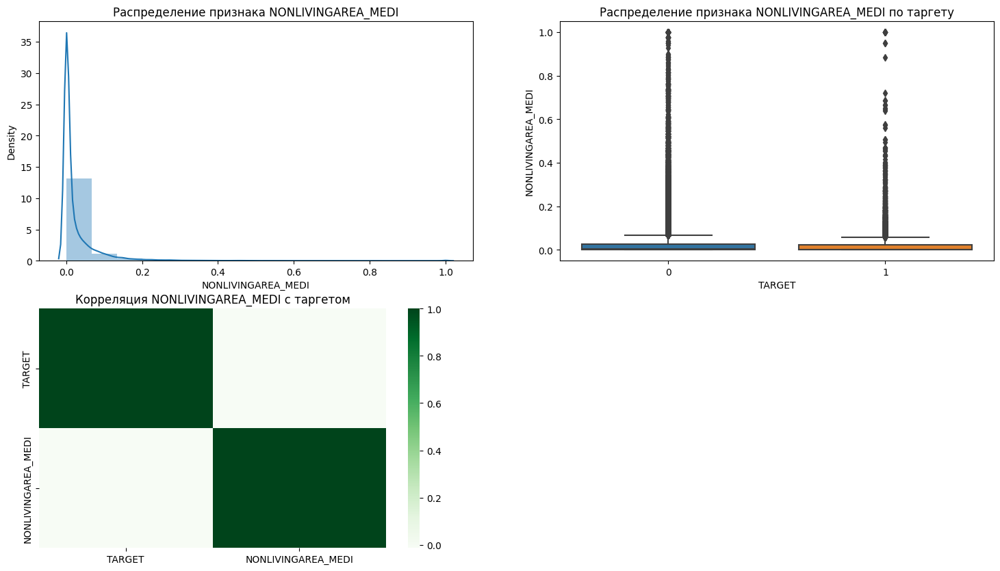

Колонка TOTALAREA_MODE


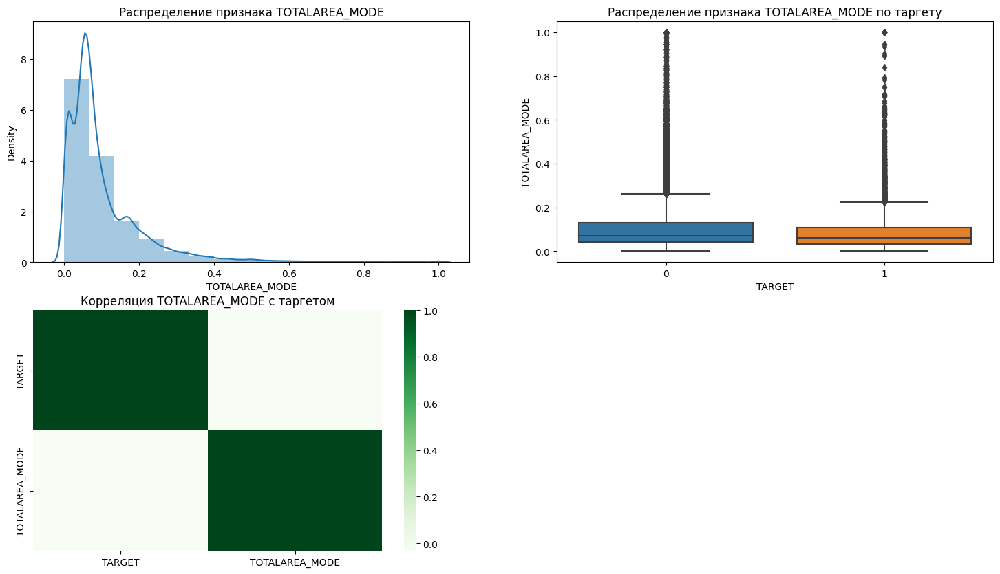

Колонка OBS_30_CNT_SOCIAL_CIRCLE


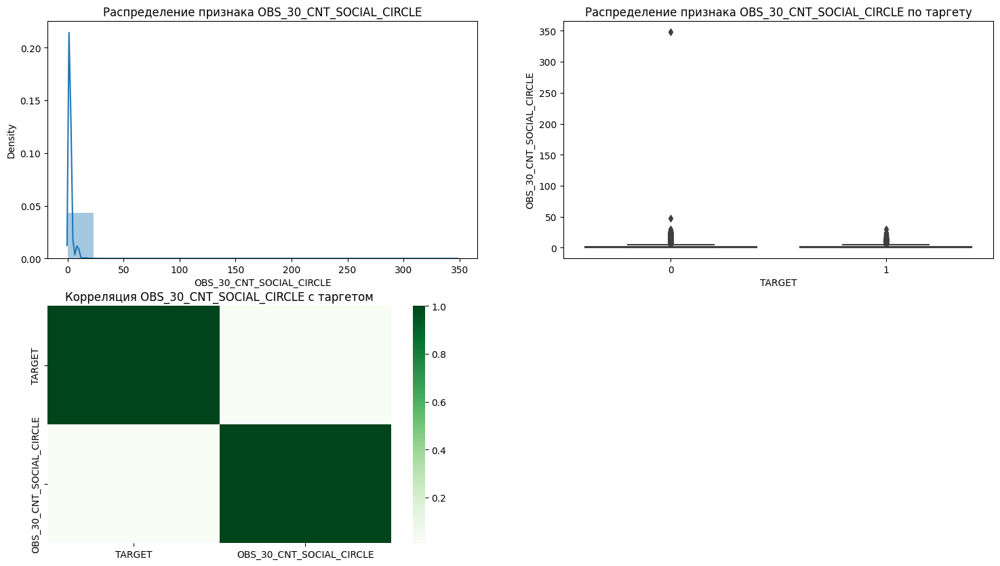

Колонка DEF_30_CNT_SOCIAL_CIRCLE


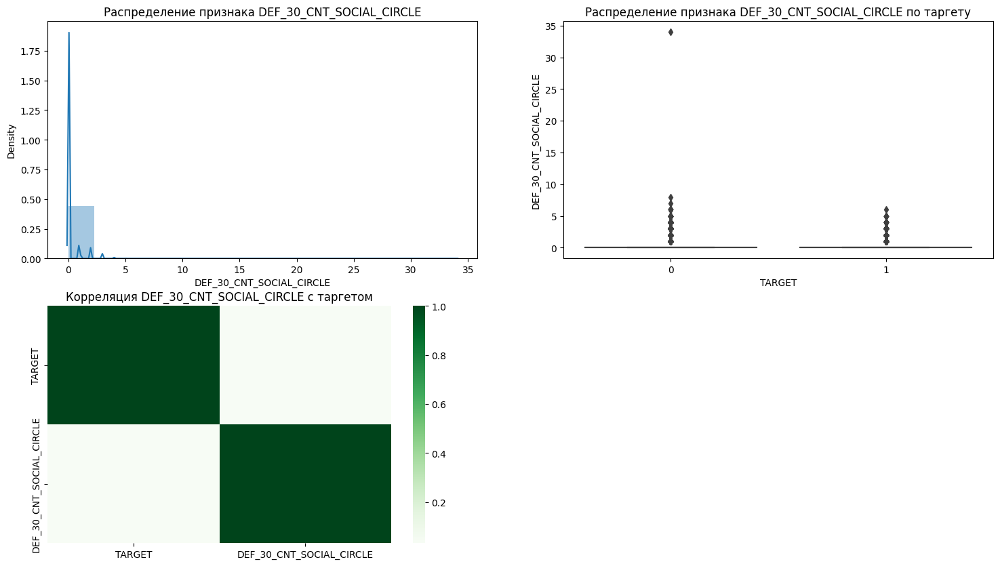

Колонка OBS_60_CNT_SOCIAL_CIRCLE


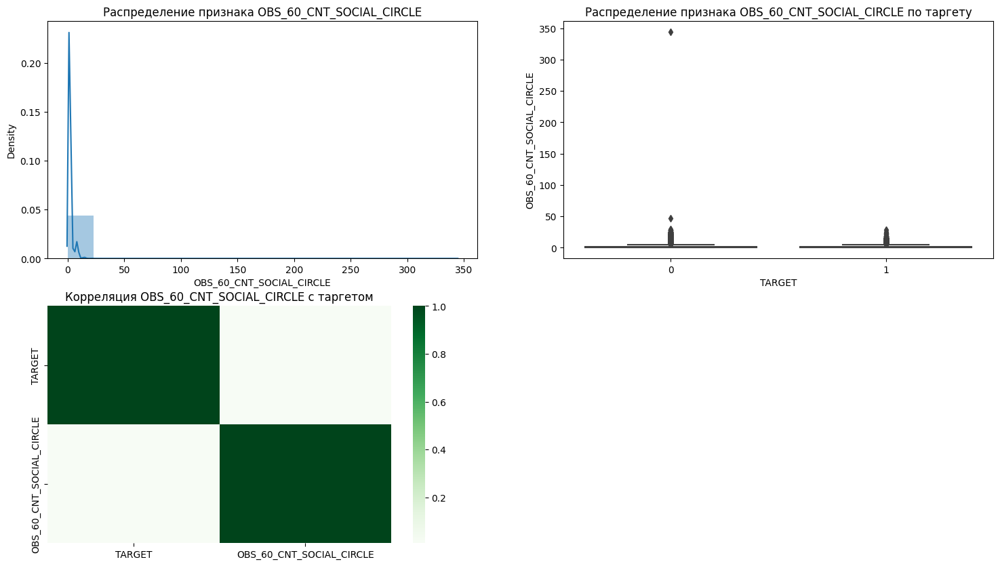

Колонка DEF_60_CNT_SOCIAL_CIRCLE


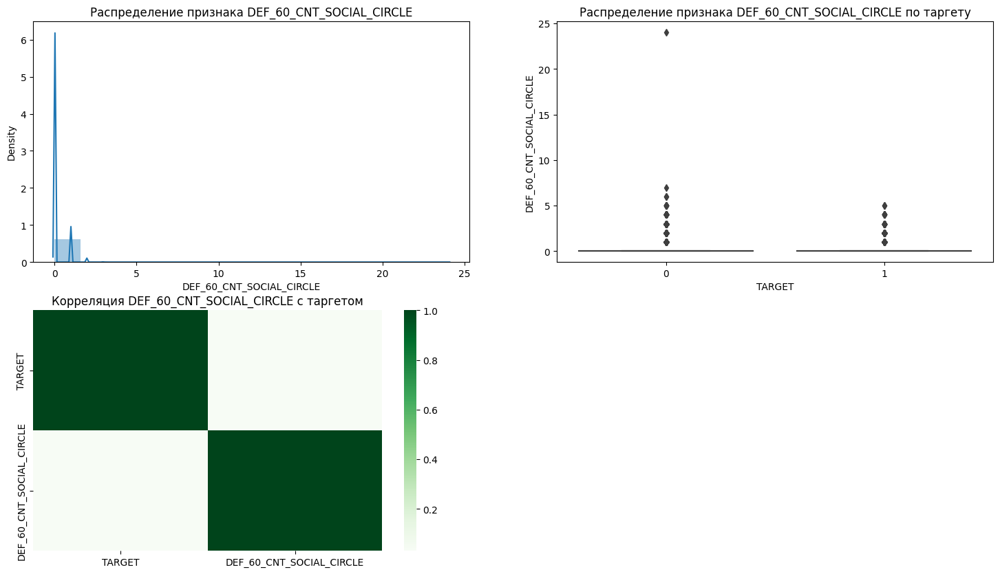

In [ ]:
for col in data_numeric_cols:
    numericDistributionGraph(col)

Колонка AMT_INCOME_TOTAL


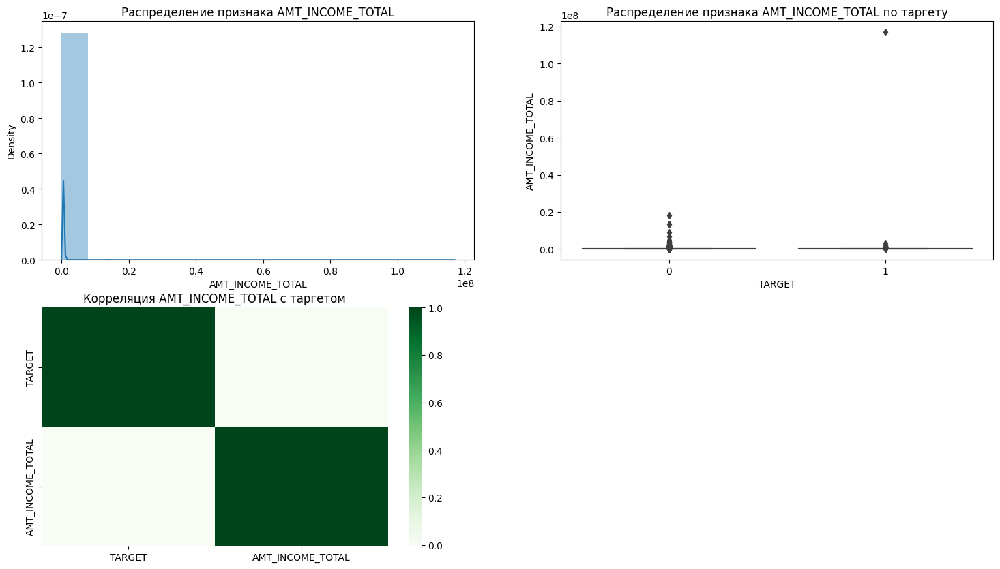

Колонка AMT_CREDIT


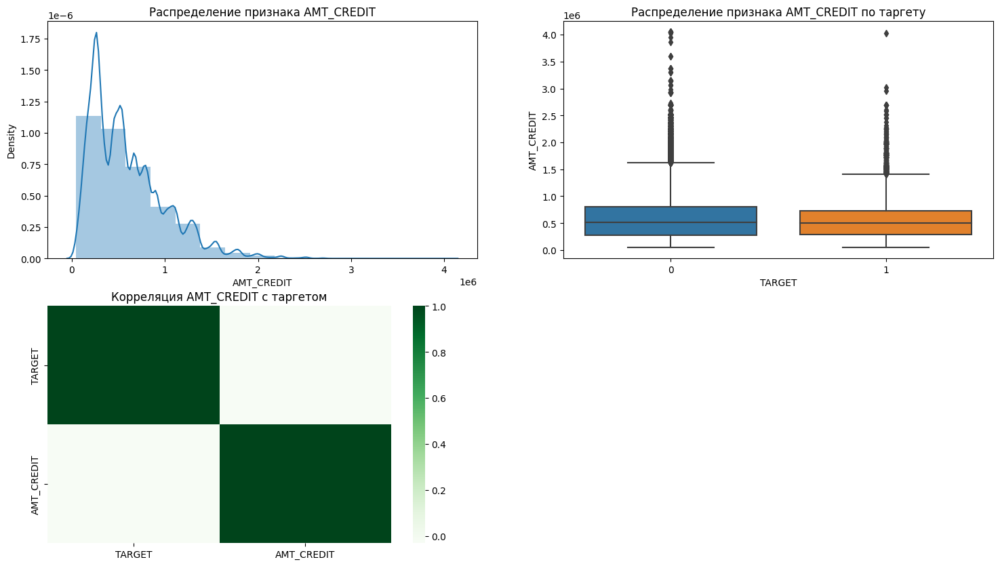

Колонка AMT_ANNUITY


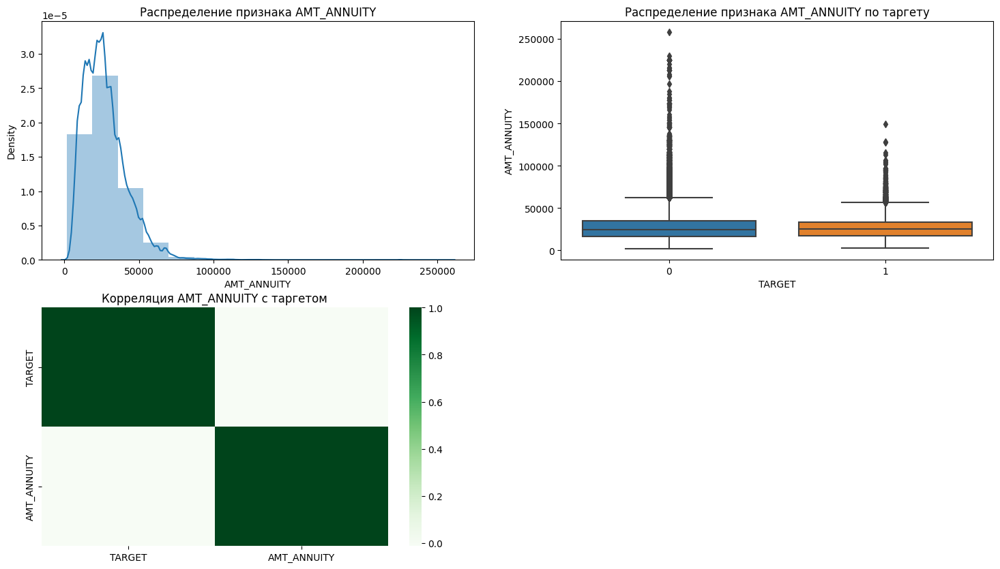

Колонка AMT_GOODS_PRICE


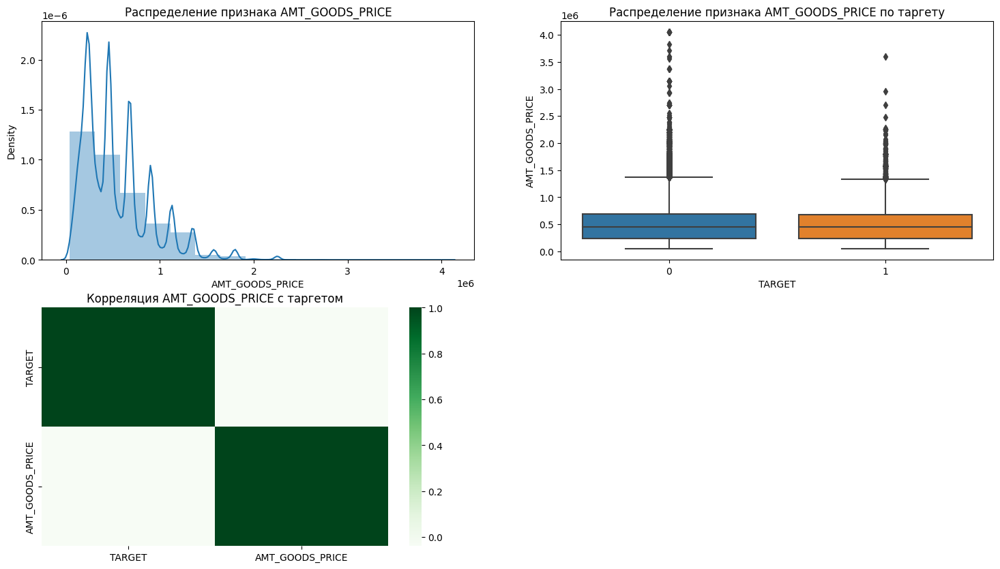

Колонка AMT_REQ_CREDIT_BUREAU_HOUR


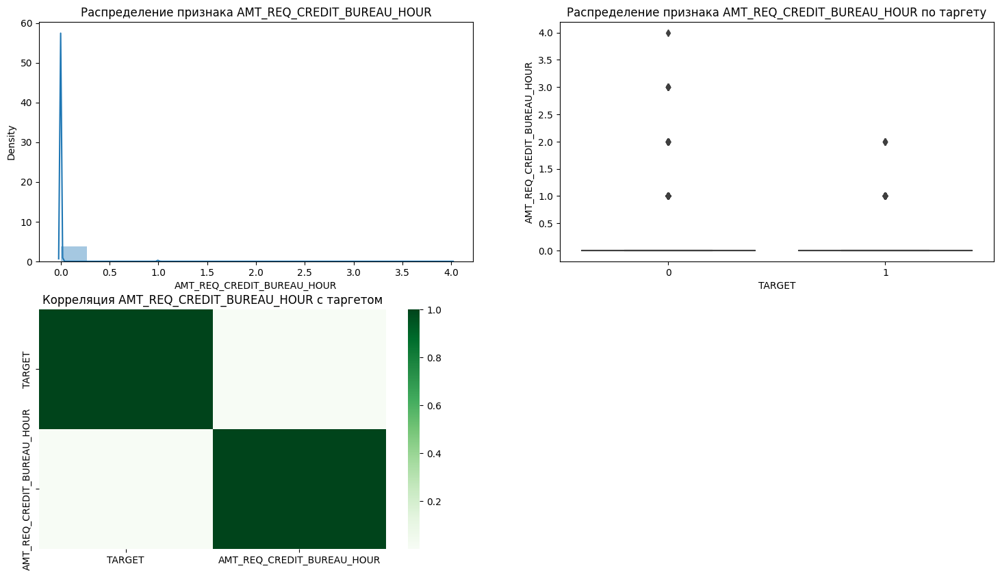

Колонка AMT_REQ_CREDIT_BUREAU_DAY


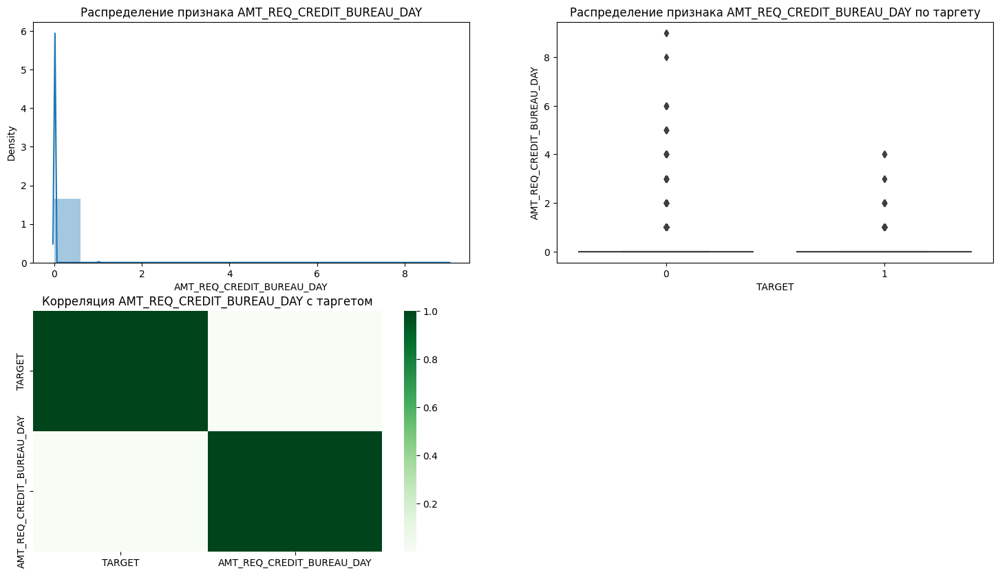

Колонка AMT_REQ_CREDIT_BUREAU_WEEK


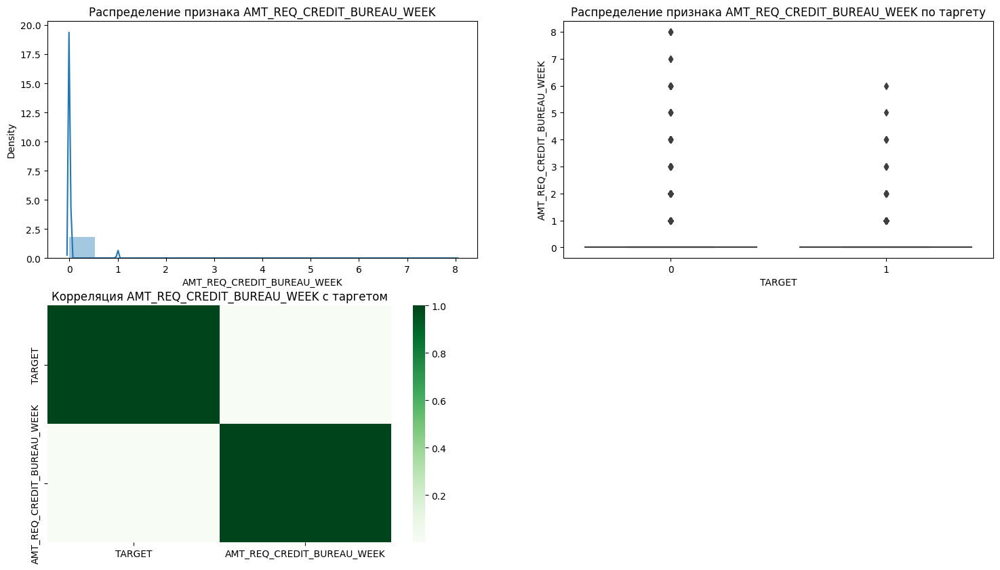

Колонка AMT_REQ_CREDIT_BUREAU_MON


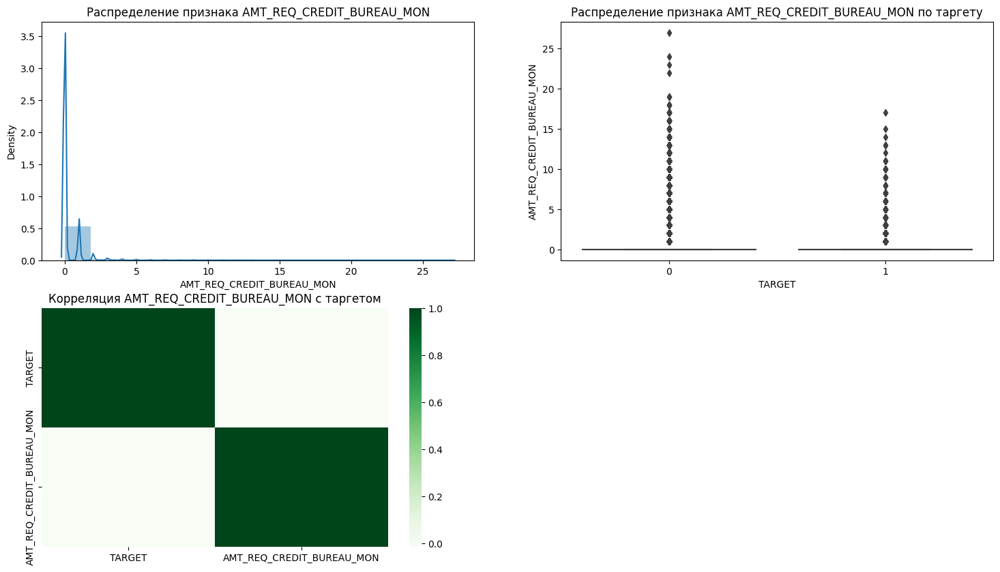

Колонка AMT_REQ_CREDIT_BUREAU_QRT


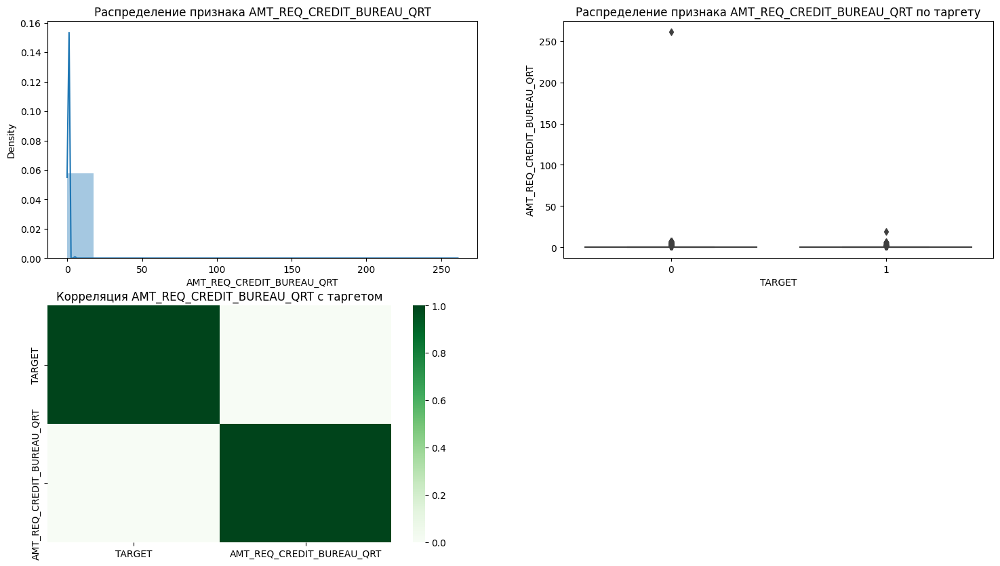

Колонка AMT_REQ_CREDIT_BUREAU_YEAR


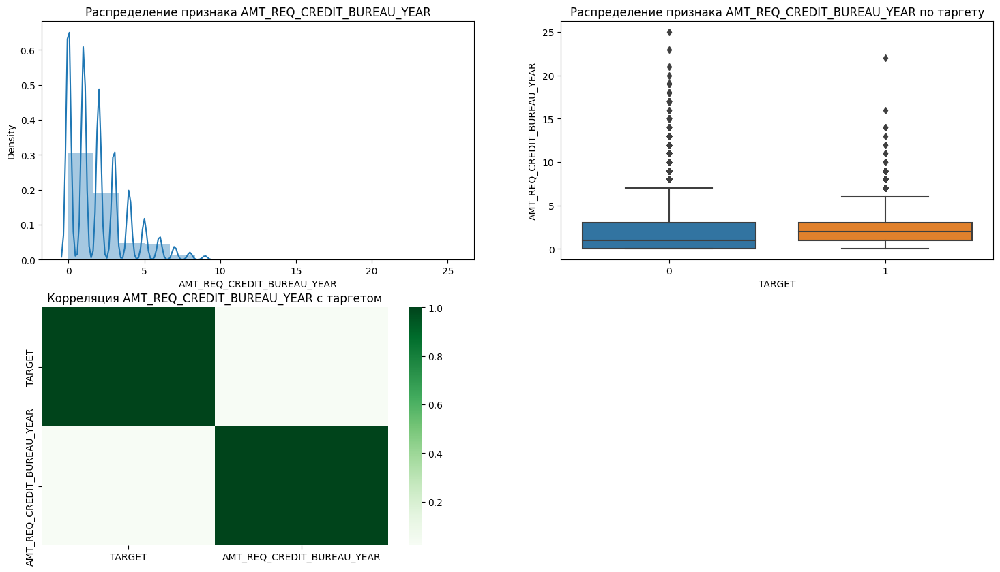

In [ ]:
for col in data_amt_cols:
    numericDistributionGraph(col)

Колонка FLAG_MOBIL


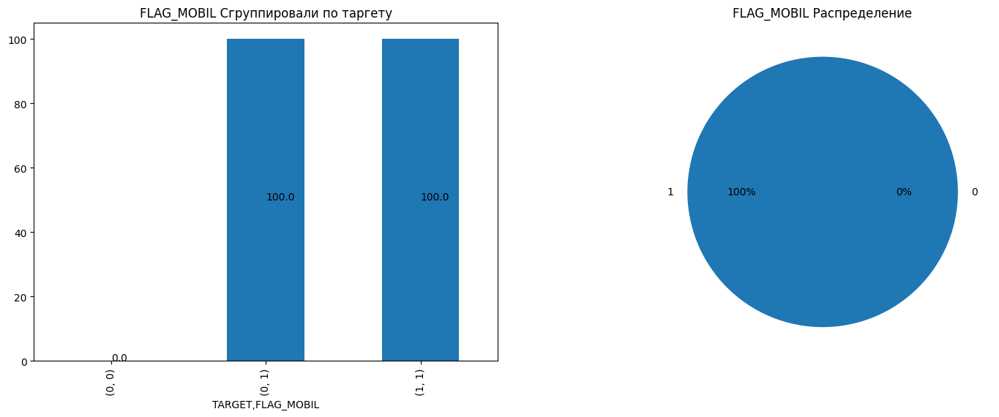

TARGET  FLAG_MOBIL
0       0               0.0
        1             100.0
1       1             100.0
Name: FLAG_MOBIL, dtype: float64



Колонка FLAG_EMP_PHONE


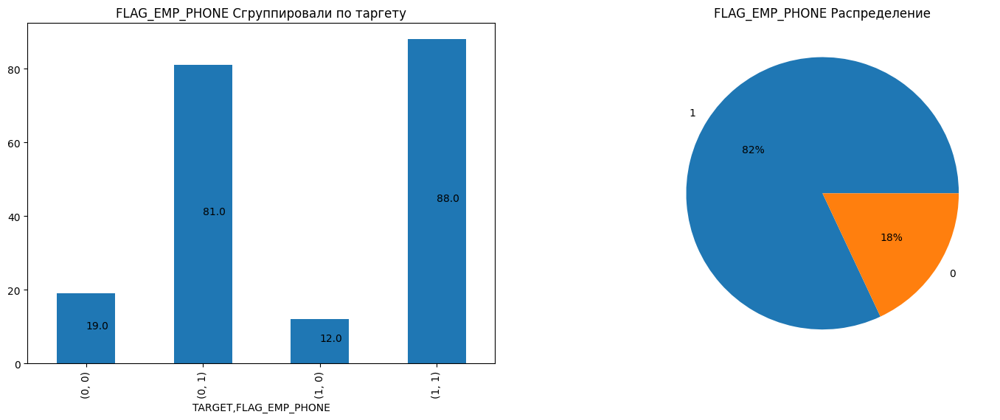

TARGET  FLAG_EMP_PHONE
0       0                 19.0
        1                 81.0
1       0                 12.0
        1                 88.0
Name: FLAG_EMP_PHONE, dtype: float64



Колонка FLAG_WORK_PHONE


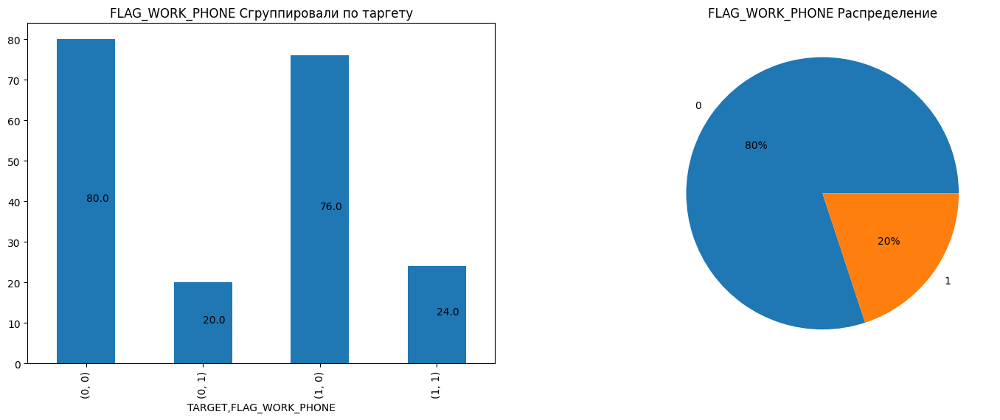

TARGET  FLAG_WORK_PHONE
0       0                  80.0
        1                  20.0
1       0                  76.0
        1                  24.0
Name: FLAG_WORK_PHONE, dtype: float64



Колонка FLAG_CONT_MOBILE


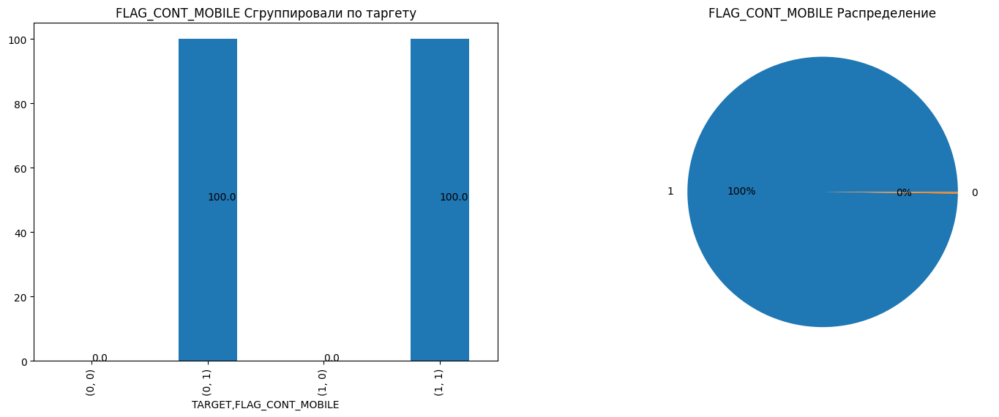

TARGET  FLAG_CONT_MOBILE
0       0                     0.0
        1                   100.0
1       0                     0.0
        1                   100.0
Name: FLAG_CONT_MOBILE, dtype: float64



Колонка FLAG_PHONE


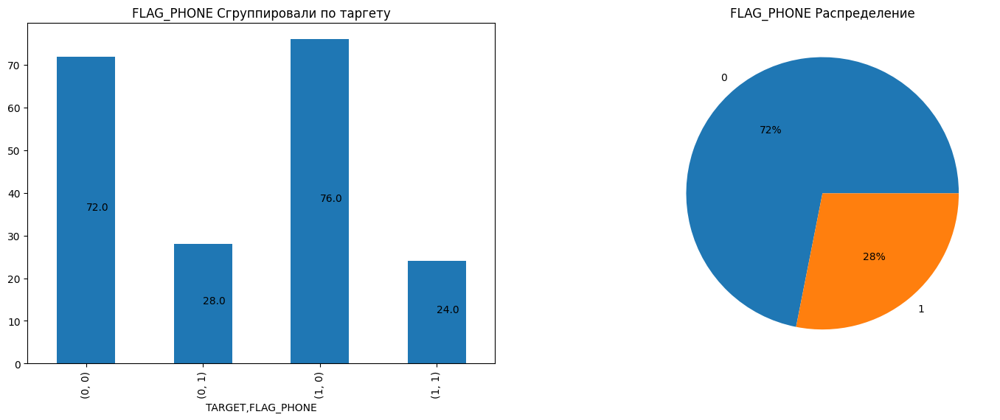

TARGET  FLAG_PHONE
0       0             72.0
        1             28.0
1       0             76.0
        1             24.0
Name: FLAG_PHONE, dtype: float64



Колонка FLAG_EMAIL


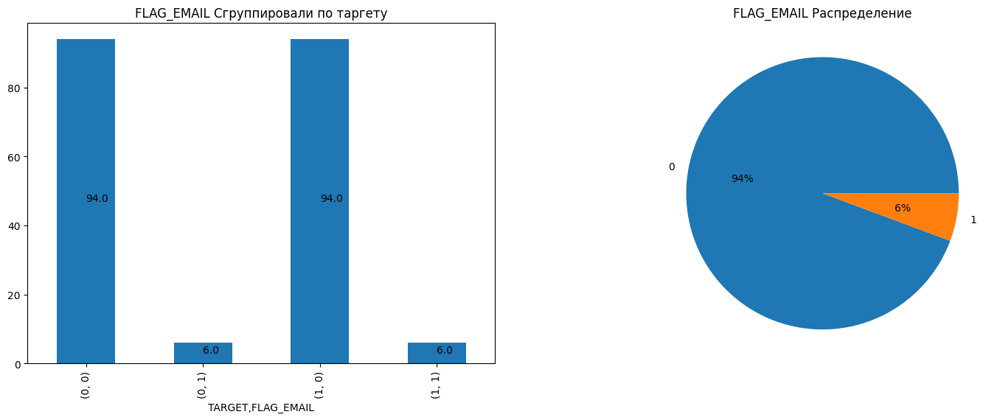

TARGET  FLAG_EMAIL
0       0             94.0
        1              6.0
1       0             94.0
        1              6.0
Name: FLAG_EMAIL, dtype: float64



Колонка FLAG_DOCUMENT_2


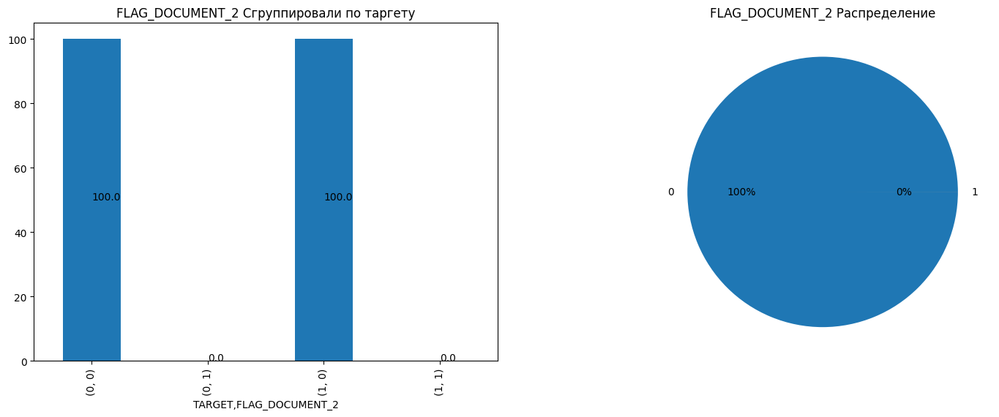

TARGET  FLAG_DOCUMENT_2
0       0                  100.0
        1                    0.0
1       0                  100.0
        1                    0.0
Name: FLAG_DOCUMENT_2, dtype: float64



Колонка FLAG_DOCUMENT_3


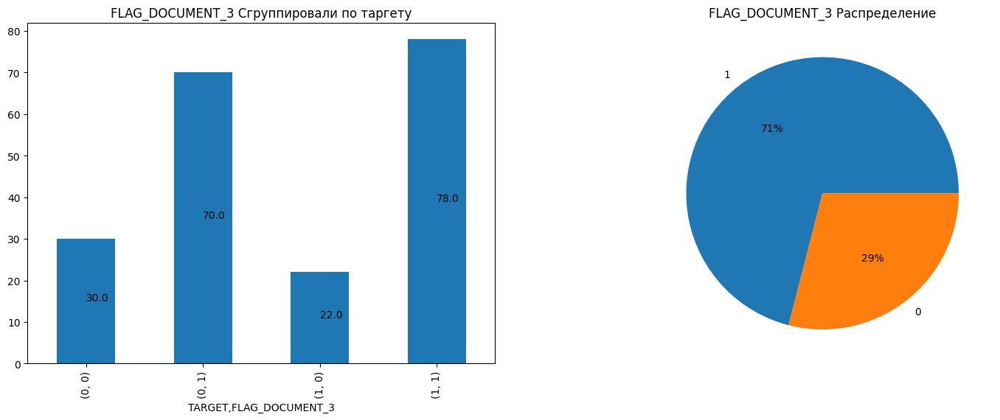

TARGET  FLAG_DOCUMENT_3
0       0                  30.0
        1                  70.0
1       0                  22.0
        1                  78.0
Name: FLAG_DOCUMENT_3, dtype: float64



Колонка FLAG_DOCUMENT_4


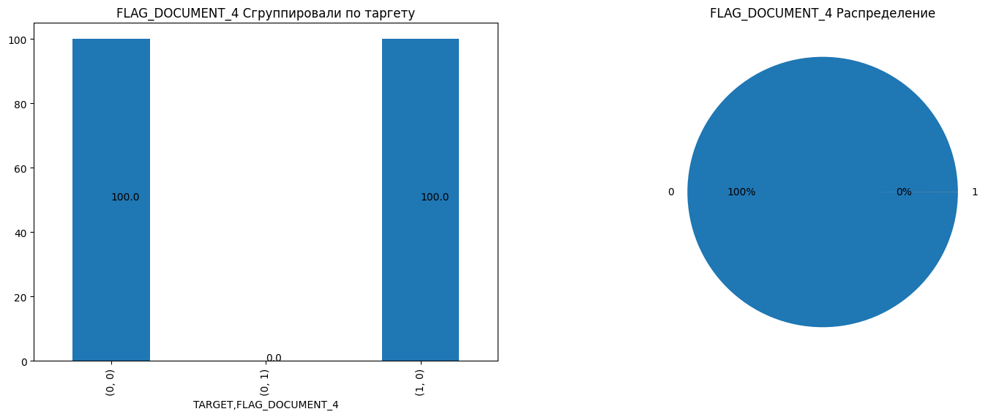

TARGET  FLAG_DOCUMENT_4
0       0                  100.0
        1                    0.0
1       0                  100.0
Name: FLAG_DOCUMENT_4, dtype: float64



Колонка FLAG_DOCUMENT_5


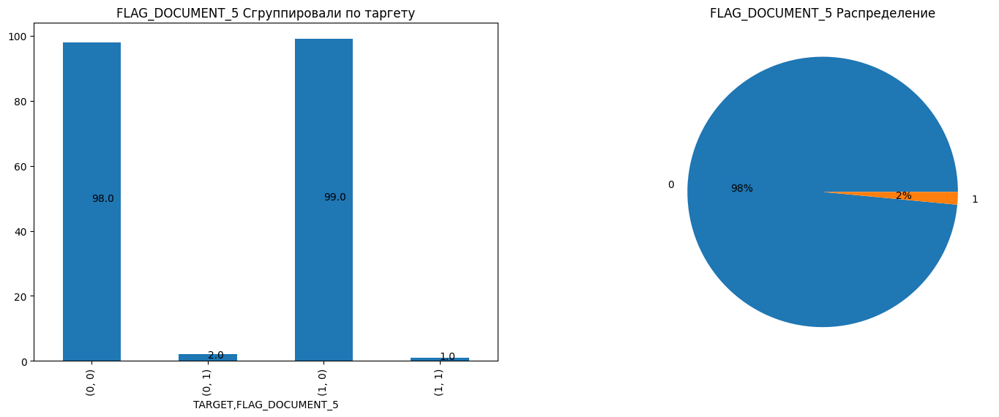

TARGET  FLAG_DOCUMENT_5
0       0                  98.0
        1                   2.0
1       0                  99.0
        1                   1.0
Name: FLAG_DOCUMENT_5, dtype: float64



Колонка FLAG_DOCUMENT_6


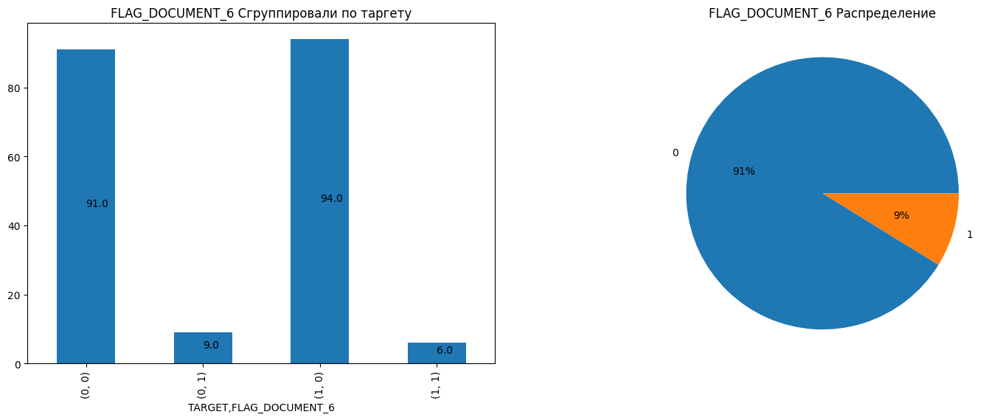

TARGET  FLAG_DOCUMENT_6
0       0                  91.0
        1                   9.0
1       0                  94.0
        1                   6.0
Name: FLAG_DOCUMENT_6, dtype: float64



Колонка FLAG_DOCUMENT_7


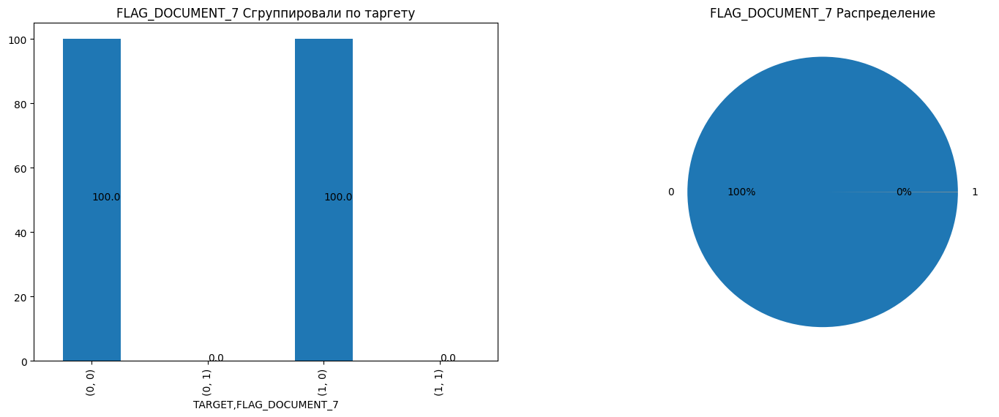

TARGET  FLAG_DOCUMENT_7
0       0                  100.0
        1                    0.0
1       0                  100.0
        1                    0.0
Name: FLAG_DOCUMENT_7, dtype: float64



Колонка FLAG_DOCUMENT_8


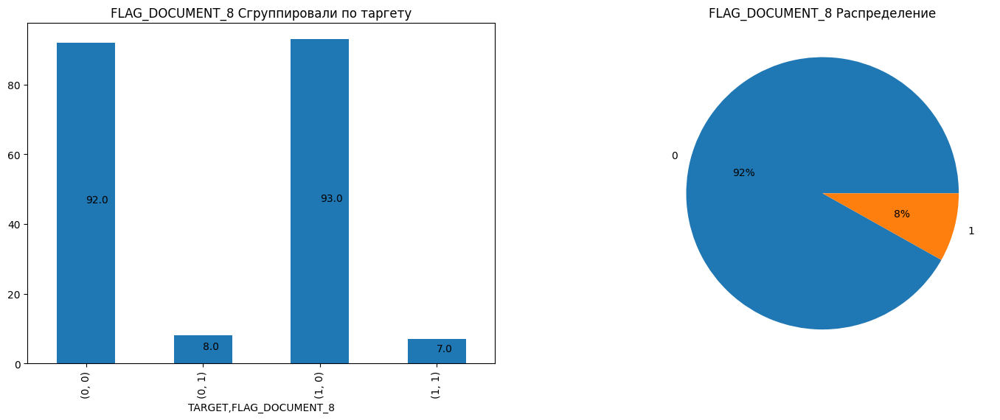

TARGET  FLAG_DOCUMENT_8
0       0                  92.0
        1                   8.0
1       0                  93.0
        1                   7.0
Name: FLAG_DOCUMENT_8, dtype: float64



Колонка FLAG_DOCUMENT_9


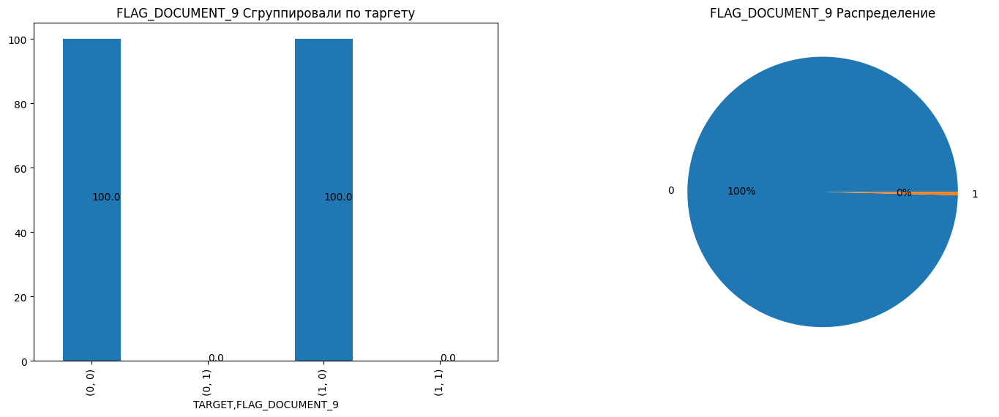

TARGET  FLAG_DOCUMENT_9
0       0                  100.0
        1                    0.0
1       0                  100.0
        1                    0.0
Name: FLAG_DOCUMENT_9, dtype: float64



Колонка FLAG_DOCUMENT_10


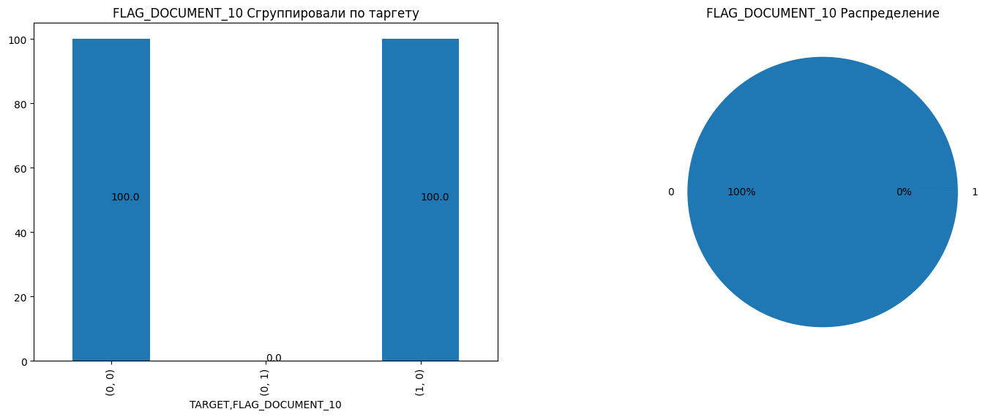

TARGET  FLAG_DOCUMENT_10
0       0                   100.0
        1                     0.0
1       0                   100.0
Name: FLAG_DOCUMENT_10, dtype: float64



Колонка FLAG_DOCUMENT_11


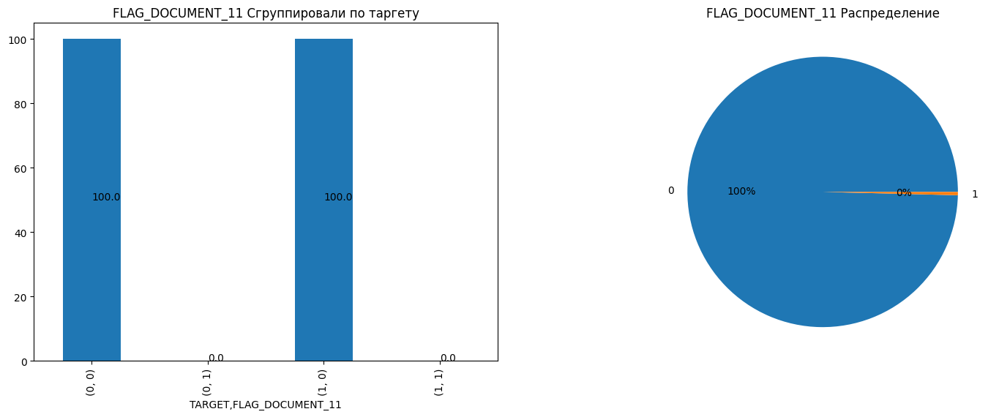

TARGET  FLAG_DOCUMENT_11
0       0                   100.0
        1                     0.0
1       0                   100.0
        1                     0.0
Name: FLAG_DOCUMENT_11, dtype: float64



Колонка FLAG_DOCUMENT_12


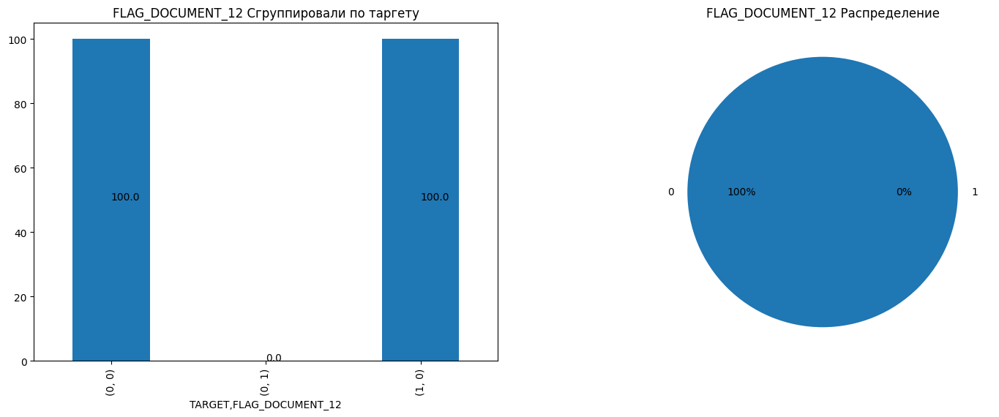

TARGET  FLAG_DOCUMENT_12
0       0                   100.0
        1                     0.0
1       0                   100.0
Name: FLAG_DOCUMENT_12, dtype: float64



Колонка FLAG_DOCUMENT_13


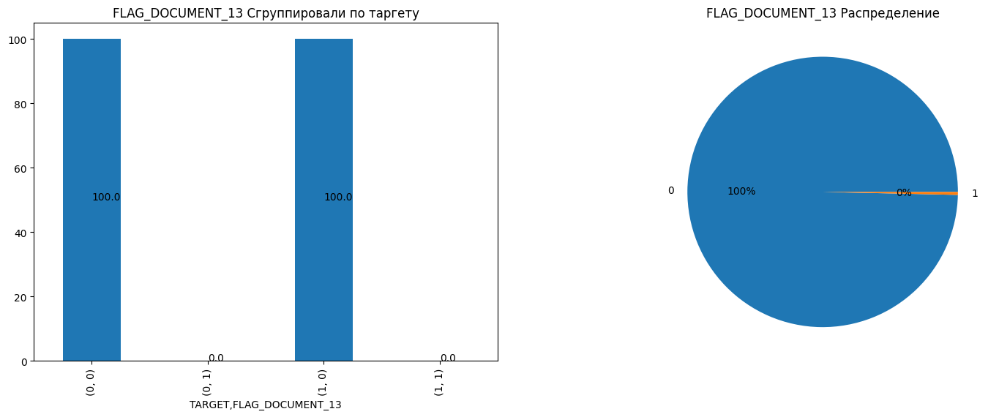

TARGET  FLAG_DOCUMENT_13
0       0                   100.0
        1                     0.0
1       0                   100.0
        1                     0.0
Name: FLAG_DOCUMENT_13, dtype: float64



Колонка FLAG_DOCUMENT_14


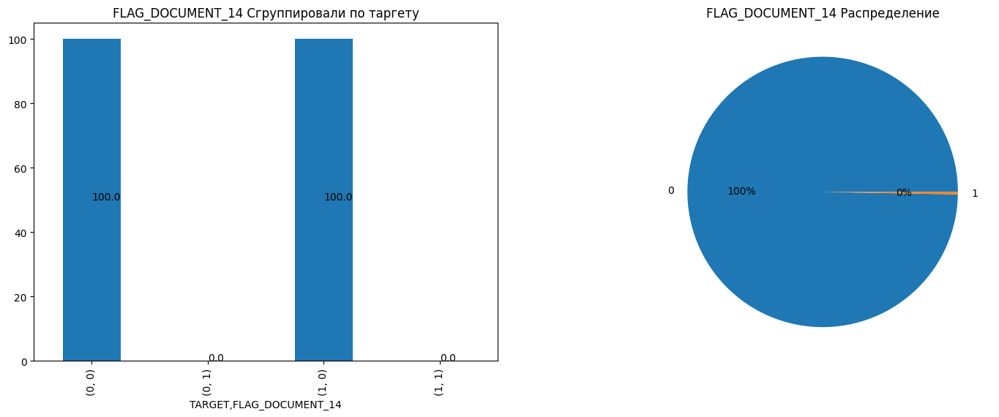

TARGET  FLAG_DOCUMENT_14
0       0                   100.0
        1                     0.0
1       0                   100.0
        1                     0.0
Name: FLAG_DOCUMENT_14, dtype: float64



Колонка FLAG_DOCUMENT_15


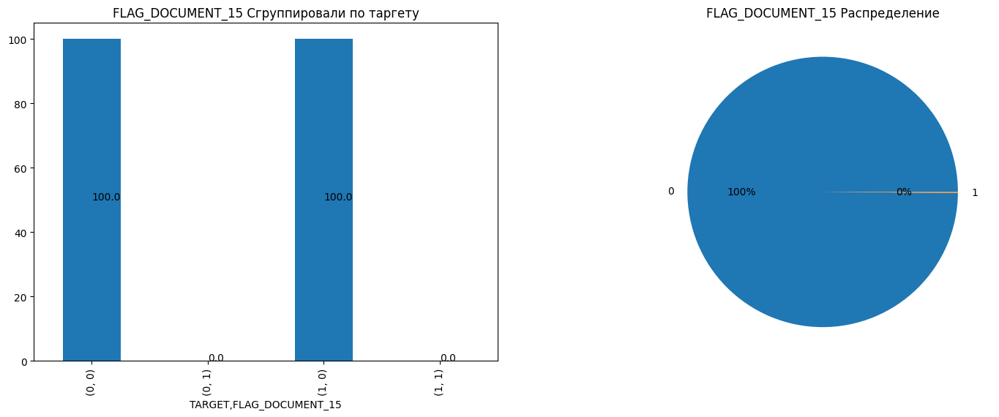

TARGET  FLAG_DOCUMENT_15
0       0                   100.0
        1                     0.0
1       0                   100.0
        1                     0.0
Name: FLAG_DOCUMENT_15, dtype: float64



Колонка FLAG_DOCUMENT_16


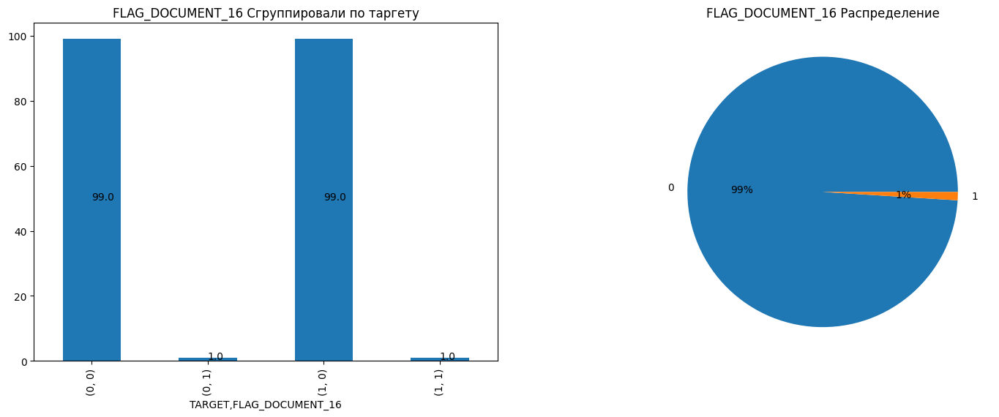

TARGET  FLAG_DOCUMENT_16
0       0                   99.0
        1                    1.0
1       0                   99.0
        1                    1.0
Name: FLAG_DOCUMENT_16, dtype: float64



Колонка FLAG_DOCUMENT_17


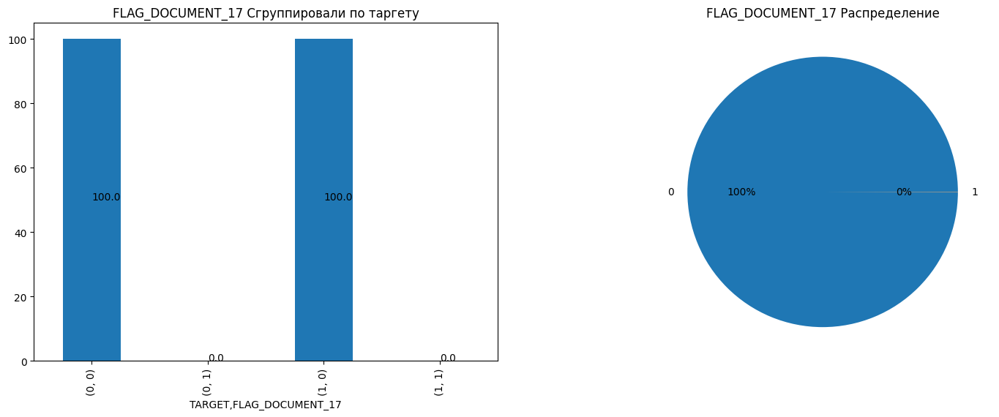

TARGET  FLAG_DOCUMENT_17
0       0                   100.0
        1                     0.0
1       0                   100.0
        1                     0.0
Name: FLAG_DOCUMENT_17, dtype: float64



Колонка FLAG_DOCUMENT_18


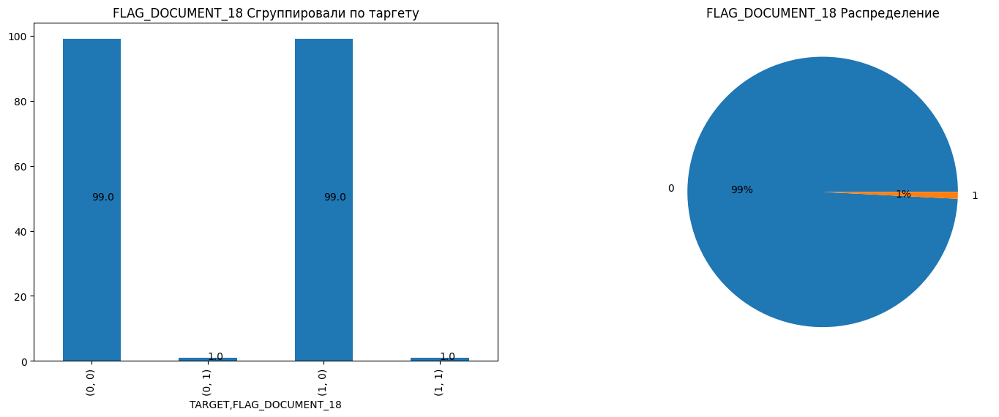

TARGET  FLAG_DOCUMENT_18
0       0                   99.0
        1                    1.0
1       0                   99.0
        1                    1.0
Name: FLAG_DOCUMENT_18, dtype: float64



Колонка FLAG_DOCUMENT_19


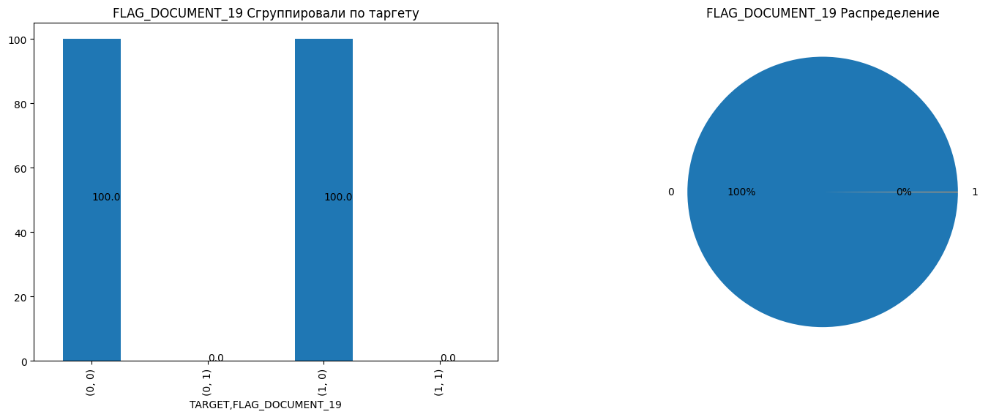

TARGET  FLAG_DOCUMENT_19
0       0                   100.0
        1                     0.0
1       0                   100.0
        1                     0.0
Name: FLAG_DOCUMENT_19, dtype: float64



Колонка FLAG_DOCUMENT_20


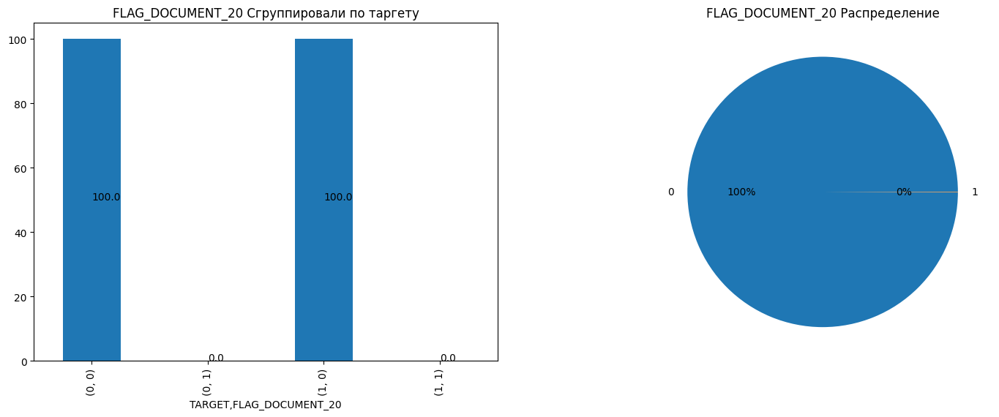

TARGET  FLAG_DOCUMENT_20
0       0                   100.0
        1                     0.0
1       0                   100.0
        1                     0.0
Name: FLAG_DOCUMENT_20, dtype: float64



Колонка FLAG_DOCUMENT_21


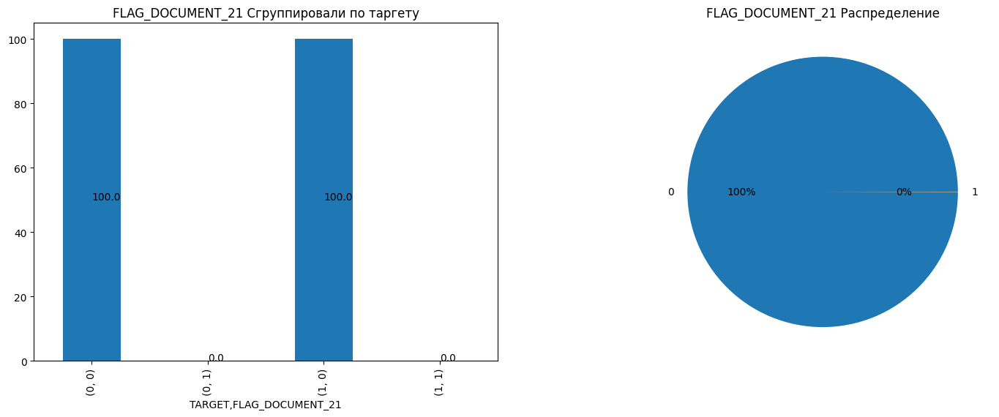

TARGET  FLAG_DOCUMENT_21
0       0                   100.0
        1                     0.0
1       0                   100.0
        1                     0.0
Name: FLAG_DOCUMENT_21, dtype: float64





In [ ]:
for col in data_flag_cols:
    distributionGraphs(col)

### Обработка данных, связанных с днями

In [ ]:
current_data[data_days_cols].describe().T

,count,mean,std,min,25%,50%,75%,max
DAYS_BIRTH,307511.0,-16036.995067,4363.988632,-25229.0,-19682.0,-15750.0,-12413.0,-7489.0
DAYS_EMPLOYED,307511.0,63815.045904,141275.766519,-17912.0,-2760.0,-1213.0,-289.0,365243.0
DAYS_REGISTRATION,307511.0,-4986.120328,3522.886321,-24672.0,-7479.5,-4504.0,-2010.0,0.0
DAYS_ID_PUBLISH,307511.0,-2994.202373,1509.450419,-7197.0,-4299.0,-3254.0,-1720.0,0.0
HOUR_APPR_PROCESS_START,307511.0,12.063419,3.265832,0.0,10.0,12.0,14.0,23.0
DAYS_LAST_PHONE_CHANGE,307510.0,-962.858788,826.808487,-4292.0,-1570.0,-757.0,-274.0,0.0


In [ ]:
for col in ['DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'DAYS_LAST_PHONE_CHANGE']:
    current_data[col] = abs(current_data[col] / 360)

In [ ]:
current_data[data_days_cols].describe().T

,count,mean,std,min,25%,50%,75%,max
DAYS_BIRTH,307511.0,44.547209,12.122191,20.802778,34.480556,43.750000,54.672222,70.080556
DAYS_EMPLOYED,307511.0,188.124284,387.343755,0.000000,2.591667,6.163889,15.852778,1014.563889
DAYS_REGISTRATION,307511.0,13.850334,9.785795,0.000000,5.583333,12.511111,20.776389,68.533333
DAYS_ID_PUBLISH,307511.0,8.317229,4.192918,0.000000,4.777778,9.038889,11.941667,19.991667
HOUR_APPR_PROCESS_START,307511.0,12.063419,3.265832,0.000000,10.000000,12.000000,14.000000,23.000000
DAYS_LAST_PHONE_CHANGE,307510.0,2.674608,2.296690,0.000000,0.761111,2.102778,4.361111,11.922222


In [ ]:
bins = [0,30, 40, 50, 60,100]
labels = ['<30','30-40','40-50','50-60','>60']
current_data.DAYS_BIRTH = pd.cut(current_data.DAYS_BIRTH, bins, labels=labels)

bins = [0, 2, 4, 6, 8, 10, 50]
labels = ['<2','2-4','4-6','6-8','8-10','>10']
current_data.DAYS_EMPLOYED = pd.cut(current_data.DAYS_EMPLOYED,bins,labels=labels)

bins = [0, 4, 8, 12, 16, 20, 63]
labels = ['<4','4-8','8-12','12-16','16-20','>20']
current_data.DAYS_REGISTRATION = pd.cut(current_data.DAYS_REGISTRATION,bins,labels=labels)

bins = [0, 4, 8, 12, 16, 20]
labels = ['<4','4-8','8-12','12-16','>16']
current_data.DAYS_ID_PUBLISH = pd.cut(current_data.DAYS_ID_PUBLISH,bins,labels=labels)

bins = [0, 6, 12, 18, 24]
labels = ['12AM-6AM','6AM-12PM','12PM-6PM','6PM-12AM']
current_data.HOUR_APPR_PROCESS_START = pd.cut(current_data.HOUR_APPR_PROCESS_START,bins,labels=labels)

bins = [0, 1, 2, 3, 4, 12]
labels = ['<1','1-2','2-3','3-4','>4']
current_data.DAYS_LAST_PHONE_CHANGE = pd.cut(current_data.DAYS_LAST_PHONE_CHANGE,bins,labels=labels)

Колонка DAYS_BIRTH


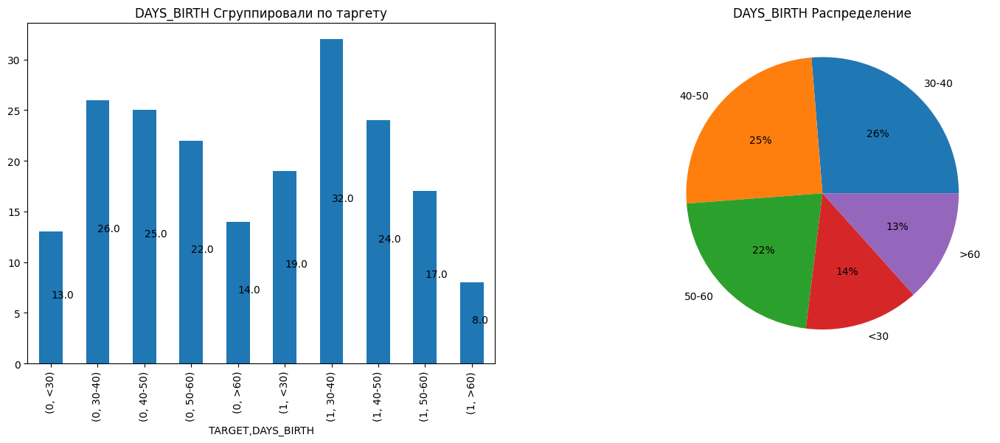

TARGET  DAYS_BIRTH
0       <30           13.0
        30-40         26.0
        40-50         25.0
        50-60         22.0
        >60           14.0
1       <30           19.0
        30-40         32.0
        40-50         24.0
        50-60         17.0
        >60            8.0
Name: DAYS_BIRTH, dtype: float64



Колонка DAYS_EMPLOYED


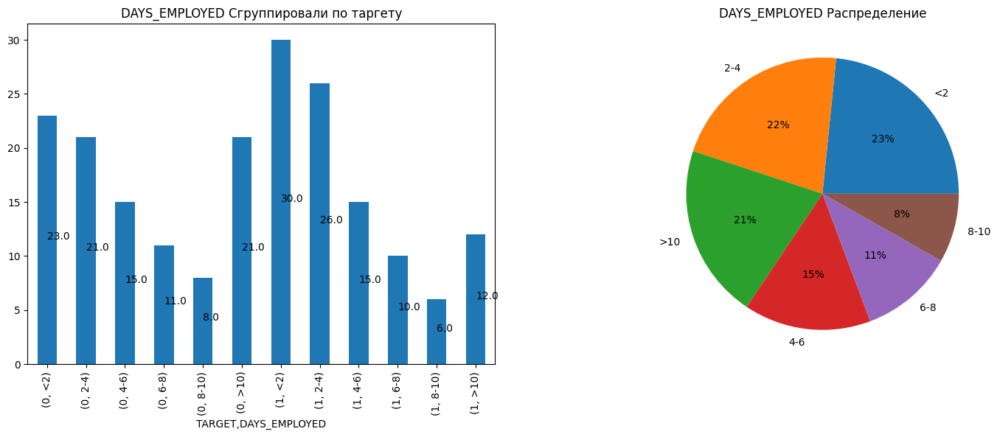

TARGET  DAYS_EMPLOYED
0       <2               23.0
        2-4              21.0
        4-6              15.0
        6-8              11.0
        8-10              8.0
        >10              21.0
1       <2               30.0
        2-4              26.0
        4-6              15.0
        6-8              10.0
        8-10              6.0
        >10              12.0
Name: DAYS_EMPLOYED, dtype: float64



Колонка DAYS_REGISTRATION


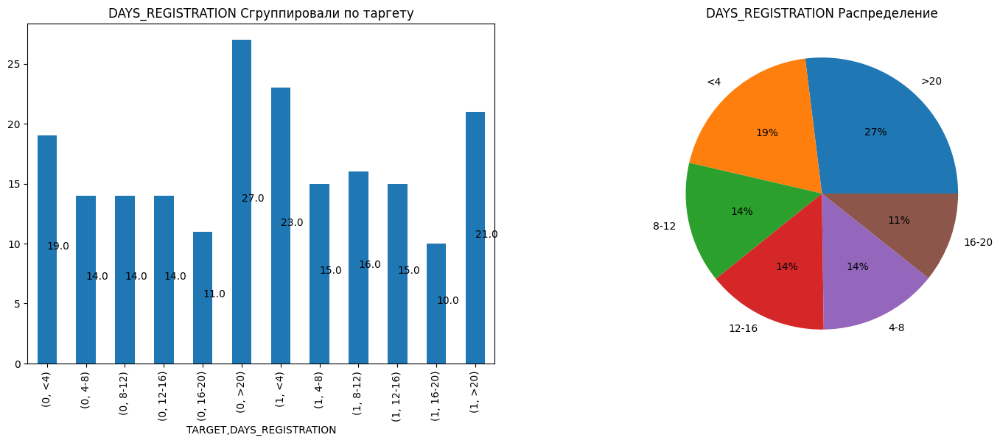

TARGET  DAYS_REGISTRATION
0       <4                   19.0
        4-8                  14.0
        8-12                 14.0
        12-16                14.0
        16-20                11.0
        >20                  27.0
1       <4                   23.0
        4-8                  15.0
        8-12                 16.0
        12-16                15.0
        16-20                10.0
        >20                  21.0
Name: DAYS_REGISTRATION, dtype: float64



Колонка DAYS_ID_PUBLISH


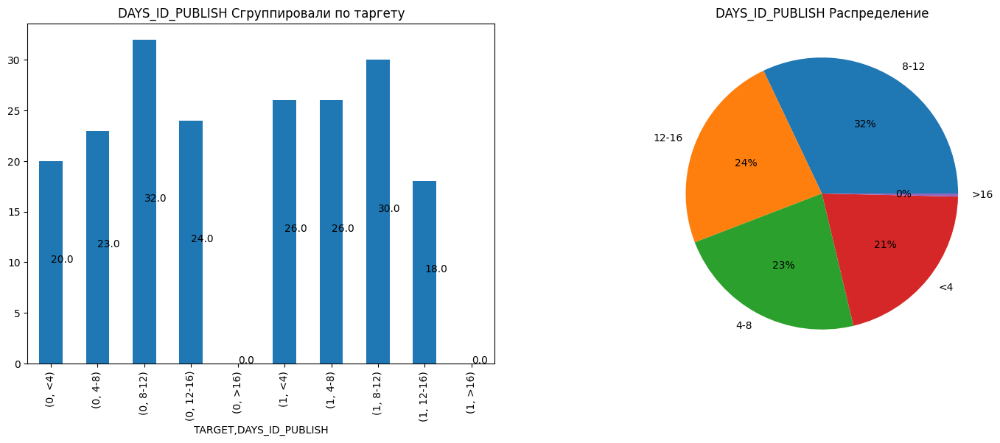

TARGET  DAYS_ID_PUBLISH
0       <4                 20.0
        4-8                23.0
        8-12               32.0
        12-16              24.0
        >16                 0.0
1       <4                 26.0
        4-8                26.0
        8-12               30.0
        12-16              18.0
        >16                 0.0
Name: DAYS_ID_PUBLISH, dtype: float64



Колонка HOUR_APPR_PROCESS_START


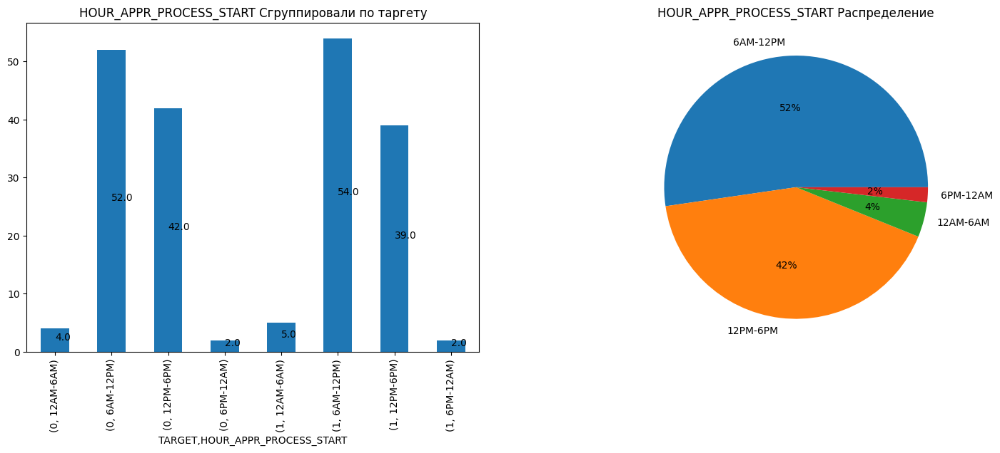

TARGET  HOUR_APPR_PROCESS_START
0       12AM-6AM                    4.0
        6AM-12PM                   52.0
        12PM-6PM                   42.0
        6PM-12AM                    2.0
1       12AM-6AM                    5.0
        6AM-12PM                   54.0
        12PM-6PM                   39.0
        6PM-12AM                    2.0
Name: HOUR_APPR_PROCESS_START, dtype: float64



Колонка DAYS_LAST_PHONE_CHANGE


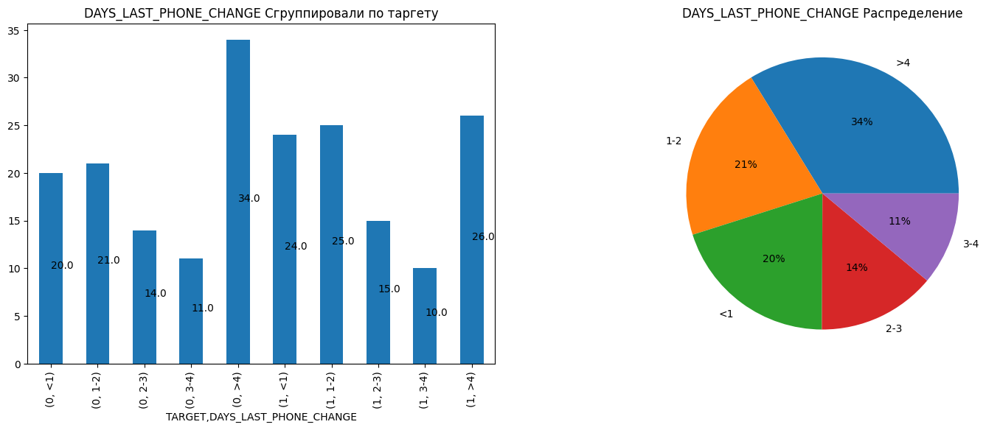

TARGET  DAYS_LAST_PHONE_CHANGE
0       <1                        20.0
        1-2                       21.0
        2-3                       14.0
        3-4                       11.0
        >4                        34.0
1       <1                        24.0
        1-2                       25.0
        2-3                       15.0
        3-4                       10.0
        >4                        26.0
Name: DAYS_LAST_PHONE_CHANGE, dtype: float64





In [ ]:
for col in data_days_cols:
    distributionGraphs(col)

# Инсайты из данных

### Топ 10 корреляций в данных

In [ ]:
correlation_matrix = current_data[data_numeric_cols].corr()

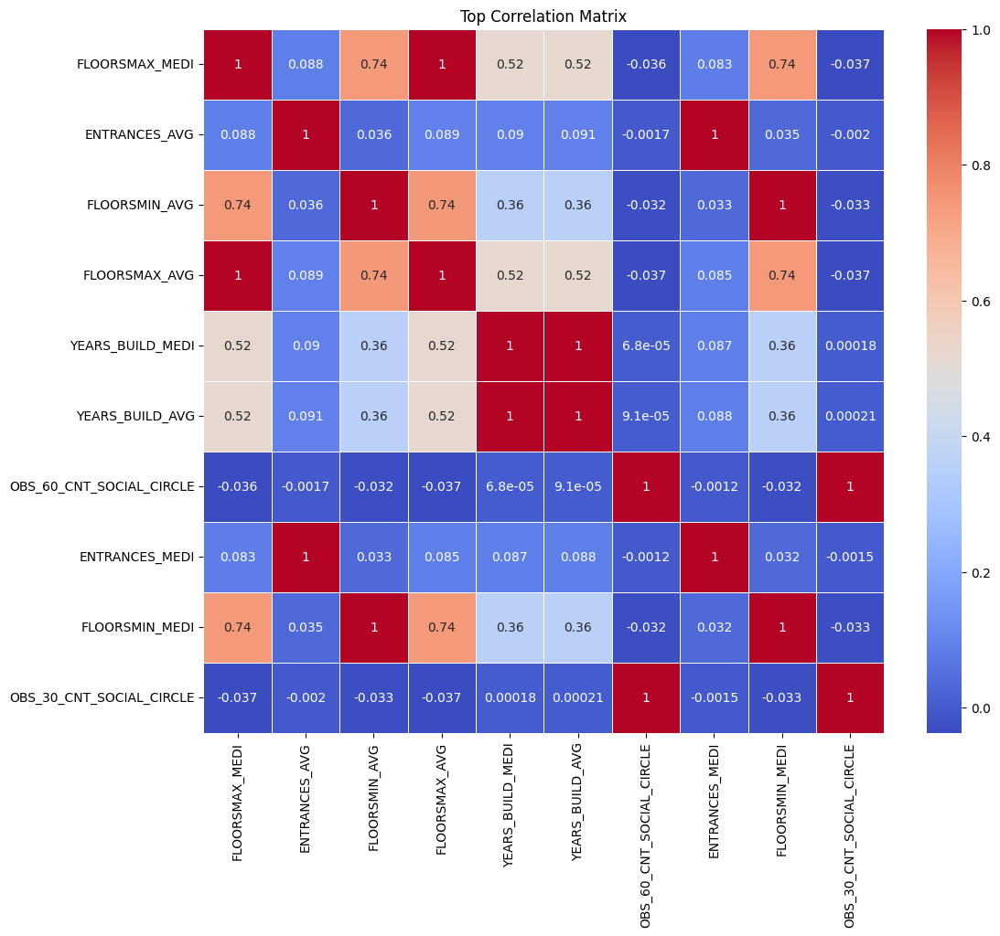

In [ ]:
correlation_matrix_pd = correlation_matrix
num_top_correlations = 10

top_correlations = correlation_matrix_pd.abs().unstack().sort_values(ascending=False)
top_correlations = top_correlations[top_correlations != 1.0]
top_correlations = top_correlations[:num_top_correlations]

top_correlation_cols = set()
for col1, col2 in top_correlations.index:
    top_correlation_cols.add(col1)
    top_correlation_cols.add(col2)

plt.figure(figsize=(12, 10))
sns.heatmap(
    correlation_matrix_pd.loc[top_correlation_cols, top_correlation_cols],
    annot=True,
    cmap='coolwarm',
    linewidths=0.5
)
plt.title('Top Correlation Matrix')
plt.show()

In [ ]:
import plotly.offline as py
import plotly.graph_objects as go

corr = current_data.corr().values

data = [
    go.Heatmap(
        z=corr,
        x=current_data.columns.values,
        y=current_data.columns.values,
        colorscale='Viridis',
        reversescale = False,
        opacity = 1.0 )
]

layout = go.Layout(
    title='Pearson Correlation of features',
    xaxis = dict(ticks='', nticks=36),
    yaxis = dict(ticks='' ),
    width = 900, height = 700,
margin=dict(
    l=240,
),)

fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='labelled-heatmap')

### EXT_SOURCE

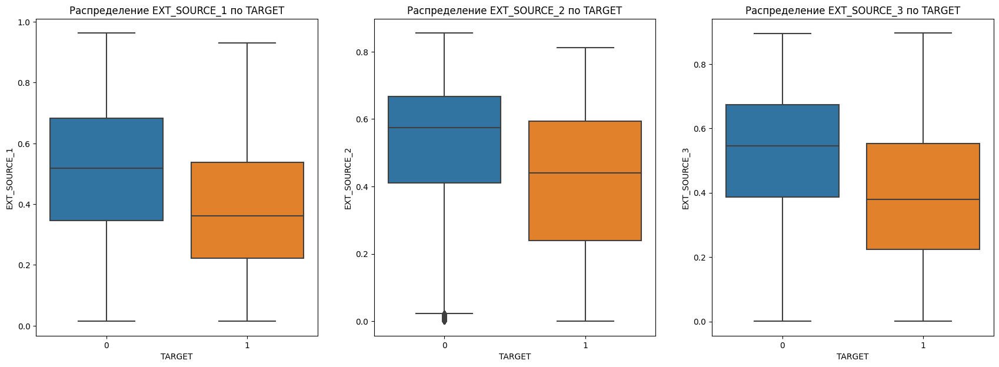

In [ ]:
plt.figure(figsize=(21,7))

plt.subplot(131)
sns.boxplot(x='TARGET', y='EXT_SOURCE_1' ,data=current_data,)
plt.title('Распределение EXT_SOURCE_1 по TARGET')

plt.subplot(132)
sns.boxplot(x='TARGET', y='EXT_SOURCE_2' ,data=current_data,)
plt.title('Распределение EXT_SOURCE_2 по TARGET')

plt.subplot(133)
sns.boxplot(x='TARGET', y='EXT_SOURCE_3' ,data=current_data,)
plt.title('Распределение EXT_SOURCE_3 по TARGET')

plt.show()

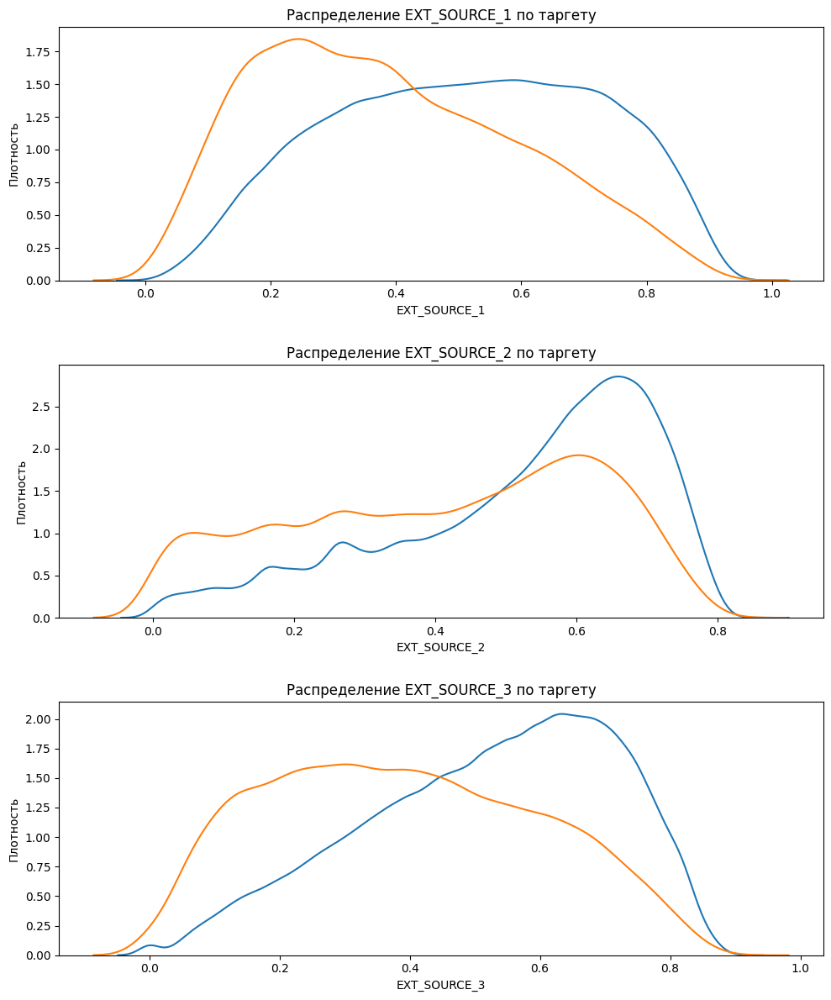

In [ ]:
plt.figure(figsize = (10, 12))

for i, source in enumerate(['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']):
    plt.subplot(3, 1, i + 1)
    sns.kdeplot(current_data.loc[current_data['TARGET'] == 0, source], label = 'target == 0')
    sns.kdeplot(current_data.loc[current_data['TARGET'] == 1, source], label = 'target == 1')
    plt.title('Распределение %s по таргету' % source)
    plt.xlabel('%s' % source); plt.ylabel('Плотность');

plt.tight_layout(h_pad = 2.5)

# Создание новых признаков

In [ ]:
def one_hot_encoder(df, nan_as_category=True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns=categorical_columns, dummy_na=nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns

def group(df_to_agg, prefix, aggregations, aggregate_by= 'SK_ID_CURR'):
    agg_df = df_to_agg.groupby(aggregate_by).agg(aggregations)
    agg_df.columns = pd.Index(['{}{}_{}'.format(prefix, e[0], e[1].upper())
                               for e in agg_df.columns.tolist()])
    return agg_df.reset_index()

def group_and_merge(df_to_agg, df_to_merge, prefix, aggregations, aggregate_by= 'SK_ID_CURR'):
    agg_df = group(df_to_agg, prefix, aggregations, aggregate_by= aggregate_by)
    return df_to_merge.merge(agg_df, how='left', on= aggregate_by)

def do_sum(dataframe, group_cols, counted, agg_name):
    gp = dataframe[group_cols + [counted]].groupby(group_cols)[counted].sum().reset_index().rename(columns={counted: agg_name})
    dataframe = dataframe.merge(gp, on=group_cols, how='left')
    return dataframe

def reduce_mem_usage(dataframe):
    for col in dataframe.columns:
        col_type = dataframe[col].dtype
        if col_type != object:
            c_min = dataframe[col].min()
            c_max = dataframe[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    dataframe[col] = dataframe[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    dataframe[col] = dataframe[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    dataframe[col] = dataframe[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    dataframe[col] = dataframe[col].astype(np.int64)
            elif str(col_type)[:5] == 'float':
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    dataframe[col] = dataframe[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    dataframe[col] = dataframe[col].astype(np.float32)
                else:
                    dataframe[col] = dataframe[col].astype(np.float64)
    gc.collect()
    return dataframe

nan_as_category = True

def ligthgbm_feature_selection(dataframe, index_cols, num):
    dataframe = dataframe.rename(columns=lambda x: re.sub('[^A-Za-z0-9_]+', '_', x))
    train_df = dataframe[dataframe['TARGET'].notnull()]
    train_df_X = train_df.drop('TARGET', axis=1)
    train_df_y = train_df['TARGET']

    train_columns = [col for col in train_df_X.columns if col not in index_cols]
    train_df_X = train_df_X[train_columns]

    folds = KFold(n_splits=3, shuffle=True, random_state=2024)
    importance = np.zeros(len(train_df_X.columns))
    for n_fold, (train_idx, valid_idx) in enumerate(folds.split(train_df_X, train_df_y)):
        train_x, train_y = train_df_X.iloc[train_idx], train_df_y.iloc[train_idx]
        valid_x, valid_y = train_df_X.iloc[valid_idx], train_df_y.iloc[valid_idx]

        clf = LGBMClassifier(random_state=0, device_type='gpu', n_estimators=500, silent=-1, verbose=-1)
        clf.fit(train_x, train_y, eval_set=[(train_x, train_y), (valid_x, valid_y)], eval_metric='auc',
                callbacks=[lgb.early_stopping(stopping_rounds=100), lgb.log_evaluation(100)])

        importance += clf.feature_importances_

    fi = pd.DataFrame()
    fi['FEAT'] = train_df_X.columns
    fi['importance'] = importance
    fi = fi.sort_values(by='importance', ascending=False)
    fi = fi[fi.importance != 0]

    print("\n", "=" * 50)
    print("top ", str(num), " features:")
    pd.set_option('display.max_rows', None)
    print(fi.head(num))
    pd.reset_option('display.max_rows')
    print("=" * 50, "\n")

    selected_features = list(set(fi.head(num).FEAT.values).union(set(['TARGET', 'SK_ID_CURR'])))
    dataframe = dataframe[selected_features]
    return dataframe

In [ ]:
def application():
    df = pd.read_csv(r'drive/MyDrive/Colab_Notebooks/BIT_Home_Work/input/home-credit-default-risk/application_train.csv')
    test_df = pd.read_csv(r'drive/MyDrive/Colab_Notebooks/BIT_Home_Work/input/home-credit-default-risk/application_test.csv')
    df = df.append(test_df).reset_index()

    df = df[df['CODE_GENDER'] != 'XNA']
    df = df[df['AMT_INCOME_TOTAL'] < 20000000]
    df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace=True)
    df['DAYS_LAST_PHONE_CHANGE'].replace(0, np.nan, inplace=True)

    def get_age_label(days_birth):
        age_years = -days_birth / 365
        if age_years < 30: return 1
        elif age_years < 40: return 2
        elif age_years < 50: return 3
        elif age_years < 65: return 4
        elif age_years < 99: return 5
        else: return 0
    # was not selected :(
    df['APP_AGE_RANGE'] = df['DAYS_BIRTH'].apply(lambda x: get_age_label(x))

    df['NAME_EDUCATION_TYPE'].fillna("NaN value", inplace=True)
    is_secondary_or_null = (df['NAME_EDUCATION_TYPE'].str.contains('NaN value') | df['NAME_EDUCATION_TYPE'].str.contains('Secondary / secondary special'))
    # SUPER
    df['APP_EDUCATIONxPHONE'] = (is_secondary_or_null * 10 + (df['NAME_EDUCATION_TYPE'].str.contains('Higher education'))) * df['DAYS_LAST_PHONE_CHANGE']

    df['NAME_FAMILY_STATUS'].fillna("NaN value", inplace=True)
    is_single_or_null = (df['NAME_FAMILY_STATUS'].str.contains('NaN value') | df['NAME_FAMILY_STATUS'].str.contains('Single / not married'))
    df['APP_FAMILYxCHILDRENxEDUCATION'] = (is_secondary_or_null * 10 + (df['NAME_EDUCATION_TYPE'].str.contains('Higher education'))) * (is_single_or_null + (df['NAME_FAMILY_STATUS'].str.contains('Married')) * 10 + (df['NAME_FAMILY_STATUS'].str.contains('Civil marriage')) * 5) * (df['CNT_CHILDREN'])

    df['OCCUPATION_TYPE'].fillna("NaN value", inplace=True)
    is_laborer_or_null = (df['OCCUPATION_TYPE'].str.contains('NaN value') | df['OCCUPATION_TYPE'].str.contains('Laborers'))
    # SUPER
    df['APP_FAMILYxLABORER'] = (is_laborer_or_null + ~(df['OCCUPATION_TYPE'].str.contains('Laborers')) * 10) * (is_single_or_null + (df['NAME_FAMILY_STATUS'].str.contains('Married')) * 10 + (df['NAME_FAMILY_STATUS'].str.contains('Civil marriage')) * 5)
    # SUPER
    df['APP_GENDERxFAMILY'] = ((df['CODE_GENDER'].str.contains('F')) * 10 + (df['CODE_GENDER'].str.contains('M'))) * ((df['NAME_FAMILY_STATUS'].str.contains('Married')) * 10 + (df['NAME_FAMILY_STATUS'].str.contains('Civil marriage')) * 5 + (df['NAME_FAMILY_STATUS'].str.contains('Single / not married'))) * (-df['APP_AGE_RANGE'])

    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
        df[bin_feature], uniques = pd.factorize(df[bin_feature])

    df, cat_cols = one_hot_encoder(df, nan_as_category)

    docs = [f for f in df.columns if 'FLAG_DOC' in f]
    # was not selected :(
    df['APP_DOCUMENT_COUNT'] = df[docs].sum(axis=1)
    df['APP_DOC_KURT'] = df[docs].kurtosis(axis=1)
    # was not selected :(
    df['APP_DOC_SKEW'] = df[docs].skew(axis=1)

    df['APP_DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    # SUPER
    df['APP_DAYS_EMPLOYED_DAYS_BIRTH_diff'] = df['DAYS_EMPLOYED'] - df['DAYS_BIRTH']
    df['APP_INCOME_CREDIT_PERC'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']
    df['APP_INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    # SUPER
    df['APP_ANNUITY_INCOME_PERC'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']

    # SUPER
    df['APP_PAYMENT_RATE'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']
    # SUPER
    df['APP_CREDIT_TO_GOODS_RATIO'] = df['AMT_CREDIT'] / df['AMT_GOODS_PRICE']
    df['APP_GOODS_INCOME_RATIO'] = df['AMT_GOODS_PRICE'] / df['AMT_INCOME_TOTAL']
    # SUPER
    df['APP_INCOME_TO_BIRTH_RATIO'] = df['AMT_INCOME_TOTAL'] / df['DAYS_BIRTH']
    # SUPER
    df['APP_INCOME_TO_EMPLOYED_RATIO'] = df['AMT_INCOME_TOTAL'] / df['DAYS_EMPLOYED']
    df['APP_CAR_TO_BIRTH_RATIO'] = df['OWN_CAR_AGE'] / df['DAYS_BIRTH']
    df['APP_CAR_TO_EMPLOYED_RATIO'] = df['OWN_CAR_AGE'] / df['DAYS_EMPLOYED']
    df['APP_PHONE_TO_BIRTH_RATIO'] = df['DAYS_LAST_PHONE_CHANGE'] / df['DAYS_BIRTH']
    df['APP_OLDNESS'] = (-df['DAYS_EMPLOYED'] * 2 - df['DAYS_BIRTH'] + df['OWN_CAR_AGE'] * 365 * 5) / df['DAYS_BIRTH']
    # was not selected :(
    df['APP_IS_GIPSY'] = df['CNT_FAM_MEMBERS'] / (df['CNT_CHILDREN'] + 1)
    # SUPER
    df['APP_IS_DUDE_RICH'] = ((df['REGION_RATING_CLIENT_W_CITY'] == 1) * 3 + (df['REGION_RATING_CLIENT_W_CITY'] == 2) * 2 + (df['REGION_RATING_CLIENT_W_CITY'] == 3)) * df['AMT_INCOME_TOTAL'] * df['DAYS_EMPLOYED']
    # SUPER
    df['APP_PHONExAGE_RANGExFLAG_OWN_CAR'] = ((df['FLAG_OWN_CAR'] == 1) * 10 + (df['FLAG_OWN_CAR'] == 0)) * df['DAYS_LAST_PHONE_CHANGE'] * (-df['APP_AGE_RANGE'])
    # SUPER
    df['APP_FLAG_DOCUMENT_3xDAYS_BIRTH'] = ((df['FLAG_DOCUMENT_3'] == 1) * 10 + (df['FLAG_DOCUMENT_3'] == 0)) * df['APP_AGE_RANGE']
    df['APP_EXT_SOURCES_PROD'] = df['EXT_SOURCE_1'] * df['EXT_SOURCE_2'] * df['EXT_SOURCE_3']
    # was not selected :(
    df['APP_EXT_SOURCES_WEIGHTED'] = df['EXT_SOURCE_1'] * 3 + df['EXT_SOURCE_2'] * 1 + df['EXT_SOURCE_3'] * 5
    np.warnings.filterwarnings('ignore', r'All-NaN (slice|axis) encountered')
    # SUPER
    for function_name in ['min', 'max', 'mean']:
        feature_name = 'EXT_SOURCES_{}'.format(function_name.upper())
        df[feature_name] = eval('np.{}'.format(function_name)) (
            df[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']], axis=1)

    # SUPER
    df['APP_SCORE1_TO_EMPLOY_RATIO'] = df['EXT_SOURCE_1'] / (df['DAYS_EMPLOYED'] / 365.25)
    # SUPER
    df['APP_SCORE3_TO_EMPLOY_RATIO'] = df['EXT_SOURCE_3'] / (df['DAYS_EMPLOYED'] / 365.25)
    # was not selected :(
    df['APP_EXT_SOURCE_1*EXT_SOURCE_3*DAYS_BIRTH'] = df['EXT_SOURCE_1'] * df['EXT_SOURCE_3'] * df['DAYS_BIRTH']
    # SUPER
    df['APP_EXT_SOURCE_1_TO_CNT_FAM_RATIO'] = df['EXT_SOURCE_1'] / df['CNT_FAM_MEMBERS']
    # SUPER
    df['APP_EXT_SOURCE_3_TO_CNT_FAM_RATIO'] = df['EXT_SOURCE_3'] / df['CNT_FAM_MEMBERS']
    df['APP_EXT_SOURCE_1_TO_GOODS_RATIO'] = df['EXT_SOURCE_1'] / df['AMT_GOODS_PRICE']
    # SUPER
    df['APP_EXT_SOURCE_3_TO_GOODS_RATIO'] = df['EXT_SOURCE_3'] / df['AMT_GOODS_PRICE']
    df['APP_EXT_SOURCE_1_TO_CREDIT_RATIO'] = df['EXT_SOURCE_1'] / df['AMT_CREDIT']
    df['APP_EXT_SOURCE_2_TO_CREDIT_RATIO'] = df['EXT_SOURCE_2'] / df['AMT_CREDIT']
    # was not selected :(
    df['APP_EXT_SOURCE_1*EXT_SOURCE_3'] = df['EXT_SOURCE_1'] * df['EXT_SOURCE_3']
    # was not selected :(
    df['APP_EXT_SOURCE_2*EXT_SOURCE_3'] = df['EXT_SOURCE_2'] * df['EXT_SOURCE_3']
    # was not selected :(
    df['APP_EXT_SOURCE_1*EXT_SOURCE_2'] = df['EXT_SOURCE_1'] * df['EXT_SOURCE_2']
    # was not selected :(
    df['APP_EXT_SOURCE_1*DAYS_EMPLOYED'] = df['EXT_SOURCE_1'] * df['DAYS_EMPLOYED']
    # was not selected :(
    df['APP_EXT_SOURCE_2*DAYS_EMPLOYED'] = df['EXT_SOURCE_2'] * df['DAYS_EMPLOYED']
    # was not selected :(
    df['APP_EXT_SOURCE_3*DAYS_EMPLOYED'] = df['EXT_SOURCE_3'] * df['DAYS_EMPLOYED']
    print('"Application_Train_Test" final shape:', df.shape)
    return df

In [ ]:
def bureau_bb():
    bureau = pd.read_csv(r'drive/MyDrive/Colab_Notebooks/BIT_Home_Work/input/home-credit-default-risk/bureau.csv')
    bb = pd.read_csv(r'drive/MyDrive/Colab_Notebooks/BIT_Home_Work/input/home-credit-default-risk/bureau_balance.csv')

    bureau['BUREAU_CREDIT_TO_ANNUITY_RATIO'] = bureau['AMT_CREDIT_SUM'] / bureau['AMT_ANNUITY']
    bureau['BUREAU_CREDIT_ENDDATE_DIFF'] = -bureau['DAYS_CREDIT'] + bureau['DAYS_CREDIT_ENDDATE']
    bureau['BUREAU_IS_EXPIRED'] = bureau['CREDIT_DAY_OVERDUE'].apply(lambda x: 1 if x > 0 else 0)
    bureau['BUREAU_IS_EXPIRED_OVER120'] = bureau['CREDIT_DAY_OVERDUE'].apply(lambda x: 1 if x > 120 else 0)
    bureau['BUREAU_DEBT_PERCENTAGE'] = bureau['AMT_CREDIT_SUM'] / bureau['AMT_CREDIT_SUM_DEBT']
    # SUPER
    bureau['BUREAU_DEBT_CREDIT_DIFF'] = bureau['AMT_CREDIT_SUM'] - bureau['AMT_CREDIT_SUM_DEBT']
    bureau['BUREAU_CREDIT_TO_ENDDATE'] = bureau['AMT_CREDIT_SUM'] / (-bureau['DAYS_CREDIT_ENDDATE'])
    bureau['BUREAU_DEBT_TO_ENDDATE'] = bureau['AMT_CREDIT_SUM_DEBT'] / (-bureau['DAYS_CREDIT_ENDDATE'])
    # SUPER
    bureau['BUREAU_CREDIT_TO_OVERDUE'] = bureau['AMT_CREDIT_SUM'] * (-bureau['AMT_CREDIT_SUM_OVERDUE'])
    # SUPER
    bureau['BUREAU_DEBT_TO_OVERDUE'] = bureau['AMT_CREDIT_SUM_DEBT'] * (-bureau['AMT_CREDIT_SUM_OVERDUE'])

    def get_sum_label(sum):
        if sum < 100000: return 1
        elif sum < 500000: return 5
        elif sum < 1000000: return 10
        elif sum < 2000000: return 20
        elif sum < 5000000: return 50
        elif sum < 10000000: return 100
        elif sum < 20000000:  return 200
        elif sum < 100000000: return 1000
        else: return 0
    # was not selected :(
    bureau['BUREAU_BIG_MONEY'] = bureau['AMT_CREDIT_SUM'].apply(lambda x: get_sum_label(x))

    bb, bb_cat = one_hot_encoder(bb, nan_as_category)
    bureau, bureau_cat = one_hot_encoder(bureau, nan_as_category)

    bb_aggregations = {'MONTHS_BALANCE': ['min', 'max', 'size']}
    for col in bb_cat:
        bb_aggregations[col] = ['mean']

    bb_agg = bb.groupby('SK_ID_BUREAU').agg(bb_aggregations)
    bb_agg.columns = pd.Index([e[0] + "_" + e[1].upper() for e in bb_agg.columns.tolist()])
    bureau = bureau.join(bb_agg, how='left', on='SK_ID_BUREAU')

    num_aggregations = {
        'DAYS_CREDIT': ['min', 'max', 'mean', 'var'],
        'DAYS_CREDIT_ENDDATE': ['min', 'max', 'mean'],
        'DAYS_CREDIT_UPDATE': ['mean'],
        'CREDIT_DAY_OVERDUE': ['max', 'mean', 'min'],
        'AMT_CREDIT_MAX_OVERDUE': ['mean', 'max'],
        'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_OVERDUE': ['mean', 'max', 'sum'],
        'AMT_CREDIT_SUM_LIMIT': ['mean', 'sum'],
        'AMT_ANNUITY': ['max', 'mean', 'sum'],
        'CNT_CREDIT_PROLONG': ['sum'],
        'DAYS_ENDDATE_FACT': ['min', 'max', 'mean'],
        'SK_ID_BUREAU': ['count'],
        'MONTHS_BALANCE_MIN': ['min'],
        'MONTHS_BALANCE_MAX': ['max'],
        'MONTHS_BALANCE_SIZE': ['mean', 'sum'],
        'BUREAU_CREDIT_TO_ANNUITY_RATIO': ['min', 'max', 'mean'],
        'BUREAU_CREDIT_ENDDATE_DIFF': ['min', 'max'],
        'BUREAU_IS_EXPIRED': ['mean', 'sum'],
        'BUREAU_IS_EXPIRED_OVER120': ['mean', 'sum'],
        'BUREAU_DEBT_PERCENTAGE': ['min', 'max', 'mean'],
        'BUREAU_DEBT_CREDIT_DIFF': ['min', 'max', 'mean'],
        'BUREAU_CREDIT_TO_ENDDATE': ['min', 'max', 'mean'],
        'BUREAU_DEBT_TO_ENDDATE': ['min', 'max', 'mean'],
        'BUREAU_CREDIT_TO_OVERDUE': ['min', 'max', 'mean'],
        'BUREAU_DEBT_TO_OVERDUE': ['min', 'max', 'mean'],
        'BUREAU_BIG_MONEY': ['min', 'max']
    }

    cat_aggregations = {}
    for cat in bureau_cat: cat_aggregations[cat] = ['mean']
    for cat in bb_cat: cat_aggregations[cat + "_MEAN"] = ['mean']
    bureau_agg = bureau.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    bureau_agg.columns = pd.Index(['BURO_' + e[0] + "_" + e[1].upper() for e in bureau_agg.columns.tolist()])

    active = bureau[bureau['CREDIT_ACTIVE_Active'] == 1]
    active_agg = active.groupby('SK_ID_CURR').agg(num_aggregations)
    active_agg.columns = pd.Index(['ACTIVE_' + e[0] + "_" + e[1].upper() for e in active_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(active_agg, how='left', on='SK_ID_CURR')

    closed = bureau[bureau['CREDIT_ACTIVE_Closed'] == 1]
    closed_agg = closed.groupby('SK_ID_CURR').agg(num_aggregations)
    closed_agg.columns = pd.Index(['CLOSED_' + e[0] + "_" + e[1].upper() for e in closed_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(closed_agg, how='left', on='SK_ID_CURR')

    print('"Bureau/Bureau Balance" final shape:', bureau_agg.shape)
    return bureau_agg

In [ ]:
def previous_application():
    prev = pd.read_csv(r'drive/MyDrive/Colab_Notebooks/BIT_Home_Work/input/home-credit-default-risk/previous_application.csv')

    prev, cat_cols = one_hot_encoder(prev, nan_as_category=True)

    prev['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace=True)
    prev['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace=True)
    prev['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace=True)
    prev['DAYS_LAST_DUE'].replace(365243, np.nan, inplace=True)
    prev['DAYS_TERMINATION'].replace(365243, np.nan, inplace=True)

    prev['PREV_APPLICATION_CREDIT_DIFF'] = prev['AMT_APPLICATION'] - prev['AMT_CREDIT']
    prev['PREV_CREDIT_TO_ANNUITY_RATIO'] = prev['AMT_CREDIT'] / prev['AMT_ANNUITY']
    prev['PREV_SIMPLE_INTERESTS'] = (prev['AMT_ANNUITY'] * prev['CNT_PAYMENT'] / prev['AMT_CREDIT'] - 1) / prev['CNT_PAYMENT']
    prev['PREV_DAYS_LAST_DUE_DIFF'] = prev['DAYS_LAST_DUE_1ST_VERSION'] - prev['DAYS_LAST_DUE']
    prev['PREV_GOODS_DIFF'] = prev['AMT_APPLICATION'] - prev['AMT_GOODS_PRICE']
    prev['PREV_GOODS_APPL_RATIO'] = prev['AMT_GOODS_PRICE'] / prev['AMT_APPLICATION']
    prev['PREV_ANNUITY_APPL_RATIO'] = prev['AMT_ANNUITY'] / prev['AMT_APPLICATION']
    prev['PREV_APP_CREDIT_PERC'] = prev['AMT_APPLICATION'] / prev['AMT_CREDIT']
    prev['PREV_CREDIT_DOWN_PAYMENT_PREC'] = prev['AMT_DOWN_PAYMENT'] / prev['AMT_CREDIT']

    num_aggregations = {
        'AMT_ANNUITY': ['min', 'max', 'mean', 'sum'],
        'AMT_APPLICATION': ['min', 'max', 'mean', 'sum'],
        'AMT_CREDIT': ['min', 'max', 'mean', 'sum'],
        'AMT_DOWN_PAYMENT': ['min', 'max', 'mean', 'sum'],
        'AMT_GOODS_PRICE': ['min', 'max', 'mean', 'sum'],
        'HOUR_APPR_PROCESS_START': ['min', 'max', 'mean'],
        'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'DAYS_DECISION': ['min', 'max', 'mean'],
        'CNT_PAYMENT': ['mean', 'sum'],
        'SK_ID_PREV': ['nunique'],
        'DAYS_TERMINATION': ['max'],
        'PREV_CREDIT_TO_ANNUITY_RATIO': ['mean', 'max'],
        'PREV_APPLICATION_CREDIT_DIFF': ['min', 'max', 'mean', 'sum'],
        'PREV_SIMPLE_INTERESTS': ['mean', 'max'],
        'PREV_DAYS_LAST_DUE_DIFF': ['mean', 'max', 'sum'],
        'PREV_GOODS_DIFF': ['mean', 'max', 'sum'],
        'PREV_GOODS_APPL_RATIO': ['mean', 'max'],
        'PREV_ANNUITY_APPL_RATIO': ['min', 'max', 'mean'],
        'PREV_APP_CREDIT_PERC': ['min', 'max', 'mean', 'var'],
        'PREV_CREDIT_DOWN_PAYMENT_PREC': ['min', 'max', 'mean']
    }

    cat_aggregations = {}
    for cat in cat_cols:
        cat_aggregations[cat] = ['mean']

    prev_agg = prev.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    prev_agg.columns = pd.Index(['PREV_' + e[0] + "_" + e[1].upper() for e in prev_agg.columns.tolist()])

    approved = prev[prev['NAME_CONTRACT_STATUS_Approved'] == 1]
    approved_agg = approved.groupby('SK_ID_CURR').agg(num_aggregations)
    approved_agg.columns = pd.Index(['APPROVED_' + e[0] + "_" + e[1].upper() for e in approved_agg.columns.tolist()])
    prev_agg = prev_agg.join(approved_agg, how='left', on='SK_ID_CURR')

    refused = prev[prev['NAME_CONTRACT_STATUS_Refused'] == 1]
    refused_agg = refused.groupby('SK_ID_CURR').agg(num_aggregations)
    refused_agg.columns = pd.Index(['REFUSED_' + e[0] + "_" + e[1].upper() for e in refused_agg.columns.tolist()])
    prev_agg = prev_agg.join(refused_agg, how='left', on='SK_ID_CURR')

    print('"Previous Applications" final shape:', prev_agg.shape)
    return prev_agg

In [ ]:
def pos_cash():
    pos = pd.read_csv(r'drive/MyDrive/Colab_Notebooks/BIT_Home_Work/input/home-credit-default-risk/POS_CASH_balance.csv')

    pos, cat_cols = one_hot_encoder(pos, nan_as_category=True)

    pos['LATE_PAYMENT'] = pos['SK_DPD'].apply(lambda x: 1 if x > 0 else 0)
    pos['POS_IS_DPD'] = pos['SK_DPD'].apply(lambda x: 1 if x > 0 else 0)
    pos['POS_IS_DPD_UNDER_120'] = pos['SK_DPD'].apply(lambda x: 1 if (x > 0) & (x < 120) else 0)
    pos['POS_IS_DPD_OVER_120'] = pos['SK_DPD'].apply(lambda x: 1 if x >= 120 else 0)

    aggregations = {
        'MONTHS_BALANCE': ['max', 'mean', 'size', 'min'],
        'SK_DPD': ['max', 'mean', 'sum', 'var', 'min'],
        'SK_DPD_DEF': ['max', 'mean', 'sum'],
        'SK_ID_PREV': ['nunique'],
        'SK_ID_CURR': ['count'],
        'CNT_INSTALMENT': ['min', 'max', 'mean', 'sum'],
        'CNT_INSTALMENT_FUTURE': ['min', 'max', 'mean', 'sum'],
        'LATE_PAYMENT': ['min', 'max', 'mean'],
        'POS_IS_DPD': ['mean', 'sum'],
        'POS_IS_DPD_UNDER_120': ['mean', 'sum'],
        'POS_IS_DPD_OVER_120': ['mean', 'sum'],
    }

    for cat in cat_cols:
        aggregations[cat] = ['mean']

    pos_agg = pos.groupby('SK_ID_CURR').agg(aggregations)
    pos_agg.columns = pd.Index(['POS_' + e[0] + "_" + e[1].upper() for e in pos_agg.columns.tolist()])

    print('"Pos-Cash" balance final shape:', pos_agg.shape)
    return pos_agg

In [ ]:
def credit_card():
    cc = pd.read_csv(r'drive/MyDrive/Colab_Notebooks/BIT_Home_Work/input/home-credit-default-risk/credit_card_balance.csv')

    cc, cat_cols = one_hot_encoder(cc, nan_as_category=True)

    cc['LIMIT_USE'] = cc['AMT_BALANCE'] / cc['AMT_CREDIT_LIMIT_ACTUAL']
    cc['PAYMENT_DIV_MIN'] = cc['AMT_PAYMENT_CURRENT'] / cc['AMT_INST_MIN_REGULARITY']
    cc['LATE_PAYMENT'] = cc['SK_DPD'].apply(lambda x: 1 if x > 0 else 0)
    cc['DRAWING_LIMIT_RATIO'] = cc['AMT_DRAWINGS_ATM_CURRENT'] / cc['AMT_CREDIT_LIMIT_ACTUAL']
    cc['CARD_IS_DPD_UNDER_120'] = cc['SK_DPD'].apply(lambda x: 1 if (x > 0) & (x < 120) else 0)
    cc['CARD_IS_DPD_OVER_120'] = cc['SK_DPD'].apply(lambda x: 1 if x >= 120 else 0)

    cc_agg = cc.groupby('SK_ID_CURR').agg(['min', 'max', 'mean', 'sum', 'var'])
    cc_agg.columns = pd.Index(['CC_' + e[0] + "_" + e[1].upper() for e in cc_agg.columns.tolist()])

    cc_agg['CC_COUNT'] = cc.groupby('SK_ID_CURR').size()
    last_ids = cc.groupby('SK_ID_PREV')['MONTHS_BALANCE'].idxmax()
    last_months_df = cc[cc.index.isin(last_ids)]
    cc_agg = group_and_merge(last_months_df, cc_agg, 'CC_LAST_', {'AMT_BALANCE': ['mean', 'max']})

    CREDIT_CARD_TIME_AGG = {
        'AMT_BALANCE': ['mean', 'max'],
        'LIMIT_USE': ['max', 'mean'],
        'AMT_CREDIT_LIMIT_ACTUAL':['max'],
        'AMT_DRAWINGS_ATM_CURRENT': ['max', 'sum'],
        'AMT_DRAWINGS_CURRENT': ['max', 'sum'],
        'AMT_DRAWINGS_POS_CURRENT': ['max', 'sum'],
        'AMT_INST_MIN_REGULARITY': ['max', 'mean'],
        'AMT_PAYMENT_TOTAL_CURRENT': ['max','sum'],
        'AMT_TOTAL_RECEIVABLE': ['max', 'mean'],
        'CNT_DRAWINGS_ATM_CURRENT': ['max','sum', 'mean'],
        'CNT_DRAWINGS_CURRENT': ['max', 'mean', 'sum'],
        'CNT_DRAWINGS_POS_CURRENT': ['mean'],
        'SK_DPD': ['mean', 'max', 'sum'],
        'LIMIT_USE': ['min', 'max'],
        'DRAWING_LIMIT_RATIO': ['min', 'max'],
        'LATE_PAYMENT': ['mean', 'sum'],
        'CARD_IS_DPD_UNDER_120': ['mean', 'sum'],
        'CARD_IS_DPD_OVER_120': ['mean', 'sum']
    }

    for months in [12, 24, 48]:
        cc_prev_id = cc[cc['MONTHS_BALANCE'] >= -months]['SK_ID_PREV'].unique()
        cc_recent = cc[cc['SK_ID_PREV'].isin(cc_prev_id)]
        prefix = 'INS_{}M_'.format(months)
        cc_agg = group_and_merge(cc_recent, cc_agg, prefix, CREDIT_CARD_TIME_AGG)

    print('"Credit Card Balance" final shape:', cc_agg.shape)
    return cc_agg

In [ ]:
def data_post_processing(dataframe):
    print(f'---=> the DATA POST-PROCESSING is beginning, the dataset has {dataframe.shape[1]} features')
    dataframe = dataframe.rename(columns=lambda x: re.sub('[^A-Za-z0-9_]+', '_', x))
    dataframe = reduce_mem_usage(dataframe)
    return dataframe

def continue_data_processing(dataframe):
    index_cols = ['TARGET', 'SK_ID_CURR', 'SK_ID_BUREAU', 'SK_ID_PREV', 'index']
    num = 200
    dataframe = ligthgbm_feature_selection(dataframe, index_cols, num)
    print(f'---=> the DATA POST-PROCESSING is ended!, now the dataset has a total {dataframe.shape[1]} features')
    gc.collect()
    return dataframe

In [ ]:
# def get_random_params():
#     params = {
#         'boosting_type': 'gbdt',
#         'metric': 'auc',
#         'num_leaves': random.randint(10, 60),
#         'max_depth': random.randint(10, 30),
#         'learning_rate': random.choice([0.0001, 0.0005, 0.001, 0.005, 0.01]),
#         'n_estimators': random.randint(1000, 20000),
#         'objective': 'binary',
#         'reg_alpha': random.choice([0.001, 0.005, 0.01, 0.05, 0.1]),
#         'reg_lambda': random.choice([0.001, 0.005, 0.01, 0.05, 0.1]),
#         'colsample_bytree': random.choice([0.4, 0.5, 0.6, 0.7, 0.8, 0.9]),
#         'min_child_samples': random.randint(10, 100),
#         'subsample_for_bin': random.randint(50000, 300000)
#     }
#     return params

# def get_best_params(hyper_rounds, n_folds, dataframe):
#     train_df = dataframe[dataframe['TARGET'].notnull()]
#     train_df_X = train_df.drop('TARGET', axis=1)
#     train_df_y = train_df['TARGET']
#     best_params = None
#     best_auc = None
#     lgb_train = lgb.Dataset(data=train_df_X, label=train_df_y)
#     for i in tqdm(range(hyper_rounds)):
#         curr_params = get_random_params()
#         start = time.time()
#         eval_hist = lgb.cv(curr_params, lgb_train, nfold = n_folds, random_seed = 2024, callbacks=[lgb.early_stopping(stopping_rounds=100), lgb.log_evaluation(100)])
#         end = time.time()
#         curr_auc = eval_hist['auc-mean'][-1]
#         if curr_auc > best_auc:
#             best_params = curr_params
#             best_auc = curr_auc
#     return best_params

In [ ]:
def Kfold_LightGBM(df):
    train_df = df[df['TARGET'].notnull()]
    test_df = df[df['TARGET'].isnull()]

    del(df)
    gc.collect()

    folds = KFold(n_splits=5, shuffle=True, random_state=2023)
    oof_preds = np.zeros(train_df.shape[0])
    sub_preds = np.zeros(test_df.shape[0])
    feats = [f for f in train_df.columns if f not in ['TARGET', 'SK_ID_CURR', 'SK_ID_BUREAU', 'SK_ID_PREV']]

    for n_fold, (train_idx, valid_idx) in enumerate(folds.split(train_df[feats], train_df['TARGET'])):
        train_x, train_y = train_df[feats].iloc[train_idx], train_df['TARGET'].iloc[train_idx]
        valid_x, valid_y = train_df[feats].iloc[valid_idx], train_df['TARGET'].iloc[valid_idx]

        clf = LGBMClassifier(nthread=-1, device_type='gpu', n_estimators=5000, silent=-1, verbose=-1)

        clf.fit(train_x, train_y, eval_set=[(train_x, train_y), (valid_x, valid_y)], eval_metric='auc', callbacks=[lgb.early_stopping(stopping_rounds=500), lgb.log_evaluation(500)])
        oof_preds[valid_idx] = clf.predict_proba(valid_x, num_iteration=clf.best_iteration_)[:, 1]
        sub_preds += clf.predict_proba(test_df[feats], num_iteration=clf.best_iteration_)[:, 1] / folds.n_splits
        print('Fold %2d AUC : %.6f' % (n_fold + 1, roc_auc_score(valid_y, oof_preds[valid_idx])))
        del clf, train_x, train_y, valid_x, valid_y
        gc.collect()

    print('Full AUC score %.6f' % roc_auc_score(train_df['TARGET'], oof_preds))

    test_df['TARGET'] = sub_preds
    test_df[['SK_ID_CURR', 'TARGET']].to_csv('submission.csv', index=False)

In [ ]:
df = application()
df = df.merge(bureau_bb(), how='left', on='SK_ID_CURR')
df = df.merge(previous_application(), how='left', on='SK_ID_CURR')
df = df.merge(pos_cash(), how='left', on='SK_ID_CURR')
df = df.merge(credit_card(), how='left', on='SK_ID_CURR')
print('df after final merge:', df.shape)

"Application_Train_Test" final shape: (356250, 303)
"Bureau/Bureau Balance" final shape: (305811, 230)
--=> df after merge with bureau: (356250, 533)
"Previous Applications" final shape: (338857, 336)
--=> df after merge with previous application: (356250, 869)
"Pos-Cash" balance final shape: (337252, 41)
--=> df after merge with pos cash : (356250, 910)
"Credit Card Balance" final shape: (103558, 284)
--=> df after merge with credit card: (356250, 1193)


In [ ]:
df = data_post_processing(df)

---=> the DATA POST-PROCESSING is beginning, the dataset has 1193 features

---=> df final shape: (356250, 1193)  <=--- 



In [ ]:
# del(new_df)
# gc.collect()

0

In [ ]:
new_df = df.copy()
new_df = continue_data_processing(new_df)
print('=' * 50, '\n')
print('---=> df final shape:', new_df.shape, ' <=---', '\n')
print('=' * 50)

Training until validation scores don't improve for 100 rounds
[100]	training's auc: 0.846577	training's binary_logloss: 0.214537	valid_1's auc: 0.782988	valid_1's binary_logloss: 0.239811
[200]	training's auc: 0.893684	training's binary_logloss: 0.19454	valid_1's auc: 0.782282	valid_1's binary_logloss: 0.240035
Early stopping, best iteration is:
[106]	training's auc: 0.850634	training's binary_logloss: 0.213124	valid_1's auc: 0.783146	valid_1's binary_logloss: 0.239753
Training until validation scores don't improve for 100 rounds
[100]	training's auc: 0.850691	training's binary_logloss: 0.213758	valid_1's auc: 0.777204	valid_1's binary_logloss: 0.239979
[200]	training's auc: 0.896564	training's binary_logloss: 0.193809	valid_1's auc: 0.778343	valid_1's binary_logloss: 0.239937
Early stopping, best iteration is:
[159]	training's auc: 0.88035	training's binary_logloss: 0.201268	valid_1's auc: 0.778	valid_1's binary_logloss: 0.239874
Training until validation scores don't improve for 100 

In [ ]:
# del(copy_df)
# gc.collect()

In [ ]:
# copy_df = new_df.copy()
# hyper_rounds = 20
# n_folds = 5
# best_params = get_best_params(hyper_rounds, n_folds)

In [ ]:
# del(new_copy_df)
# gc.collect()

56

In [ ]:
new_copy_df = new_df.copy()
Kfold_LightGBM(new_copy_df)
print('--=> all calculations are done!! <=--')

 ##### the ML in processing...
Training until validation scores don't improve for 500 rounds
[500]	training's auc: 0.941455	training's binary_logloss: 0.167089	valid_1's auc: 0.780746	valid_1's binary_logloss: 0.241121
Early stopping, best iteration is:
[191]	training's auc: 0.875614	training's binary_logloss: 0.203798	valid_1's auc: 0.784676	valid_1's binary_logloss: 0.239218
Fold  1 AUC : 0.784676
Training until validation scores don't improve for 500 rounds
[500]	training's auc: 0.943313	training's binary_logloss: 0.16634	valid_1's auc: 0.784222	valid_1's binary_logloss: 0.239593
Early stopping, best iteration is:
[180]	training's auc: 0.871818	training's binary_logloss: 0.205409	valid_1's auc: 0.785463	valid_1's binary_logloss: 0.238438
Fold  2 AUC : 0.785463
Training until validation scores don't improve for 500 rounds
[500]	training's auc: 0.942854	training's binary_logloss: 0.166727	valid_1's auc: 0.778632	valid_1's binary_logloss: 0.239855
Early stopping, best iteration is:
[19